In [5]:
import  scipy.signal.signaltools
%matplotlib notebook

def _centered(arr, newsize):
    # Return the center newsize portion of the array.
    newsize = np.asarray(newsize)
    currsize = np.array(arr.shape)
    startind = (currsize - newsize) // 2
    endind = startind + newsize
    myslice = [slice(startind[k], endind[k]) for k in range(len(endind))]
    return arr[tuple(myslice)]

scipy.signal.signaltools._centered = _centered

import dtscalibration

import os
import warnings

warnings.simplefilter('ignore')  # Hide warnings to avoid clutter in the notebook

from dtscalibration import suggest_cable_shift_double_ended
from dtscalibration import read_silixa_files
from matplotlib import pyplot as plt
import numpy as np
from dtscalibration import shift_double_ended

%matplotlib inline

3 files were found, each representing a single timestep
6 recorded vars were found: LAF, ST, AST, REV-ST, REV-AST, TMP
Recorded at 3553 points along the cable
The measurement is double ended
Reading the data from disk
I dont know what to do with the following data ['tmp']
I dont know what to do with the following data ['tmp']
I dont know what to do with the following data ['tmp']
<xarray.DataArray 'x' (x: 2471)>
array([1.33000e-01, 3.88000e-01, 6.42000e-01, ..., 6.27497e+02, 6.27751e+02,
       6.28006e+02])
Coordinates:
  * x        (x) float64 0.133 0.388 0.642 0.896 ... 627.2 627.5 627.8 628.0
Attributes:
    name:              distance
    description:       Length along fiber
    long_description:  Starting at connector of forward channel
    units:             m 


 <xarray.DataArray 'x' (x: 2469)>
array([1.33000e-01, 3.88000e-01, 6.42000e-01, ..., 6.26989e+02, 6.27243e+02,
       6.27497e+02])
Coordinates:
  * x        (x) float64 0.133 0.388 0.642 0.896 ... 626.7 627.0 627.2 62

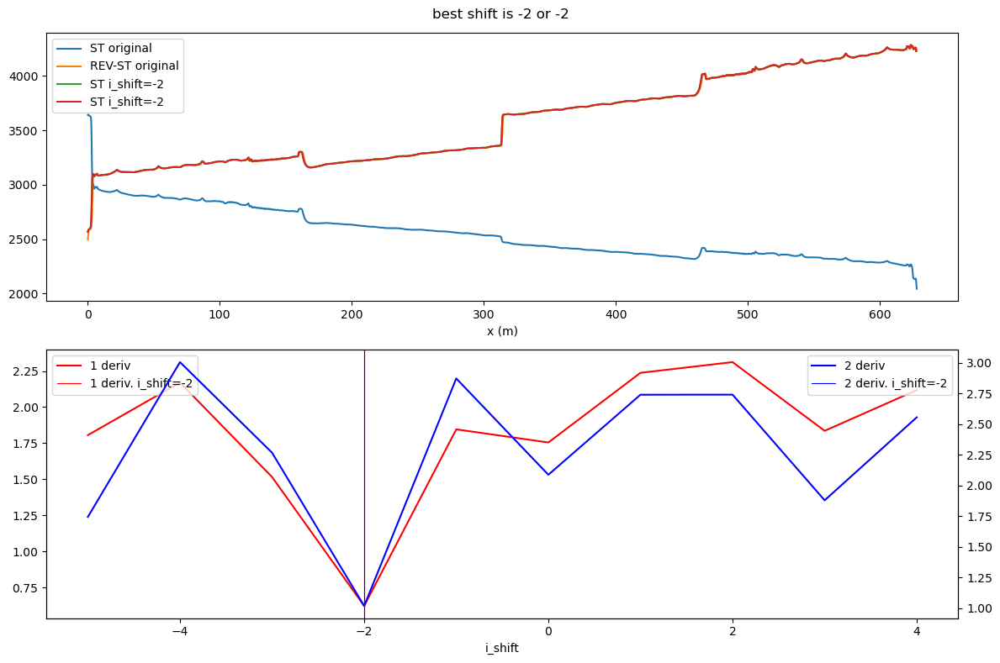

In [6]:
filepath = ''

ds_ = read_silixa_files(
    directory=filepath,
    timezone_netcdf='UTC',
    file_ext='*.xml')

ds = ds_.sel(x=slice(0, 628.2))  # only calibrate parts of the fiber


sections = {
    'probe1Temperature': [slice(130., 158.)],  # temp isolator
    }
ds.sections = sections

suggested_shift = suggest_cable_shift_double_ended(
    ds,
    np.arange(-5, 5),
    plot_result=True,
    figsize=(12,8))

ds_restored = shift_double_ended(ds, suggested_shift[0])

print(ds.x, 3*'\n', ds_restored.x)

In [7]:
matching_sections = [
    (slice(130., 158.), slice(470.5, 498.75), False)
]
sections = {
    'probe1Temperature': [slice(130., 158.), slice(470., 500.)]
    }
ds_.sections = sections
st_var, resid = ds.variance_stokes(st_label='st')
ast_var, _ = ds.variance_stokes(st_label='ast')
rst_var, _ = ds.variance_stokes(st_label='rst')
rast_var, _ = ds.variance_stokes(st_label='rast')

ds.calibration_double_ended(
    st_var=st_var,
    ast_var=ast_var,
    rst_var=rst_var,
    rast_var=rast_var,
    trans_att=[314.25],
    matching_sections=matching_sections,
    store_tmpw='tmpw',
    method='wls',
    solver='sparse')

ds_.calibration_double_ended(
    st_var=st_var,
    ast_var=ast_var,
    rst_var=rst_var,
    rast_var=rast_var,
    store_tmpw='tmpw',
    method='wls',
    solver='sparse')


# DTS Processing

There is really two ways we can go about doing this.
    1) Stack the traces and then do the detrending, or
    2) Detrend each trace and then do the stacking.
    
We will test both here.    

### Stack the traces and then do the detrending

In [8]:
top_trend = 182 #optical distance (m)
bottom_trend = 314 #optical distance (m)
start_of_borehole = 162 #optical distance (m)

<IPython.core.display.Javascript object>


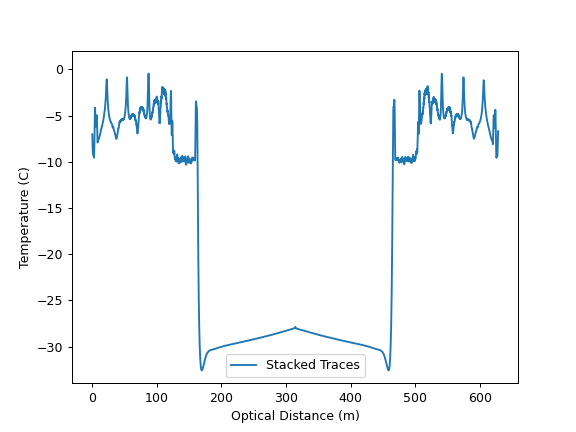

In [9]:
mean_sig1 = (ds.isel(time=0).tmpw + ds.isel(time=0).tmpw[::-1])/2
mean_sig2 = (ds.isel(time=1).tmpw + ds.isel(time=1).tmpw[::-1])/2
mean_sig3 = (ds.isel(time=2).tmpw + ds.isel(time=2).tmpw[::-1])/2

mean_tot = (mean_sig1 + mean_sig2 + mean_sig3) / 3


%matplotlib notebook

fig, ax = plt.subplots()
#plt.style.use('dark_background')
ax.plot(ds.x, mean_tot, label = 'Stacked Traces')
#ax.plot(ds.x, mean_tot[::-1], label = 'mean reversed')

ax.set_ylabel('Temperature (C)')
ax.set_xlabel('Optical Distance (m)')
#plt.xlim([0, 628])
plt.ylim([-34,2])
plt.legend()

In [10]:
borehole_below_season = mean_tot.sel(x=slice(top_trend,bottom_trend))

<IPython.core.display.Javascript object>


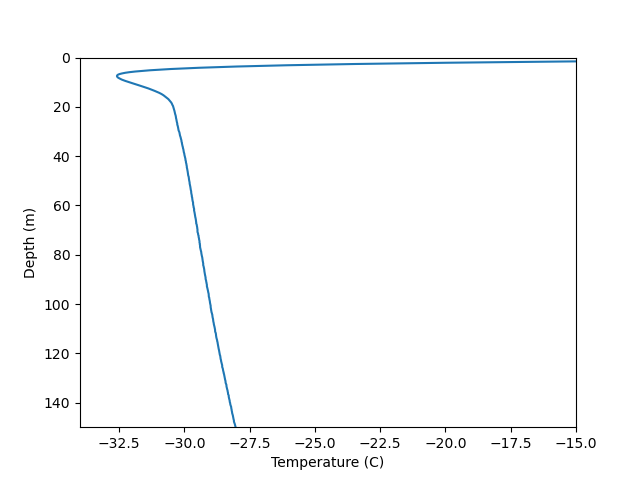

(-34.0, -15.0)

In [969]:
%matplotlib notebook

fig, ax = plt.subplots()
plt.gca().invert_yaxis()
#plt.style.use('dark_background')
ax.plot(mean_tot, ds.x - 162, label = 'Stacked Traces')
#ax.plot(ds.x, mean_tot[::-1], label = 'mean reversed')

ax.set_xlabel('Temperature (C)')
ax.set_ylabel('Depth (m)')
ax.set_ylim([150, 0])
plt.xlim([-34,-15])
#plt.legend()

In [193]:
#Geothermal flux from a linear fit

m,b = np.polyfit(mean_tot.sel(x=slice(top_trend,bottom_trend)).x, mean_tot.sel(x=slice(top_trend,bottom_trend)), 1)

Q_geo = m *2.5*1e3
print(Q_geo)
print(b)

43.62508103564118
-33.548921934822616


<IPython.core.display.Javascript object>


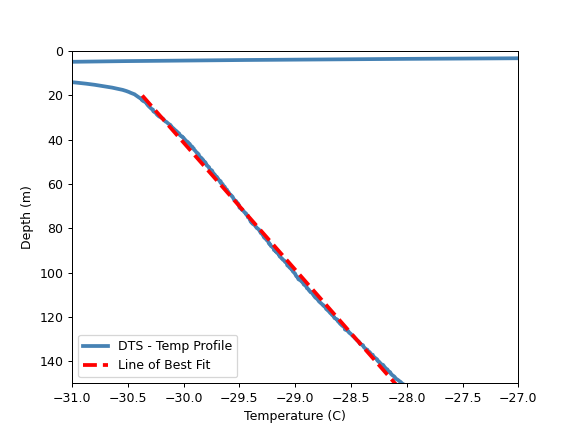

In [194]:
x  = m*mean_tot.sel(x=slice(top_trend,bottom_trend)).x + b

#plot the geothermal heat flux
%matplotlib notebook

fig, ax = plt.subplots()
plt.gca().invert_yaxis()
#plt.style.use('dark_background')
ax.plot(mean_tot, ds.x - 162, label = 'DTS - Temp Profile', lw = 3, c='steelblue')
ax.plot(x, mean_tot.sel(x=slice(top_trend,bottom_trend)).x-162, label = 'Line of Best Fit', ls="--", lw = 3, c='red')
#ax.plot(ds.x, mean_tot[::-1], label = 'mean reversed')

ax.set_xlabel('Temperature (C)')
ax.set_ylabel('Depth (m)')
ax.set_ylim([150, 0])
ax.set_xlim([-31,-27])
plt.legend()

<IPython.core.display.Javascript object>


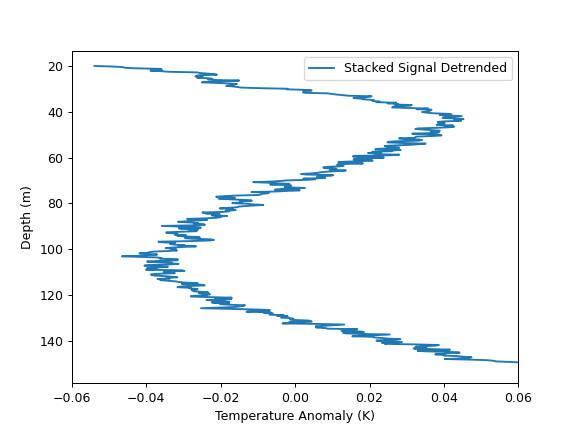

In [195]:
import scipy

detrend = scipy.signal.detrend(mean_tot.sel(x=slice(top_trend,bottom_trend)), type='linear', bp=0, overwrite_data=False)

%matplotlib notebook

fig, ax = plt.subplots()
#plt.style.use('dark_background')
ax.plot( detrend, borehole_below_season.x - start_of_borehole, label = 'Stacked Signal Detrended')


ax.set_xlabel('Temperature Anomaly (K)')
ax.set_ylabel('Depth (m)')


ax.invert_yaxis()
ax.set_xlim([-.06,0.06])
plt.legend()

<IPython.core.display.Javascript object>


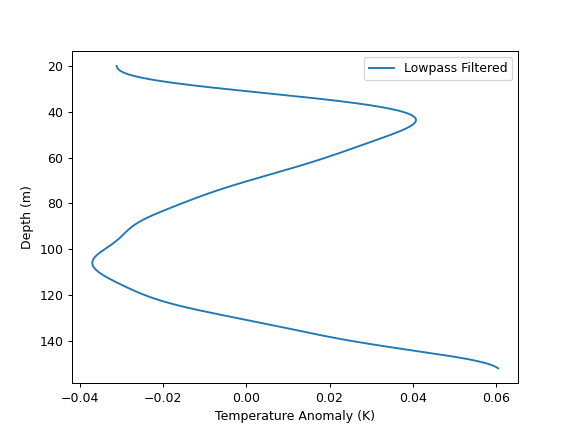

In [196]:
from scipy import signal

b, a = signal.ellip(4, 0.01, 120, 0.02) 
fgust = signal.filtfilt(b, a, detrend, method="gust")

%matplotlib notebook

fig, ax = plt.subplots()
#plt.style.use('dark_background')
ax.plot( fgust, borehole_below_season.x - start_of_borehole,label = 'Lowpass Filtered')


ax.set_xlabel('Temperature Anomaly (K)')
ax.set_ylabel('Depth (m)')

#plt.xlim([-34,-25])
ax.invert_yaxis()
plt.legend()

### Detrend each trace and then do the stacking.

In [197]:
top_trend = 182 #optical distance (m)
bottom_trend = 314 #optical distance (m)
start_of_borehole = 162 #optical distance (m)

In [198]:
mean_sig1 = (ds.isel(time=0).tmpw + ds.isel(time=0).tmpw[::-1])/2
mean_sig2 = (ds.isel(time=1).tmpw + ds.isel(time=1).tmpw[::-1])/2
mean_sig3 = (ds.isel(time=2).tmpw + ds.isel(time=2).tmpw[::-1])/2

detrend1 = scipy.signal.detrend(mean_sig1.sel(x=slice(top_trend,bottom_trend)), type='linear', bp=0, overwrite_data=False)
detrend2 = scipy.signal.detrend(mean_sig2.sel(x=slice(top_trend,bottom_trend)), type='linear', bp=0, overwrite_data=False)
detrend3 = scipy.signal.detrend(mean_sig3.sel(x=slice(top_trend,bottom_trend)), type='linear', bp=0, overwrite_data=False)

detrend_tot = (detrend1 + detrend2 + detrend3) / 3

<IPython.core.display.Javascript object>


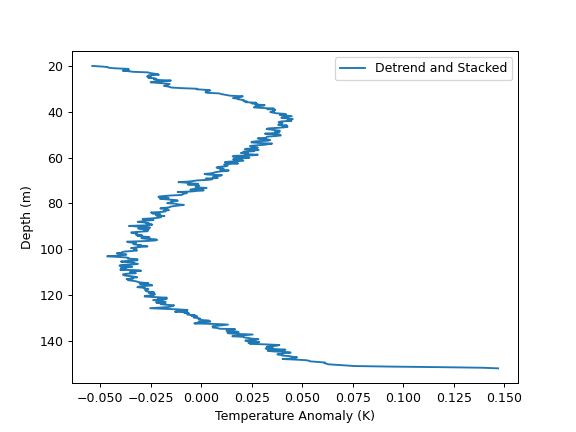

In [199]:
import scipy

%matplotlib notebook

fig, ax = plt.subplots()
#plt.style.use('dark_background')
ax.plot( detrend_tot, borehole_below_season.x - start_of_borehole, label = 'Detrend and Stacked')


ax.set_xlabel('Temperature Anomaly (K)')
ax.set_ylabel('Depth (m)')

#plt.xlim([-34,-25])
ax.invert_yaxis()
plt.legend()

<IPython.core.display.Javascript object>


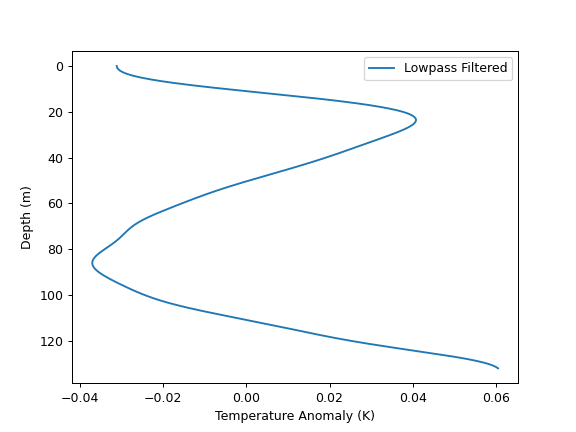

In [200]:
from scipy import signal

b, a = signal.ellip(4, 0.01, 120, 0.02) 
fgust_2 = signal.filtfilt(b, a, detrend_tot, method="gust")

%matplotlib notebook

fig, ax = plt.subplots()
#plt.style.use('dark_background')
ax.plot( fgust_2, borehole_below_season.x - top_trend,label = 'Lowpass Filtered')


ax.set_xlabel('Temperature Anomaly (K)')
ax.set_ylabel('Depth (m)')

#plt.xlim([-34,-25])
ax.invert_yaxis()
plt.legend()

### Let's compare the methods

<IPython.core.display.Javascript object>


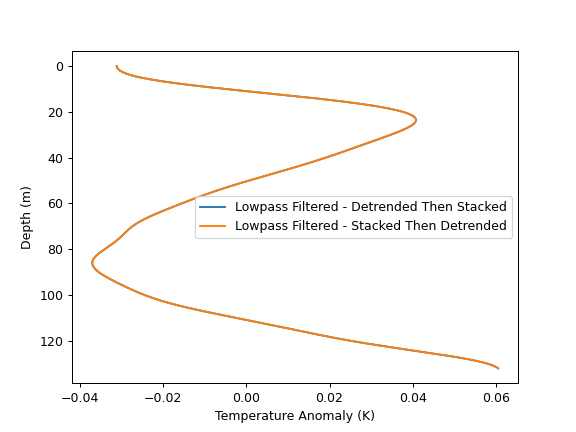

In [201]:
%matplotlib notebook

fig, ax = plt.subplots()
#plt.style.use('dark_background')
ax.plot( fgust_2, borehole_below_season.x - top_trend,label = 'Lowpass Filtered - Detrended Then Stacked')
ax.plot( fgust, borehole_below_season.x - top_trend,label = 'Lowpass Filtered - Stacked Then Detrended')


ax.set_xlabel('Temperature Anomaly (K)')
ax.set_ylabel('Depth (m)')

#plt.xlim([-34,-25])
ax.invert_yaxis()
plt.legend()

#### We have verified that both methods produce the same results

# Now setting up the heat flow problem

In [379]:
k = 2.18 #W/m/K
tau = 0.8e6 #Pa
v = 0.5e-8 #m/s
Q = tau * v #heating from shear horizon
distance = 200
geo_flux = 0.0046 #W/m^2

In [380]:
#We want to vary velocity and distance to determine what matches our observations the most

In [381]:
depth = 95
top = 0
number_of_layers = 95

<IPython.core.display.Javascript object>


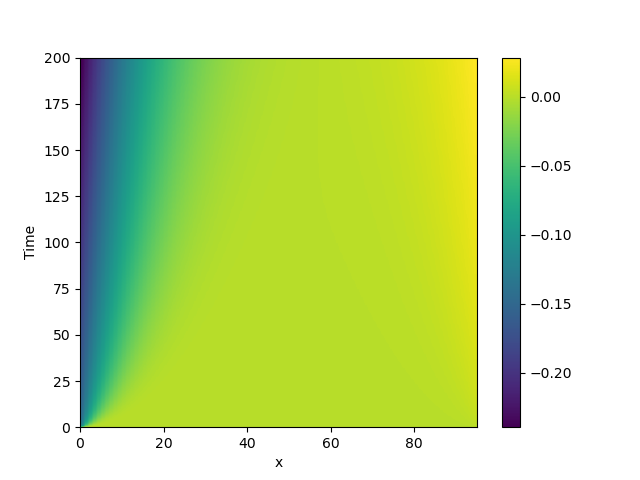

In [382]:
from pde import DiffusionPDE, ScalarField, UnitGrid, CartesianGrid, PDE, MemoryStorage, plot_kymograph

grid = CartesianGrid([[top, depth]], [number_of_layers])  # generate grid
state = ScalarField.random_uniform(grid, 0, 0)  # generate initial condition



eq = PDE({"c": "laplace(c)"}, bc=[{"value_expression": "0.5*sin(.001*t - .9*pi)"}, {"derivative": Q/k}])

storage = MemoryStorage()
eq.solve(state, t_range=distance, dt=.1, tracker=storage.tracker(.1))
# plot the trajectory as a space-time plot
plot_kymograph(storage)

<IPython.core.display.Javascript object>


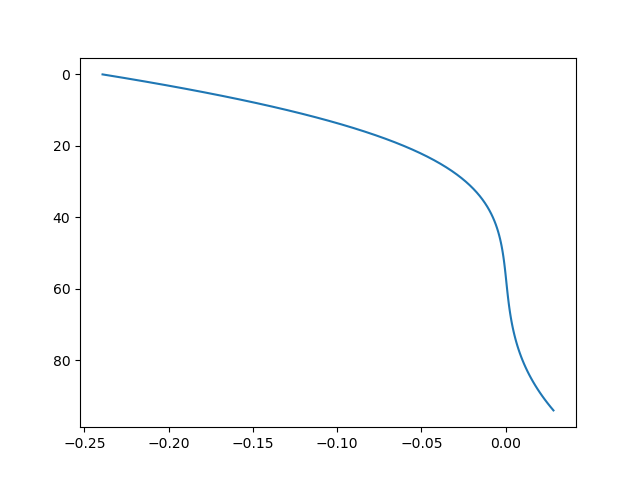

In [383]:
fig, ax = plt.subplots()
ax.plot(storage[-1].data, np.arange(0,depth,depth/number_of_layers))
ax.invert_yaxis()
plt.show()

<IPython.core.display.Javascript object>


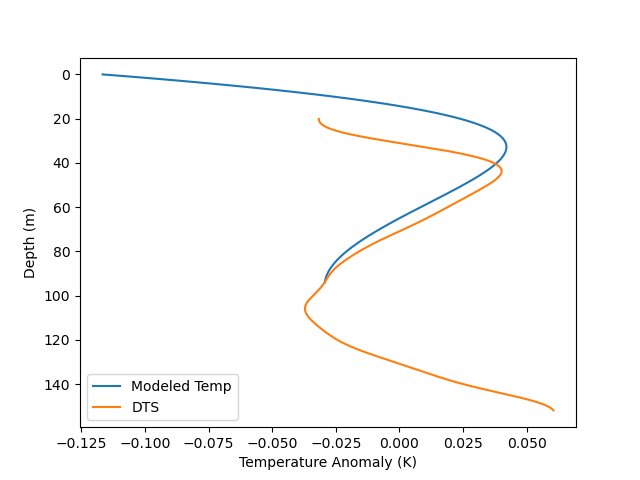

In [384]:
detrend_model = scipy.signal.detrend(storage[-1].data, type='linear', bp=0, overwrite_data=False)

fig, ax = plt.subplots()
ax.plot(detrend_model, np.arange(0,depth,depth/number_of_layers), label='Modeled Temp')
ax.plot( fgust_2, borehole_below_season.x - start_of_borehole,label = 'DTS')
ax.set_ylabel('Depth (m)')
ax.set_xlabel('Temperature Anomaly (K)')
ax.invert_yaxis()
plt.legend()
plt.show()

In [ ]:
fig, ax = plt.subplots()
ax.plot(detrend_model, np.arange(0,depth,depth/number_of_layers), label='Modeled Temp')
ax.set_ylabel('Depth (m)')
ax.set_xlabel('Temperature Anomaly (K)')
ax.invert_yaxis()
plt.show()

# Simple 1-D heat modeling equation

### Working right now

<IPython.core.display.Javascript object>


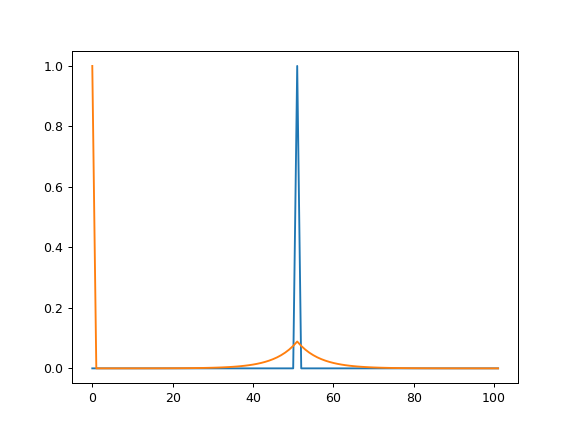

In [49]:
import numpy as np

n = 102
dt = 1
alpha = 1e-6 * 3.15e7
dx = 1
c = dt * alpha / (dx)**2
z = np.arange(0,n*dx,dx)
Q = 0 # change this
k = 1 # change this too

# Define FD scheme
B = np.diag([1+2*c] * n) + np.diag([-c] * (n-1),k=1)\
    + np.diag([-c] * (n-1),k=-1)

un = np.zeros((n,1))
unm1 = np.zeros((n,1))
unm1[int(n/2)] = 1

''' 
Set up time loop here
'''

un = np.linalg.solve(B,unm1)

# Enforce Dirichlet boundary conditions
un[0] = 1
# un[-1] = 0

# FD coefficients
c1 = -4
c2 = 1
c3 = -3

un[-1] = (c1*un[-2] + c2*un[-3] - Q/k * 2*dx)/c3

import matplotlib.pyplot as plt
%matplotlib notebook

fig, ax = plt.subplots()
ax.plot(z,unm1)
ax.plot(z,un)

# Testing with time variable boundary

In [227]:
import numpy as np

#Parameters
top_trend = 182 #optical distance (m)
bottom_trend = 314 #optical distance (m)
start_of_borehole = 162 #optical distance (m)
n = bottom_trend - start_of_borehole #Length of rod 
dt = .01
alpha = 1e-6 * 3.15e7
dx = 1
c = dt * alpha / (dx)**2
z = np.arange(0,n*dx,dx)
Q = 46e-4 # change this
k = 2.45 # change this too

# Define FD scheme
B = np.diag([1+2*c] * n) + np.diag([-c] * (n-1),k=1)\
    + np.diag([-c] * (n-1),k=-1)

un = np.zeros((n,1))
unm1 = np.zeros((n,1))

# FD coefficients
c1 = -4
c2 = 1
c3 = -3

''' 
Set up time loop here
'''
diffusion_arr = []
years=200
#heating = np.linspace(-1,1, int(years/dt)) #linear warming
avg = 0
std_dev = 20

heating = np.random.normal(avg, std_dev, int(years/dt)).round(2)
print(heating.shape)
print(heating[0:10])
for t, surf_force in zip(np.arange(0,years,dt), heating):

    if t == 0:
        unm1 = np.zeros((n,1))
        diffusion_arr.append(unm1)
        
    else:

        un = np.linalg.solve(B,diffusion_arr[-1])

        # Enforce Dirichlet boundary conditions
        un[0] = surf_force
        un[-1] = (c1*un[-2] + c2*un[-3] - Q/k * 2*dx)/c3

        diffusion_arr.append(un)
    
#     print(un)
#     print(unm1)


(20000,)
[ 15.5  -37.92   4.88  21.54  -5.77  -6.38  -1.66 -24.79 -14.93  26.82]


<IPython.core.display.Javascript object>


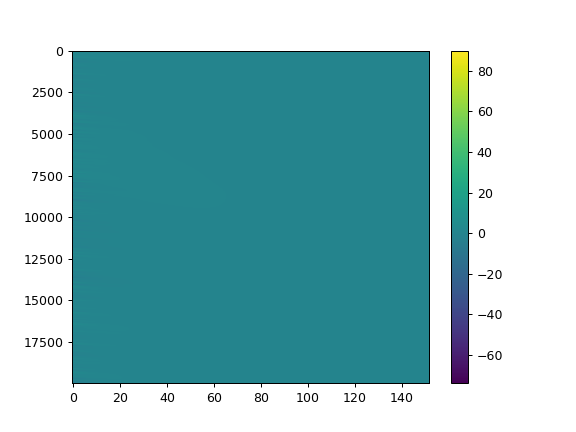

In [228]:
import matplotlib.pyplot as plt
%matplotlib notebook

fig, ax = plt.subplots()
im = ax.imshow(diffusion_arr,aspect='auto')
fig.colorbar(im)

<IPython.core.display.Javascript object>


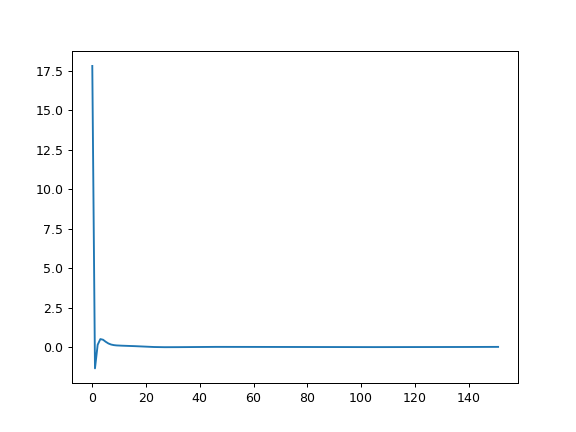

In [225]:
import matplotlib.pyplot as plt
%matplotlib notebook

fig, ax = plt.subplots()
#ax.plot(z,unm1)
# ax.plot(z,diffusion_arr[0])
# ax.plot(z,diffusion_arr[1])
ax.plot(z,diffusion_arr[-1])

In [229]:
#Translate borehole temp to anomaly
#Geothermal flux from a linear fit

m,b = np.polyfit(mean_tot.sel(x=slice(top_trend,bottom_trend)).x, mean_tot.sel(x=slice(top_trend,bottom_trend)), 1)

Q_geo = m *2.5*1e3

y  = m*mean_tot.sel(x=slice(start_of_borehole,bottom_trend)).x + b
anomaly = mean_tot.sel(x=slice(start_of_borehole,bottom_trend)) - y

<IPython.core.display.Javascript object>


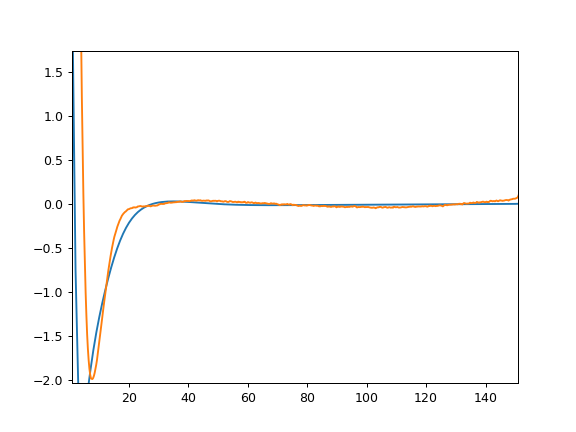

In [230]:
import matplotlib.pyplot as plt
%matplotlib notebook

fig, ax = plt.subplots()
#ax.plot(z,unm1)
# ax.plot(z,diffusion_arr[0])
# ax.plot(z,diffusion_arr[1])
ax.plot(z,diffusion_arr[-1])
ax.plot(mean_tot.sel(x=slice(start_of_borehole,bottom_trend)).x - start_of_borehole, anomaly)

# Now let's set up the Monte Carlo loop

In [258]:
import numpy as np

#Parameters
top_trend = 182 #optical distance (m)
bottom_trend = 314 #optical distance (m)
start_of_borehole = 162 #optical distance (m)
n = bottom_trend - start_of_borehole #Length of rod 
dt = .01
alpha = 1e-6 * 3.15e7
dx = 1
c = dt * alpha / (dx)**2
z = np.arange(0,n*dx,dx)
Q = 46e-4 # change this
k = 2.45 # change this too

# Define FD scheme
B = np.diag([1+2*c] * n) + np.diag([-c] * (n-1),k=1)\
    + np.diag([-c] * (n-1),k=-1)

un = np.zeros((n,1))
unm1 = np.zeros((n,1))

# FD coefficients
c1 = -4
c2 = 1
c3 = -3

''' 
Set up time loop here
'''
#diffusion_arr = []
years=200
#heating = np.linspace(-1,1, int(years/dt)) #linear warming
avg = 0
std_dev = 20
number_of_iterations = 10


heating_recorded = []
mc_run = []


for i in range(number_of_iterations):
    random = np.random.normal(avg, std_dev, int(years/dt)).round(2) #random variability
    heating = np.linspace(0,-2,int(years/dt))
    signal = random + heating
    heating_recorded.append(signal)
    diffusion_arr = []
    for t, surf_force in zip(np.arange(0,years,dt), signal):

        if t == 0:
            unm1 = np.zeros((n,1))
            diffusion_arr.append(unm1)

        else:

            un = np.linalg.solve(B,diffusion_arr[-1])

            # Enforce Dirichlet boundary conditions
            un[0] = surf_force
            un[-1] = (c1*un[-2] + c2*un[-3] - Q/k * 2*dx)/c3

            diffusion_arr.append(un)
    mc_run.append(diffusion_arr[-1])
        


<IPython.core.display.Javascript object>


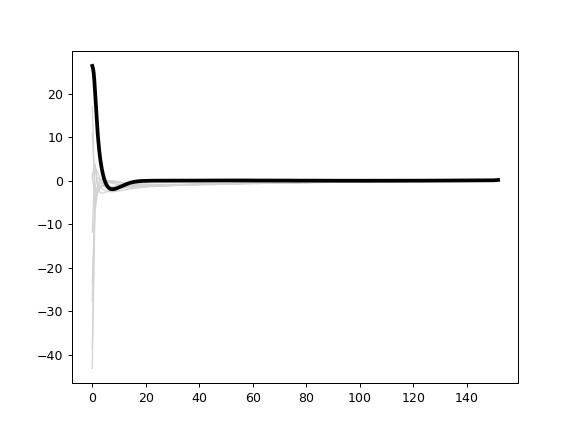

In [259]:
import matplotlib.pyplot as plt
%matplotlib notebook

arr_for_slice = mean_tot.sel(x=slice(start_of_borehole,bottom_trend)).x - start_of_borehole
start_for_dts = mean_tot.sel(x=slice(start_of_borehole,bottom_trend)).x - start_of_borehole - arr_for_slice[0]
fig, ax = plt.subplots()
#ax.plot(z,unm1)
# ax.plot(z,diffusion_arr[0])
# ax.plot(z,diffusion_arr[1])
ax.plot(np.asarray(mc_run).squeeze().T, lw=1, c='lightgrey')
ax.plot(start_for_dts, anomaly, lw=3, c='black')


# Foreward modeling

(40,)


<IPython.core.display.Javascript object>


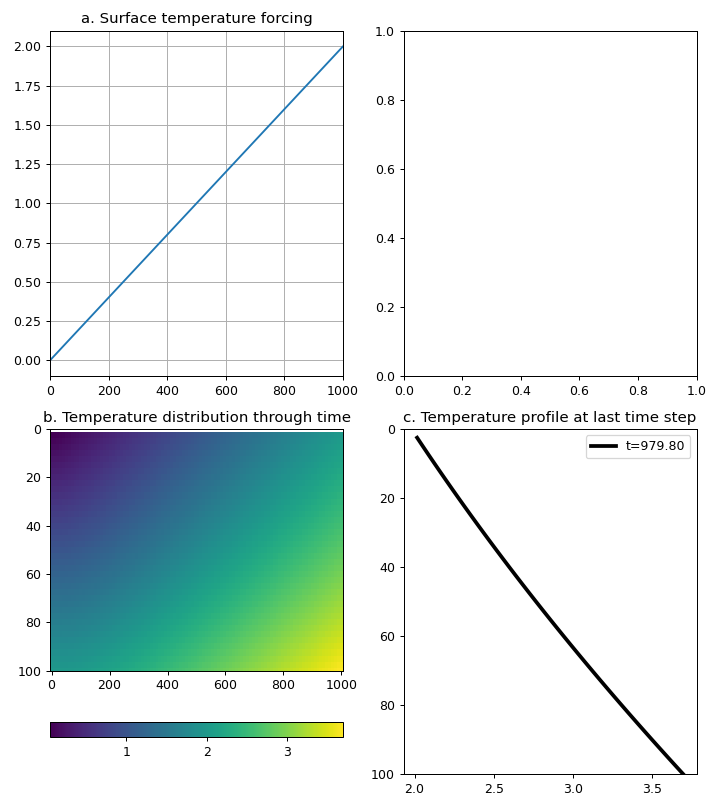

In [285]:
from heat import *

import numpy as np

#Parameters

tmax = 1000
tmin = 0
zmax = 100
dTdz = 0.02
nz = 39
nt = 99
alpha = 35
accumulation = 0
years=1000
#heating = np.linspace(-1,1, int(years/dt)) #linear warming
avg = 0
std_dev = 20
number_of_iterations = 1


heating_recorded = []
mc_run = []


for i in range(number_of_iterations):
    t_surf = np.linspace(0,2,100)
    U,t,z = heat(t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)
    print(z.shape)
    heat_plot(t, t_surf, 0, 1000, z, U)

In [349]:
from heat import *

import numpy as np

#Parameters

tmax = 2023
tmin = 1923
zmax = bottom_trend - top_trend#150
dTdz = 0.02
nz = len(mean_tot.sel(x=slice(top_trend,bottom_trend)))
nt = 99
alpha = 35
accumulation = 0
years=1000
#heating = np.linspace(-1,1, int(years/dt)) #linear warming
avg = 0
std_dev = 20
number_of_iterations = 1

t_surf = np.eye(nt)

A = np.zeros((nt+1,nz+1))

for i in range(nt):
    this_t_surf = t_surf[i,:]
#     if i == 20: this_t_surf = 10*this_t_surf
    U,t,z = heat(this_t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)
    now = U[:,-1]
    A[i,:] = now
A = A.T
#     print(z.shape)
#     heat_plot(t, t_surf, 0, 1000, z, U)

<IPython.core.display.Javascript object>


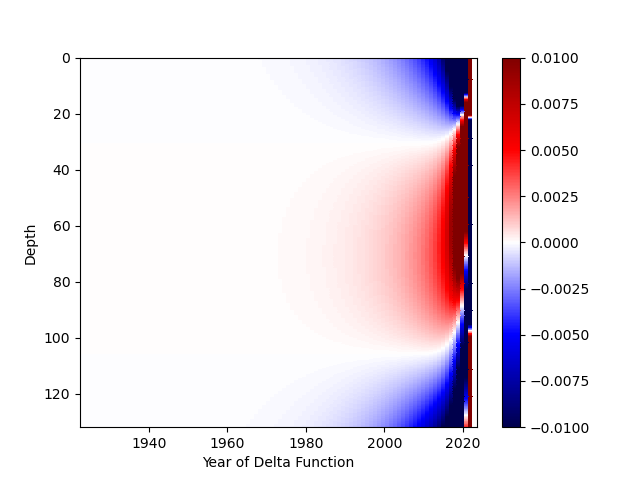

In [753]:
from scipy.signal import detrend
plt.subplots()
vm=0.01
c=plt.pcolor(t,z,detrend(A,axis=0),vmin=-vm,vmax=vm,cmap='seismic')
# c=plt.pcolor(t,z,A,vmin=-vm,vmax=vm,cmap='seismic')
plt.colorbar(c)
plt.ylim([zmax,0])
plt.xlabel('Year of Delta Function')
plt.ylabel('Depth')
plt.show()

# Now set up the inverse problem

(520, 100)


<IPython.core.display.Javascript object>


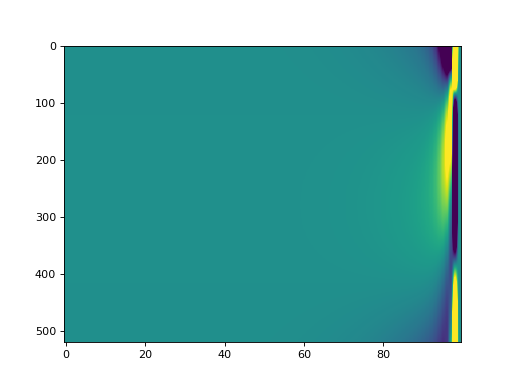

array([[-4.56911373e-05, -4.62756217e-06, -5.09623799e-06, ...,
        -6.65627393e-01,  1.70550922e+00,  0.00000000e+00],
       [-4.52854489e-05, -4.58647437e-06, -5.05098886e-06, ...,
        -6.46083571e-01,  1.67367035e+00,  0.00000000e+00],
       [-4.48797826e-05, -4.54538881e-06, -5.00574218e-06, ...,
        -6.26890003e-01,  1.64218509e+00,  0.00000000e+00],
       ...,
       [-6.13128831e-05, -6.20972022e-06, -6.83863576e-06, ...,
         1.43793513e-02,  6.89941922e-01,  0.00000000e+00],
       [-6.21071368e-05, -6.29016160e-06, -6.92722418e-06, ...,
         1.54452970e-02,  6.95522479e-01,  0.00000000e+00],
       [-6.29050318e-05, -6.37097177e-06, -7.01621874e-06, ...,
         1.65188426e-02,  7.01108214e-01,  0.00000000e+00]])

In [351]:
G_matrix = detrend(A,axis=0)
print(G_matrix.shape)

fig, ax = plt.subplots()
ax.imshow(G_matrix, aspect = 'auto', vmin=-.1, vmax=.1)
plt.show()

G_copy = G_matrix
G_copy

### Inversion using the previous generated G matrix

<IPython.core.display.Javascript object>


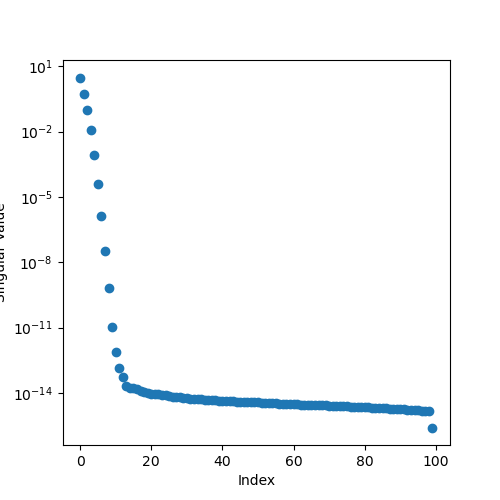

[3.02257162e+00 5.15558491e-01 9.37295628e-02 1.14407144e-02
 8.14669782e-04 3.83112588e-05 1.29506306e-06 3.30928445e-08
 6.62132511e-10 1.06561407e-11 7.55217868e-13 1.38681556e-13
 5.57881666e-14 2.12663511e-14 1.69217577e-14 1.63911352e-14
 1.44767126e-14 1.21594511e-14 1.06530567e-14 9.92454713e-15
 8.81298426e-15 8.66962889e-15 8.58179825e-15 8.28374093e-15
 7.65825957e-15 7.65234706e-15 6.65895703e-15 6.49785309e-15
 6.30386380e-15 6.00543777e-15 5.59270855e-15 5.43829490e-15
 5.43250901e-15 5.31061452e-15 5.19994275e-15 4.91956223e-15
 4.67226996e-15 4.64853320e-15 4.55588904e-15 4.48414446e-15
 4.40652962e-15 4.30368652e-15 4.13379790e-15 4.07224240e-15
 3.98830803e-15 3.97294268e-15 3.94432126e-15 3.76879599e-15
 3.65637122e-15 3.65532638e-15 3.65405664e-15 3.53675733e-15
 3.43398615e-15 3.40721846e-15 3.30567941e-15 3.28878033e-15
 3.28631255e-15 3.19036250e-15 3.12254899e-15 3.10523494e-15
 3.02398951e-15 2.97540350e-15 2.94107655e-15 2.92044706e-15
 2.85900097e-15 2.853362

In [911]:
#Singular value decomposition
u, s, v_T = np.linalg.svd(G_copy, full_matrices=True)


#Plotting the singular values
fig,ax = plt.subplots(figsize=[5,5])
plt.scatter(np.arange(0,len(s)),s)
ax.set_xlabel('Index')
ax.set_ylabel('Singular Value')
ax.set_yscale('log')
#ax.set_xlim([0,10])
print(s)
#fig.savefig('singular_values.eps')
plt.show()

In [850]:
p = 4 #Applying the thresholding
u_p = u[:,:p]
s_p = np.diag(s[:p])
vh_p = v_T.T[:,:p]

print('U_p =\n', u_p)
print('S_p =\n',s_p)
print('V_p =\n',vh_p)

U_p =
 [[-0.15298148  0.14266985  0.15013002  0.17197314]
 [-0.15004469  0.13667986  0.14052363  0.15614051]
 [-0.14714163  0.13081567  0.13122232  0.14103071]
 ...
 [-0.05677979 -0.08407145  0.10220146 -0.09795728]
 [-0.05721258 -0.08525516  0.10465171 -0.1014331 ]
 [-0.05764554 -0.08644357  0.10712221 -0.10495161]]
S_p =
 [[3.02257162 0.         0.         0.        ]
 [0.         0.51555849 0.         0.        ]
 [0.         0.         0.09372956 0.        ]
 [0.         0.         0.         0.01144071]]
V_p =
 [[ 4.05535613e-05  1.36763569e-04 -2.24830009e-04  2.38549485e-04]
 [ 4.10723258e-06  1.38513066e-05 -2.27706084e-05  2.41600930e-05]
 [ 4.52320983e-06  1.52541559e-05 -2.50767972e-05  2.66070093e-05]
 [ 4.98131693e-06  1.67990846e-05 -2.76165549e-05  2.93017466e-05]
 [ 5.48582077e-06  1.85004825e-05 -3.04135373e-05  3.22694058e-05]
 [ 6.04142034e-06  2.03741966e-05 -3.34937959e-05  3.55376267e-05]
 [ 6.65329060e-06  2.24376790e-05 -3.68860206e-05  3.91368504e-05]
 [ 7.3271

In [851]:
#Now finding the generalized G matrix

g_gen = u_p @ s_p @ vh_p.T
print('G = \n', g_gen)

#And the inverse Gen G matrix

u_p_transpose = u_p.T
s_p_inv = np.linalg.inv(s_p)

g_inv = vh_p @ s_p_inv @ u_p_transpose

print('G^-g = \n', g_inv)

G = 
 [[-1.13866449e-05 -1.15323040e-06 -1.27002866e-06 ... -1.66410768e-01
   4.26371007e-01  0.00000000e+00]
 [-1.12897897e-05 -1.14342098e-06 -1.25922575e-06 ... -1.61524321e-01
   4.18412088e-01  0.00000000e+00]
 [-1.11926555e-05 -1.13358330e-06 -1.24839171e-06 ... -1.56725467e-01
   4.10541522e-01  0.00000000e+00]
 ...
 [-1.53087447e-05 -1.55045758e-06 -1.70748669e-06 ...  3.59265994e-03
   1.72482158e-01  0.00000000e+00]
 [-1.55063782e-05 -1.57047375e-06 -1.72953008e-06 ...  3.85904206e-03
   1.73877139e-01  0.00000000e+00]
 [-1.57049069e-05 -1.59058058e-06 -1.75167331e-06 ...  4.12732244e-03
   1.75273412e-01  0.00000000e+00]]
G^-g = 
 [[ 3.26147476e-03  2.95284313e-03  2.65858431e-03 ... -2.31071521e-03
  -2.38938662e-03 -2.46899792e-03]
 [ 3.30319427e-04  2.99061473e-04  2.69259186e-04 ... -2.34027325e-04
  -2.41995100e-04 -2.50058066e-04]
 [ 3.63773936e-04  3.29350201e-04  2.96529560e-04 ... -2.57729437e-04
  -2.66504183e-04 -2.75383760e-04]
 ...
 [-2.95357125e+00 -2.70299437

<IPython.core.display.Javascript object>


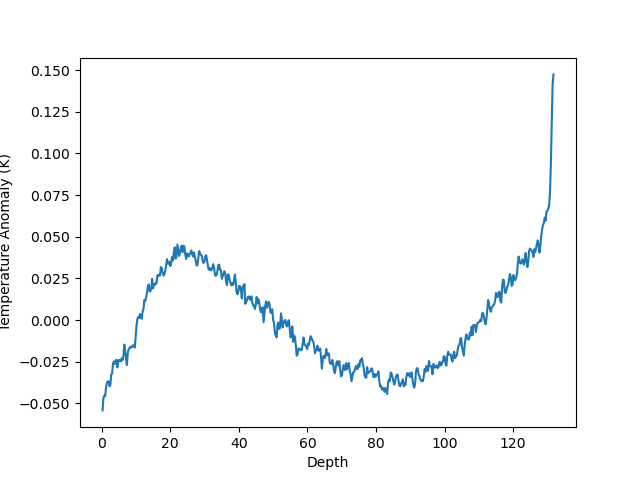

Text(0.5, 0, 'Depth')

In [852]:
#remove geo_flux in our data to get the temperature anomaly

m,b = np.polyfit(mean_tot.sel(x=slice(top_trend,bottom_trend)).x, mean_tot.sel(x=slice(top_trend,bottom_trend)), 1)

Q_geo = m *2.5*1e3
y  = m*mean_tot.sel(x=slice(top_trend,bottom_trend)).x + b
anomaly = mean_tot.sel(x=slice(top_trend,bottom_trend)) - y

#Resample to the shape of z defined above
# anomaly_resamp = np.interp(z, anomaly.x.values-top_trend, anomaly.values)

fig,ax = plt.subplots()
#ax.plot(anomaly.values)
ax.plot(z[:-1],anomaly)
ax.set_ylabel('Temperature Anomaly (K)')
ax.set_xlabel('Depth')

In [853]:
g_inv[:,:-1].shape

(100, 519)

<IPython.core.display.Javascript object>


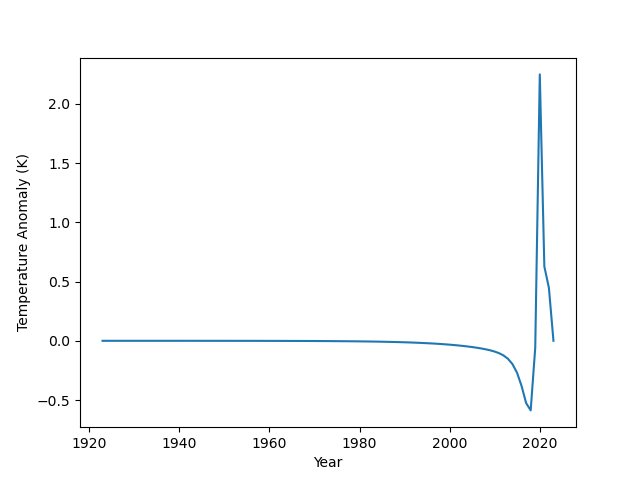

Text(0.5, 0, 'Year')

In [854]:
#model estimates
#m_est = g_inv @ anomaly.values
m_est = g_inv[:,:-1] @ anomaly.values

# m_est = g_inv[:,:-1] @ mean_tot.sel(x=slice(start_of_borehole,bottom_trend)).values

fig,ax = plt.subplots()
ax.plot(t,m_est)
ax.set_ylabel('Temperature Anomaly (K)')
ax.set_xlabel('Year')

<IPython.core.display.Javascript object>


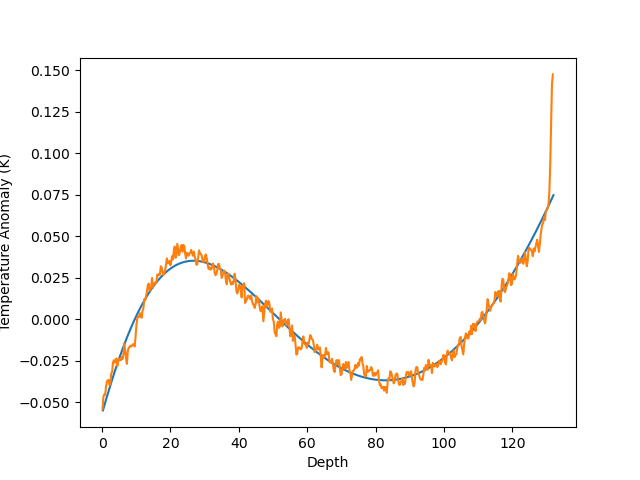

Text(0.5, 0, 'Depth')

In [855]:
#Predicted data
d_predicted = G_copy @ m_est

fig,ax = plt.subplots()
ax.plot(z,d_predicted, label='Predicted Data')
ax.plot(anomaly.x - top_trend, anomaly.values, label='Actual Data')
ax.set_ylabel('Temperature Anomaly (K)')
ax.set_xlabel('Depth')

In [830]:
R_model = g_inv @ g_gen

<IPython.core.display.Javascript object>


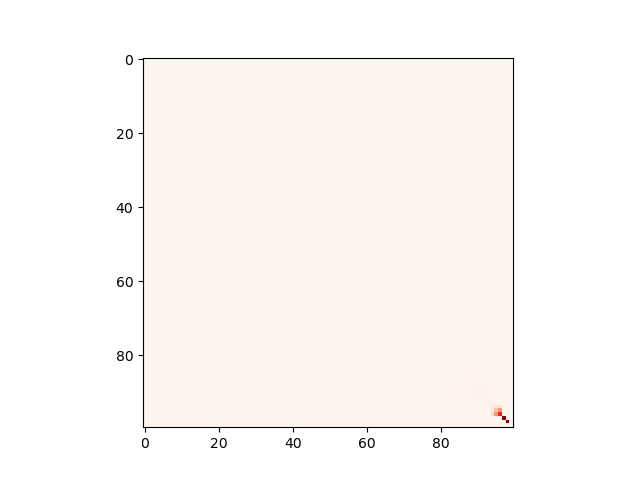

In [914]:
fig,ax = plt.subplots()
ax.imshow(R_model,vmin=0,vmax=1,cmap='Reds')
#ax.imshow(np.log10(np.abs(R_model)))

In [832]:
sigma_obs = 0.01
cov_m = sigma_obs**2 * g_inv @ g_inv.T

<IPython.core.display.Javascript object>


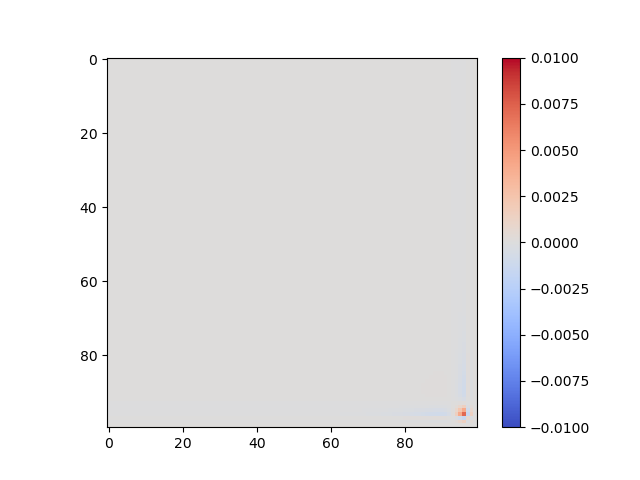

In [833]:
fig, ax= plt.subplots()
im = ax.imshow(cov_m,cmap='coolwarm',vmin=-0.01,vmax=0.01)
plt.colorbar(im)

<IPython.core.display.Javascript object>


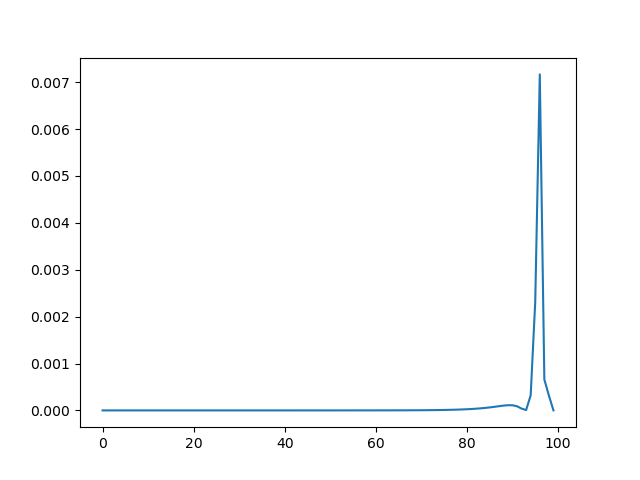

In [834]:
fig, ax= plt.subplots()
ax.plot(np.diag(cov_m))

## Monte Carlo modeling

In [364]:
"""
The scheme below will perturb a random year's temperature anomaly from the SVD inverse solution and 
then recalculate the the borehole temperature according to the G matrix to retrieve the predicted data.

The simulated temperature histories that perform better than the SVD are kept the those that perform worse
are ignored.
"""


"\nThe scheme below will perturb a random year's temperature anomaly from the SVD inverse solution and \nthen recalculate the the borehole temperature according to the G matrix to retrieve the predicted data.\n\nThe simulated temperature histories that perform better than the SVD are kept the those that perform worse\nare ignored.\n"

<IPython.core.display.Javascript object>


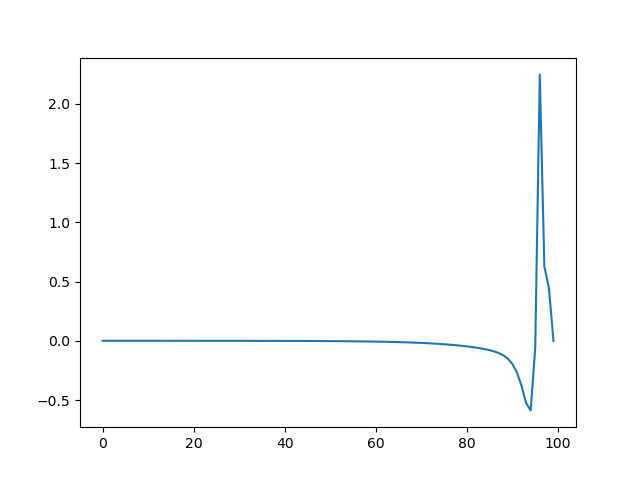

0.15885963543707568
2.1209598282560114
Accepted

-0.5369419096279366
2.2032751438893707
Not Accepted

-0.5137454938549516
2.121980546122584
Not Accepted

1.136838181801596
2.1823056367968325
Not Accepted

-0.02963020601675391
2.121164127025276
Not Accepted

0.08493815714043386
2.120968362148487
Accepted

0.1697143969164819
2.117115951827079
Accepted

-0.046295516214640106
2.120982676205938
Not Accepted

0.16808934787802646
2.1209729838383455
Accepted

0.2764271880779147
2.1202310227477037
Accepted



In [756]:
import copy

# 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
m_est = g_inv[:,:-1] @ anomaly.values
fig, ax= plt.subplots()
ax.plot(m_est)

d_pred_i = G_copy @ m_est
d_obs = anomaly.values
#r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
m_accepted = []
m_not_accepted = []
predicted_data = []
r_values = [r_i]
sigma = 0.01 #st dev of temperature measurement
alpha = 100 #some number threshold
for i in range(10):

    # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
    m_est = g_inv[:,:-1] @ anomaly.values
#     m_i = m_est
#     m_accepted = [m_i]
#     d_pred_i = G_copy @ m_i
#     d_obs = anomaly.values
    #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
#     r_i = sum(np.abs(d_pred_i[:-1] - d_obs))

    year_change = np.random.randint(0,m_i.shape[0]) #randomly select a year to change
#     m_next = m_accepted[-1] #set the temp history as the most recent one to be accepted

    m_next_copy = copy.deepcopy(m_est)
    change =  np.random.normal(loc=m_next_copy[year_change],scale=.5) #change that year's temperature according to a random gaussian walk 
    print(change)
    m_next_copy[year_change] = m_next_copy[year_change] + change

    #Predicted data
    d_pred = G_copy @ m_next_copy

    # 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01
    
    r = sum(np.abs(d_pred[:-1] - d_obs))
    print(str(r))
    #r = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred[:-1])**2))**2 / 2*(sigma**2))
    #print('r = ' + str(r)+ ', and r_0 = ' + str(r_i))
    if r < r_i:
        r_values.append(r)
        m_accepted.append(m_next_copy)
        predicted_data.append(d_pred)
        print('Accepted'+'\n')
    if r > r_i:
        m_not_accepted.append(m_next_copy)
        print('Not Accepted'+'\n')

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_accepted).T)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_not_accepted).T)


<IPython.core.display.Javascript object>


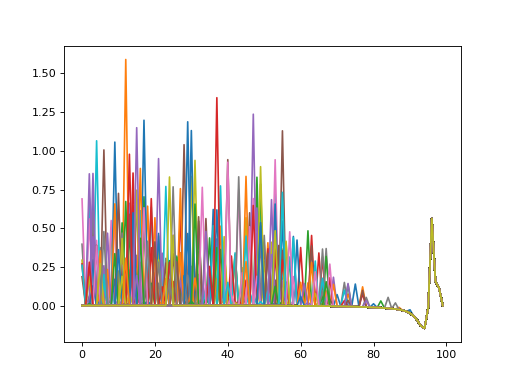

<IPython.core.display.Javascript object>


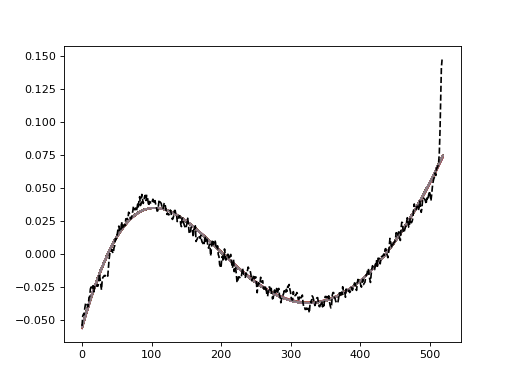

In [366]:
fig, ax= plt.subplots()
ax.plot(m_est)
ax.plot(np.asarray(m_accepted).T)
plt.show()

fig, ax= plt.subplots()
ax.plot(np.asarray(predicted_data).T)
ax.plot(d_obs, ls='--', c='black')
plt.show()

# Monte Carlo modeling but we improve each time

In [376]:
import copy

# 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
m_est = g_inv[:,:-1] @ anomaly.values

d_pred_i = G_copy @ m_est
d_obs = anomaly.values
#r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
m_accepted = [m_est]
m_not_accepted = []
predicted_data = []
r_values = [r_i]
sigma = 0.01 #st dev of temperature measurement
alpha = 100 #some number threshold
for i in range(5000):

    # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
    m_est = g_inv[:,:-1] @ anomaly.values
#     m_i = m_est
#     m_accepted = [m_i]
#     d_pred_i = G_copy @ m_i
#     d_obs = anomaly.values
    #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
#     r_i = sum(np.abs(d_pred_i[:-1] - d_obs))

    year_change = np.random.randint(0,m_i.shape[0]) #randomly select a year to change
#     m_next = m_accepted[-1] #set the temp history as the most recent one to be accepted

    m_next_copy = copy.deepcopy(m_accepted[-1])
    change =  np.random.normal(loc=m_next_copy[year_change],scale=.5) #change that year's temperature according to a random gaussian walk 

    m_next_copy[year_change] = m_next_copy[year_change] + change
    #Predicted data
    d_pred = G_copy @ m_next_copy

    # 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01
    
    r = sum(np.abs(d_pred[:-1] - d_obs))
    #r = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred[:-1])**2))**2 / 2*(sigma**2))
    #print('r = ' + str(r)+ ', and r_0 = ' + str(r_i))
    
    ### Do this to always improve ###
    
    if r < r_values[-1]:
        r_values.append(r)
        m_accepted.append(m_next_copy)
        predicted_data.append(d_pred)
        print('r = ' + str(r))
    if r > r_values[-1]:
        m_not_accepted.append(m_next_copy)
        
#     ### Do this to always to always keep performers that beat the SVD ###
    
#     if r < r_i:
#         r_values.append(r)
#         m_accepted.append(m_next_copy)
#         predicted_data.append(d_pred)
#         print('r = ' + str(r))
#     if r > r_i:
#         m_not_accepted.append(m_next_copy)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_accepted).T)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_not_accepted).T)

r = 2.118358011513248
r = 2.1182407381558077
r = 2.1182355788607183
r = 2.1180531515699332
r = 2.1169374542493054
r = 2.116918794551184
r = 2.1169147290074566
r = 2.116906792134448
r = 2.1168122245333145
r = 2.1167575102645375
r = 2.116757244952809
r = 2.116755234317394
r = 2.1167551216947067
r = 2.116748189661097
r = 2.116748073492056
r = 2.1167477744647982
r = 2.116747569816982
r = 2.116747468697881
r = 2.116747457835527
r = 2.1167473701473987
r = 2.1167473564439994
r = 2.116747348338516
r = 2.116746995576406
r = 2.116742576096709
r = 2.1167420442098237
r = 2.116741822444181
r = 2.116741341399013
r = 2.1167401826083463
r = 2.116739788042406
r = 2.1167396212270346
r = 2.116739364551228
r = 2.1167392385248625
r = 2.116738364594843
r = 2.116737915178663
r = 2.116737466325451
r = 2.116736449468481
r = 2.1167362085128927
r = 2.1167346707786403
r = 2.116734564630099
r = 2.1167342665341273
r = 2.1167342464860113
r = 2.1166995964591484
r = 2.1166956104543475
r = 2.116695493380985
r = 2.11669

array([-8.25599897e-02,  9.17950159e-02,  1.14634187e-01, -1.32599428e-01,
        8.34744937e-02,  1.18023603e-02, -8.98051063e-03, -2.37149005e-01,
       -5.18338964e-02, -1.06302447e-01, -1.40909296e-01,  8.82438695e-02,
        5.45002511e-02, -1.77899016e-01,  1.37796823e-01, -3.63481044e-02,
        1.26760759e-01,  4.10591000e-02, -7.25317957e-02, -3.11863348e-02,
        5.54586799e-02, -1.26766702e-01, -8.78940150e-02,  6.26158451e-02,
        1.56578889e-03, -9.62676673e-02, -2.44585678e-02,  1.17587484e-01,
       -1.38206367e-02, -1.47492515e-01,  1.47957730e-01, -8.37722298e-02,
        1.77814410e-02, -4.84579580e-02,  8.34232441e-02, -6.57171246e-02,
       -7.45350867e-02,  1.42182356e-01,  9.03148612e-02, -2.92362746e-01,
       -1.84961986e-01, -1.79466946e-01, -1.61046447e-02,  6.56776352e-02,
       -4.47790693e-02,  1.83371936e-01,  1.25418799e-03, -5.93427795e-03,
        6.95804707e-02,  3.59905364e-02,  4.91224725e-02, -1.17868096e-01,
        2.33576647e-03, -

### Here we add in the Metropolis Hastings step

# Monte Carlo modeling but we improve each time, and then we save the imporved run and do that n amount of times starting from scratch each time

# These are called "Monte Carlo Restarts"

In [907]:
import copy
from tqdm import tqdm

# 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
m_est = g_inv[:,:-1] @ anomaly.values

d_pred_i = G_copy @ m_est
d_obs = anomaly.values
#r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
m_accepted_all = [m_est]
m_not_accepted = []
predicted_data = []
r_values = [r_i]
sigma = 0.01 #st dev of temperature measurement

iterations = 500
restarts = 100
best_of_restart = []
for j in tqdm(range(restarts)):
    m_accepted = [m_est]
    for i in range(iterations):

        # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
        m_est = g_inv[:,:-1] @ anomaly.values
    #     m_i = m_est
    #     m_accepted = [m_i]
    #     d_pred_i = G_copy @ m_i
    #     d_obs = anomaly.values
        #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
    #     r_i = sum(np.abs(d_pred_i[:-1] - d_obs))

        #year_change = np.random.randint(0,m_i.shape[0]) #randomly select a year to change
    #     m_next = m_accepted[-1] #set the temp history as the most recent one to be accepted

        m_next_copy = copy.deepcopy(m_accepted[-1])
        change =  np.random.normal(loc=0,scale=.1, size = m_next_copy.shape) #change that year's temperature according to a random gaussian walk 

        m_next_copy = m_next_copy + change
        #Predicted data
        d_pred = G_copy @ m_next_copy

        # 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01

        r = sum(np.abs(d_pred[:-1] - d_obs))
        #print(r)
        sigma = 1 * np.sqrt(len(m_next_copy))
        #print(sigma)
        L = np.exp(-r**2/sigma**2 / 2) / np.sqrt(2*np.pi) / sigma 
        #print(L)
        #r = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred[:-1])**2))**2 / 2*(sigma**2))
        #print('r = ' + str(r)+ ', and r_0 = ' + str(r_i))
        alpha = np.random.rand()
        #print(alpha)

        ### Do this to always improve ###

        if L > alpha:
            r_values.append(r)
            m_accepted_all.append(m_next_copy)
            predicted_data.append(d_pred)
            m_accepted.append(m_next_copy)
            #print('r = ' + str(r))
#             print('L = '+ str(L)+'  , alpha = '+str(alpha))
#             print("accepted")
        if L < alpha:
            m_not_accepted.append(m_next_copy)
    best_of_restart.append(np.asarray(m_accepted[-1]).T)
#     ### Do this to always to always keep performers that beat the SVD ###
    
#     if r < r_i:
#         r_values.append(r)
#         m_accepted.append(m_next_copy)
#         predicted_data.append(d_pred)
#         print('r = ' + str(r))
#     if r > r_i:
#         m_not_accepted.append(m_next_copy)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_accepted).T)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_not_accepted).T)

100%|██████████| 100/100 [53:51<00:00, 32.31s/it]


In [905]:
std_all = np.std(np.asarray(m_accepted_all).T, axis=1)
mean_all = np.mean(np.asarray(m_accepted_all).T, axis=1)

<IPython.core.display.Javascript object>


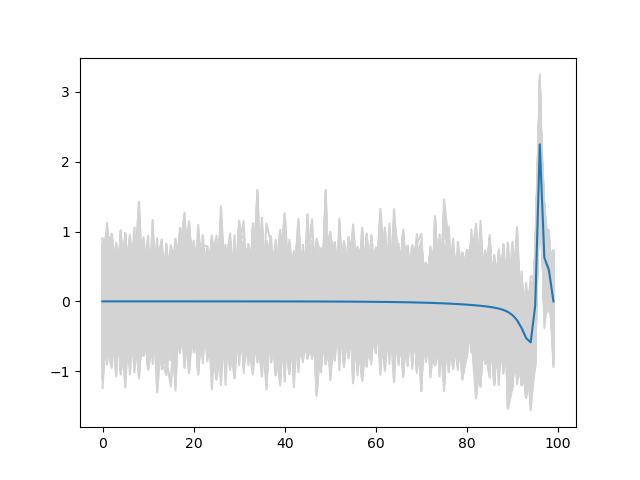

<IPython.core.display.Javascript object>


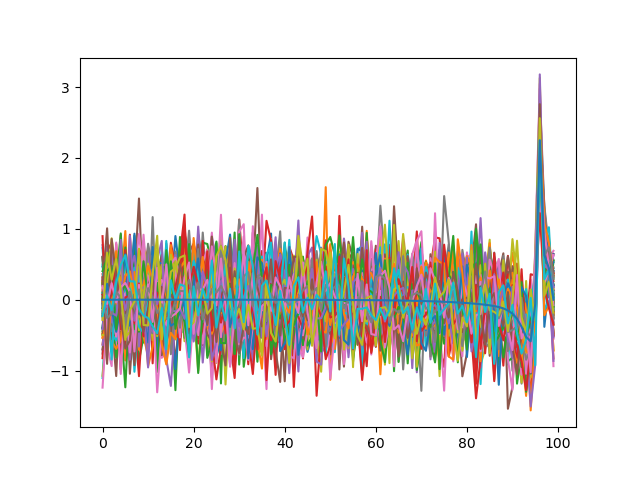

<IPython.core.display.Javascript object>


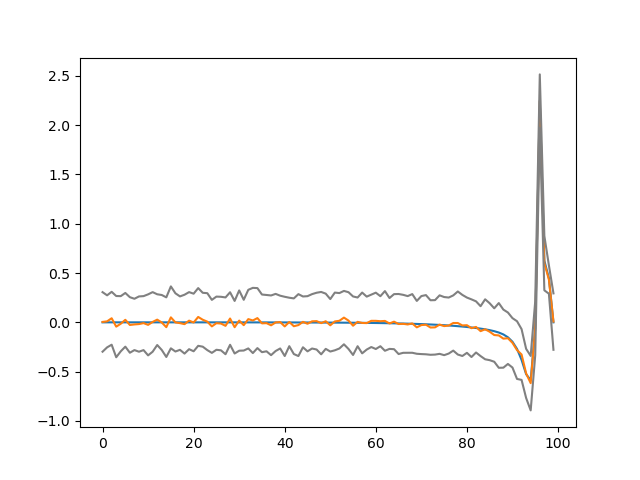

<IPython.core.display.Javascript object>


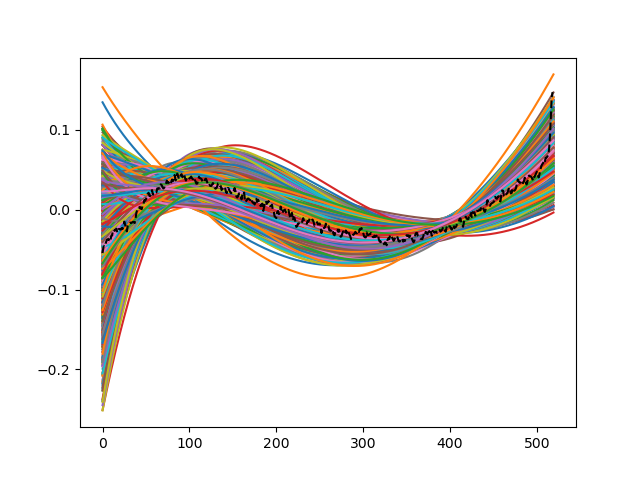

In [916]:
fig, ax= plt.subplots()

ax.plot(np.asarray(m_accepted_all).T, color='lightgrey')
ax.plot(m_est)

fig, ax= plt.subplots()
ax.plot(np.asarray(best_of_restart).T)
ax.plot(m_est)

fig, ax= plt.subplots()
ax.plot(m_est)
ax.plot(mean_all)
ax.plot(mean_all+std_all, color = 'grey')
ax.plot(mean_all-std_all, color = 'grey')

fig, ax= plt.subplots()
ax.plot(np.asarray(predicted_data).T)
ax.plot(d_obs, ls='--', c='black')
plt.show()


# Instead of a random array, what about a random sine function?

In [894]:
import copy
from tqdm import tqdm

# 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
m_est = g_inv[:,:-1] @ anomaly.values

d_pred_i = G_copy @ m_est
d_obs = anomaly.values
#r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
m_accepted_all = [m_est]
m_not_accepted = []
predicted_data = []
r_values = [r_i]
sigma = 0.01 #st dev of temperature measurement

iterations = 500
restarts = 100
best_of_restart = []
for j in tqdm(range(restarts)):
    m_accepted = [m_est]
    for i in range(iterations):

        # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
        m_est = g_inv[:,:-1] @ anomaly.values
    #     m_i = m_est
    #     m_accepted = [m_i]
    #     d_pred_i = G_copy @ m_i
    #     d_obs = anomaly.values
        #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
    #     r_i = sum(np.abs(d_pred_i[:-1] - d_obs))

        #year_change = np.random.randint(0,m_i.shape[0]) #randomly select a year to change
    #     m_next = m_accepted[-1] #set the temp history as the most recent one to be accepted

        m_next_copy = copy.deepcopy(m_accepted[-1])
        
        amplitude = np.random.uniform(0,3) #randomly choose an amplitude for the temperature signal
        phase = np.random.uniform(-2*np.pi, 2*np.pi)
        freq = np.random.uniform(0.0001, .01)
        change = amplitude * np.sin(freq*t + phase)
        change = detrend(change)
        m_next_copy = m_next_copy + change
        #Predicted data
        d_pred = G_copy @ m_next_copy

        # 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01

        r = sum(np.abs(d_pred[:-1] - d_obs))
        #print(r)
        sigma = 1 * np.sqrt(len(m_next_copy))
        #print(sigma)
        L = np.exp(-r**2/sigma**2 / 2) / np.sqrt(2*np.pi) / sigma 
        #print(L)
        #r = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred[:-1])**2))**2 / 2*(sigma**2))
        #print('r = ' + str(r)+ ', and r_0 = ' + str(r_i))
        alpha = np.random.rand()
        #print(alpha)

        ### Do this to always improve ###

        if L > alpha:
            r_values.append(r)
            m_accepted_all.append(m_next_copy)
            m_accepted.append(m_next_copy)
            predicted_data.append(d_pred)
            #print('r = ' + str(r))
#             print('L = '+ str(L)+'  , alpha = '+str(alpha))
#             print("accepted")
        if L < alpha:
            m_not_accepted.append(m_next_copy)
    best_of_restart.append(np.asarray(m_accepted[-1]).T)
#     ### Do this to always to always keep performers that beat the SVD ###
    
#     if r < r_i:
#         r_values.append(r)
#         m_accepted.append(m_next_copy)
#         predicted_data.append(d_pred)
#         print('r = ' + str(r))
#     if r > r_i:
#         m_not_accepted.append(m_next_copy)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_accepted).T)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_not_accepted).T)

100%|██████████| 100/100 [54:42<00:00, 32.82s/it]


<IPython.core.display.Javascript object>


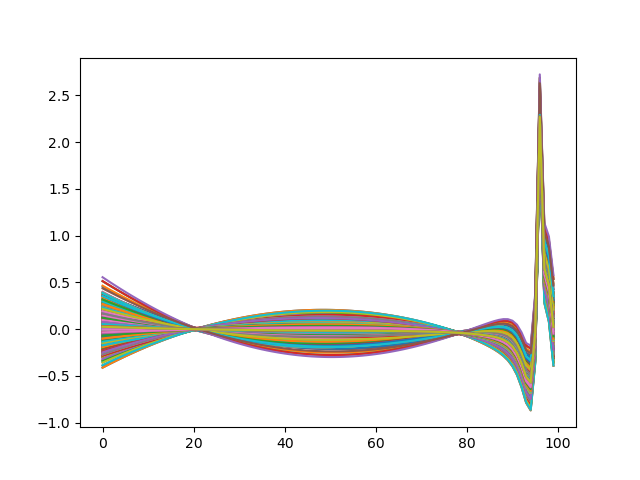

<IPython.core.display.Javascript object>


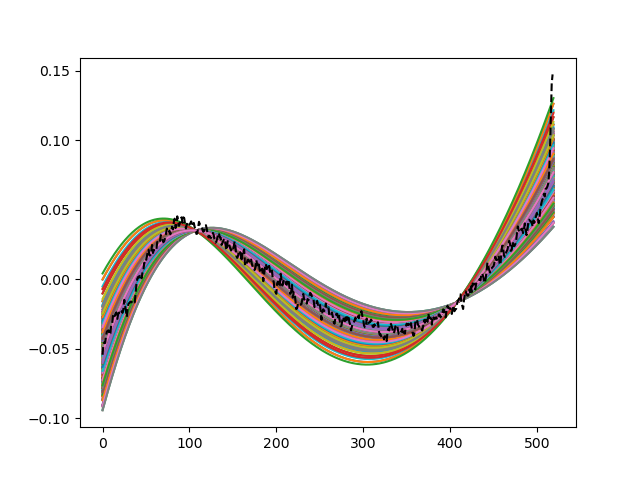

In [895]:
fig, ax= plt.subplots()
ax.plot(m_est)
ax.plot(np.asarray(m_accepted_all).T)

fig, ax= plt.subplots()
ax.plot(np.asarray(predicted_data).T)
ax.plot(d_obs, ls='--', c='black')
plt.show()


<IPython.core.display.Javascript object>


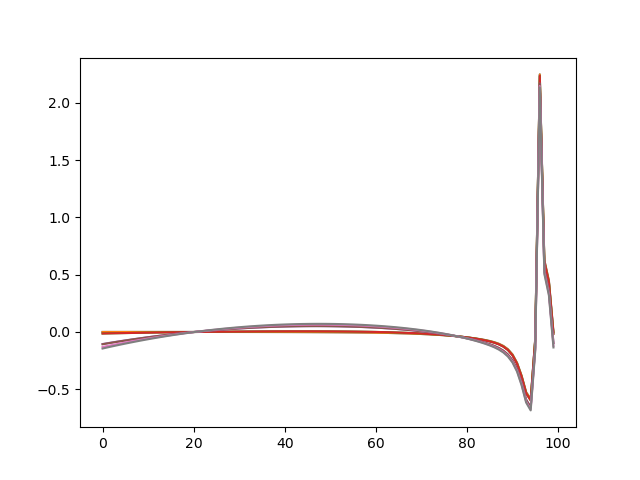

<IPython.core.display.Javascript object>


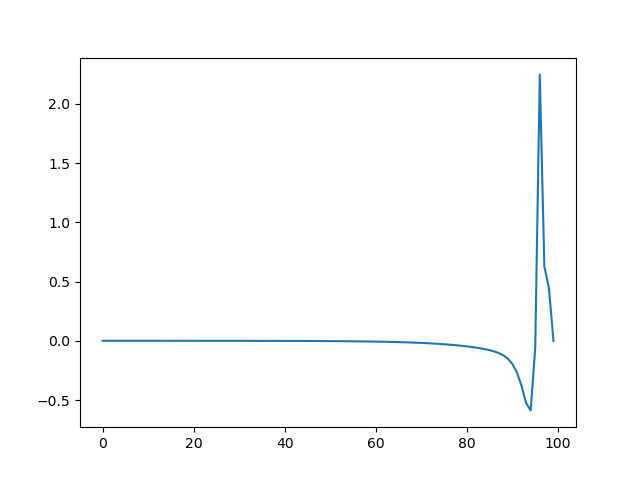

<IPython.core.display.Javascript object>


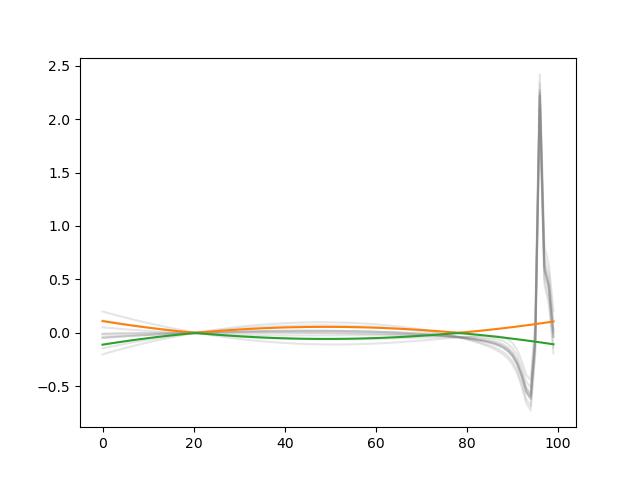

<IPython.core.display.Javascript object>


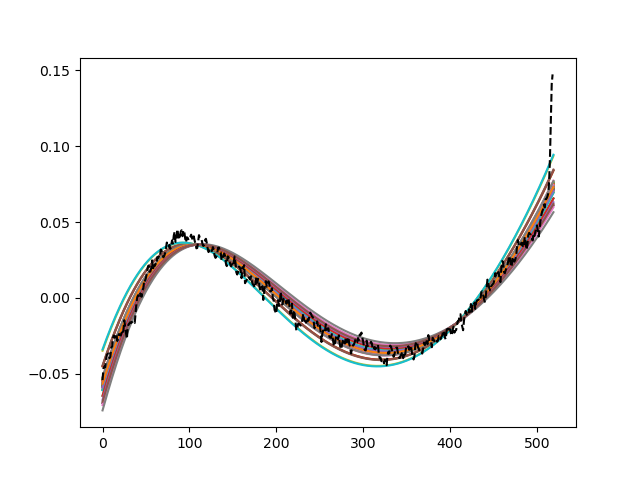

In [876]:
fig, ax= plt.subplots()
ax.plot(m_est)
ax.plot(np.asarray(m_accepted).T)


fig, ax= plt.subplots()
ax.plot(m_est)
ax.plot(np.mean(np.asarray(m_accepted).T))
ax.plot(np.mean(np.asarray(m_accepted).T+np.std(np.asarray(m_accepted).T)))

fig, ax= plt.subplots()
ax.plot(np.asarray(best_of_restart).T, color = 'grey', alpha=.2)
ax.plot(np.mean(np.asarray(best_of_restart).T))
ax.plot(np.mean(np.asarray(best_of_restart).T) + np.std(np.asarray(best_of_restart).T, axis=1))
ax.plot(np.mean(np.asarray(best_of_restart).T) - np.std(np.asarray(best_of_restart).T, axis=1))


fig, ax= plt.subplots()
ax.plot(np.asarray(predicted_data).T)
ax.plot(d_obs, ls='--', c='black')
plt.show()

In [453]:
import copy
best_runs = []
best_pred_data = []
for i in range(500):
    # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
    m_est = g_inv[:,:-1] @ anomaly.values

    d_pred_i = G_copy @ m_est
    d_obs = anomaly.values
    #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
    r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
    m_accepted = [m_est]
    m_not_accepted = []
    predicted_data = []
    r_values = [r_i]
    sigma = 0.01 #st dev of temperature measurement
    alpha = 100 #some number threshold
    for i in range(100):

        # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
        m_est = g_inv[:,:-1] @ anomaly.values
    #     m_i = m_est
    #     m_accepted = [m_i]
    #     d_pred_i = G_copy @ m_i
    #     d_obs = anomaly.values
        #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
    #     r_i = sum(np.abs(d_pred_i[:-1] - d_obs))

        year_change = np.random.randint(0,m_i.shape[0]) #randomly select a year to change
    #     m_next = m_accepted[-1] #set the temp history as the most recent one to be accepted

        m_next_copy = copy.deepcopy(m_accepted[-1])
        change =  np.random.normal(loc=m_next_copy[year_change],scale=.5) #change that year's temperature according to a random gaussian walk 

        m_next_copy[year_change] = m_next_copy[year_change] + change
        #Predicted data
        d_pred = G_copy @ m_next_copy

        # 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01

        r = sum(np.abs(d_pred[:-1] - d_obs))
        #r = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred[:-1])**2))**2 / 2*(sigma**2))
        #print('r = ' + str(r)+ ', and r_0 = ' + str(r_i))

        ### Do this to always improve ###

        if r < r_values[-1]:
            r_values.append(r)
            m_accepted.append(m_next_copy)
            predicted_data.append(d_pred)
            print('r = ' + str(r))
        if r > r_values[-1]:
            m_not_accepted.append(m_next_copy)
    best_runs.append(m_accepted[-1])
    best_pred_data.append(predicted_data[-1])


r = 2.118940918678945
r = 2.118786270077767
r = 2.1186826150874167
r = 2.11865370310316
r = 2.1185907774853474
r = 2.117420106629098
r = 2.1168017468809244
r = 2.116762435276182
r = 2.116762037815682
r = 2.116762025029372
r = 2.116761032143671
r = 2.11676019598452
r = 2.1167592119358285
r = 2.1167587287684095
r = 2.116757325055634
r = 2.1167570438996774
r = 2.116756901264851
r = 2.1167558667298456
r = 2.118475279288817
r = 2.11835056819078
r = 2.1174908746672676
r = 2.1171372947884906
r = 2.1170332296533454
r = 2.1167525959637428
r = 2.1167507045384237
r = 2.1167481825569494
r = 2.1167479992375404
r = 2.1167478833431
r = 2.1167475964805034
r = 2.1208760784417526
r = 2.120442369405647
r = 2.119291343132918
r = 2.1192880584637503
r = 2.118673318135678
r = 2.116756829519071
r = 2.116753598370354
r = 2.116752732755527
r = 2.1167520202538825
r = 2.116751592576894
r = 2.1167512558589894
r = 2.1167508622017355
r = 2.116750464869339
r = 2.116749984405077
r = 2.116747474829906
r = 2.11978076103

r = 2.1167478793592047
r = 2.1167474460517366
r = 2.1171408953544852
r = 2.116821430450778
r = 2.116752216623827
r = 2.11674972110673
r = 2.116748972129758
r = 2.116748971529456
r = 2.116748540529745
r = 2.116747660351983
r = 2.1204884159388566
r = 2.12019478761291
r = 2.120100618452596
r = 2.1181275940273867
r = 2.1171524436776687
r = 2.1171002352920993
r = 2.1167546601752196
r = 2.1167483424752596
r = 2.1167483377836693
r = 2.1167480845805127
r = 2.116748021851436
r = 2.116747423035284
r = 2.1196826292866673
r = 2.119610299062057
r = 2.117161278432123
r = 2.116927800233046
r = 2.116890102043528
r = 2.11687186924269
r = 2.116769969649728
r = 2.1167681583761904
r = 2.116750078101193
r = 2.1167492480300303
r = 2.1167491852023725
r = 2.11674882606982
r = 2.1167477516458866
r = 2.1167475067571244
r = 2.116747439292563
r = 2.120879795757769
r = 2.120845806844368
r = 2.1199954402851486
r = 2.1199155637722455
r = 2.11954977771971
r = 2.1192748514731536
r = 2.117166600919524
r = 2.11715154772

r = 2.120247203684456
r = 2.1167503704153794
r = 2.1167498763745476
r = 2.116749787978528
r = 2.116749215415857
r = 2.1167490286642705
r = 2.1167489705886604
r = 2.1167478017640335
r = 2.1167474197604954
r = 2.1208378786539632
r = 2.1205044027716387
r = 2.1188687727646616
r = 2.1184731278257733
r = 2.1184647972071082
r = 2.1177009697040186
r = 2.1176100250797685
r = 2.117464795233719
r = 2.117366086521363
r = 2.1172850459617525
r = 2.1171487019515514
r = 2.1167720570666115
r = 2.1167531989765425
r = 2.1167529333262904
r = 2.116750232213222
r = 2.1167493111628404
r = 2.11674796629792
r = 2.1167478266994078
r = 2.116723994785656
r = 2.11657448771599
r = 2.1155367905337954
r = 2.1153670061824625
r = 2.1151529670048332
r = 2.1146838569702884
r = 2.1146164702388615
r = 2.1187220226505192
r = 2.1185601496619375
r = 2.118427432154825
r = 2.1182080522139177
r = 2.1179227777702243
r = 2.1167620930777553
r = 2.1167603243200612
r = 2.116759127362976
r = 2.11674978708879
r = 2.116749491706838
r = 

r = 2.1167484865096684
r = 2.1167481073035685
r = 2.1167476057169075
r = 2.1167473802567445
r = 2.120761515628305
r = 2.1204956111098596
r = 2.1167565735492735
r = 2.11675614494212
r = 2.116755966455367
r = 2.116755476157759
r = 2.1167504403059354
r = 2.1167503394614586
r = 2.116750035640518
r = 2.1167499085098056
r = 2.116747353081224
r = 2.1205724550511023
r = 2.1191575240816665
r = 2.1189131285312297
r = 2.1181190143126183
r = 2.1173252665194786
r = 2.117277037541479
r = 2.117154782462582
r = 2.1167483382781844
r = 2.1167480096112983
r = 2.1167476220689374
r = 2.116747375960856
r = 2.117462842127281
r = 2.116952667484849
r = 2.1167567670301577
r = 2.116754657712158
r = 2.1167496866328808
r = 2.1167488562545302
r = 2.115026329213351
r = 2.1149817597340808
r = 2.1140818955034413
r = 2.113914972607802
r = 2.11383674775897
r = 2.1137864851958406
r = 2.113580432148041
r = 2.1135536670431283
r = 2.1135344446411355
r = 2.1135243625886573
r = 2.11343517178208
r = 2.113428660279077
r = 2.113

r = 2.1167506608164643
r = 2.11675020002423
r = 2.116749027257714
r = 2.116748431592841
r = 2.1167481340659506
r = 2.11674749335947
r = 2.1209745282607506
r = 2.1209717196561186
r = 2.1182406768408626
r = 2.117365219291154
r = 2.1167592489775875
r = 2.116749680009552
r = 2.1167491512292855
r = 2.116748146725897
r = 2.1167476424001705
r = 2.1167475566283462
r = 2.1167475306623222
r = 2.116747403819086
r = 2.1209138228553006
r = 2.120899920915641
r = 2.1200979103559634
r = 2.1172477569759445
r = 2.1172107272987293
r = 2.117202896202973
r = 2.1170503026779257
r = 2.1170426400007254
r = 2.117011393884596
r = 2.116834030625165
r = 2.1167485021080976
r = 2.116748067914061
r = 2.1167475371975044
r = 2.116747429067968
r = 2.116747368281159
r = 2.1176225178207977
r = 2.1167534494959446
r = 2.1167532923618877
r = 2.1167505602705066
r = 2.1167477429418806
r = 2.116747638256857
r = 2.11674754732755
r = 2.11674747135495
r = 2.1209127907219814
r = 2.117876058148151
r = 2.1175071762922757
r = 2.11749

r = 2.1167541859061565
r = 2.116753306111677
r = 2.1167491087082544
r = 2.116747735035796
r = 2.116747700864479
r = 2.1167475497554133
r = 2.1207057783486105
r = 2.1204429206264517
r = 2.1203790835847482
r = 2.1199091725201313
r = 2.1195816327137735
r = 2.1190897118718883
r = 2.1190458689693727
r = 2.1185244717301774
r = 2.117212995158551
r = 2.1171837651970615
r = 2.1167520111181712
r = 2.116751996760489
r = 2.1167506235426594
r = 2.116750520048559
r = 2.1167496178143708
r = 2.1167484735243884
r = 2.116747493129502
r = 2.12072483557236
r = 2.1200843427044482
r = 2.1190369487229654
r = 2.116874073855481
r = 2.1168047876288223
r = 2.116753502960422
r = 2.116753293503272
r = 2.116752385391627
r = 2.116752109604928
r = 2.1167494033969962
r = 2.116747468679874
r = 2.1167473850911853
r = 2.120897158668927
r = 2.1198170569433383
r = 2.1194662801918507
r = 2.119422475612976
r = 2.1193907705777937
r = 2.1193256958677993
r = 2.118834579739254
r = 2.118364292961285
r = 2.1183300153723157
r = 2.1

r = 2.116954400173126
r = 2.1168980419173176
r = 2.1168705764488767
r = 2.116747381953325
r = 2.120907685524712
r = 2.120828650911652
r = 2.120684311429204
r = 2.1179336987369033
r = 2.117741031343391
r = 2.117736148010862
r = 2.117004928585532
r = 2.1169665221473513
r = 2.1168813405842224
r = 2.116756779798142
r = 2.1167488491064286
r = 2.116748591631853
r = 2.117187883274382
r = 2.1171439890563906
r = 2.1171242568959694
r = 2.117083291080953
r = 2.117080763160556
r = 2.1170743242028442
r = 2.1170645312933125
r = 2.1170431286836617
r = 2.116753412469865
r = 2.1167529345074922
r = 2.1167527623968656
r = 2.116751999106305
r = 2.1167517064586527
r = 2.116750524982061
r = 2.1167499255675066
r = 2.1187506325725645
r = 2.1172754123721576
r = 2.117273158610799
r = 2.1171414191485054
r = 2.1171129196515475
r = 2.1169616161524765
r = 2.1169130312364564
r = 2.116765320642094
r = 2.1167516853407817
r = 2.1167514085112855
r = 2.116749519282807
r = 2.116747839136886
r = 2.1167476967793037
r = 2.11

r = 2.1195007105709363
r = 2.119478173853341
r = 2.1170233278793944
r = 2.116915721180218
r = 2.116875925114354
r = 2.116749786773069
r = 2.1167492935019303
r = 2.1167492313259757
r = 2.1167487304323847
r = 2.1167482080276385
r = 2.1203648958697983
r = 2.119932683733738
r = 2.119893536476872
r = 2.1197272464326384
r = 2.119398291615233
r = 2.119270513122786
r = 2.1186266375934184
r = 2.1184883950821516
r = 2.118478272063396
r = 2.116751294227833
r = 2.116751096808584
r = 2.1167506234992026
r = 2.1167506182534277
r = 2.116749662385352
r = 2.1167475080623346
r = 2.116452570374076
r = 2.1164308937053677
r = 2.1163581272881506
r = 2.116347225230971
r = 2.1163144631440103
r = 2.1162899637977435
r = 2.1162850586639435
r = 2.1176631600888465
r = 2.117593155920788
r = 2.1171824076453407
r = 2.1168323356358516
r = 2.116756075656977
r = 2.116753668467823
r = 2.116752936051272
r = 2.1167528664988793
r = 2.1152174006981865
r = 2.1152056875850693
r = 2.115100974088541
r = 2.1150545572368893
r = 2.1

r = 2.117155431652131
r = 2.1171552531937055
r = 2.117154477827792
r = 2.117153850771989
r = 2.1171533723580134
r = 2.120938298100591
r = 2.1207627896580807
r = 2.1199276349781098
r = 2.1170174918703273
r = 2.1170103766076136
r = 2.117008628058266
r = 2.116953876558014
r = 2.1167588817307297
r = 2.1167488525511944
r = 2.116747825716319
r = 2.1167475220909826
r = 2.1167474723833526
r = 2.1168665594625438
r = 2.1167475961899305
r = 2.116747518813003
r = 2.1209774528195022
r = 2.118951406397564
r = 2.118920771328119
r = 2.118819675436414
r = 2.1188182649804705
r = 2.1176969156099714
r = 2.117512851900201
r = 2.117284739708433
r = 2.1172786089763
r = 2.117014640084837
r = 2.1169392946700034
r = 2.1167528189010234
r = 2.1167487394054785
r = 2.1167485784211486
r = 2.116747723731055
r = 2.116747674264715
r = 2.116747653412858
r = 2.1167475214869578
r = 2.1167474007381273
r = 2.1177108763635117
r = 2.1176705341319946
r = 2.117656567949611
r = 2.1175981766942416
r = 2.1175505082730344
r = 2.117

r = 2.1186735203443674
r = 2.1179886525331626
r = 2.11796007303825
r = 2.1168684899064836
r = 2.1167896213995796
r = 2.1167495817756525
r = 2.1167487603165545
r = 2.1167483462324825
r = 2.1167478408969704
r = 2.116747570770248
r = 2.1167474260671386
r = 2.1172801133975834
r = 2.1172635513081945
r = 2.1172528566109725
r = 2.1170241150966507
r = 2.1168468526080986
r = 2.116817549860078
r = 2.1167491768046185
r = 2.1167485772044556
r = 2.1167485057039355
r = 2.116748355261834
r = 2.116748150768165
r = 2.116748086339504
r = 2.1167479016654243
r = 2.1167474365255283
r = 2.1167473809563258
r = 2.12095536309409
r = 2.1207349794709063
r = 2.120041277617263
r = 2.1169706200375007
r = 2.1169681590941036
r = 2.1169628204237387
r = 2.116757833626073
r = 2.116748269693277
r = 2.116747808713326
r = 2.1167476112760033
r = 2.1167474134213435
r = 2.12093237887312
r = 2.120194470914121
r = 2.116751236128093
r = 2.116750496521711
r = 2.1167502624207204
r = 2.116749675261075
r = 2.1167488833431674
r = 2.1

r = 2.116747391945255
r = 2.120948815249846
r = 2.120149280178609
r = 2.1200424403794305
r = 2.11694162691736
r = 2.1169344150019196
r = 2.116755640043689
r = 2.1167527362016885
r = 2.1167525074007107
r = 2.1167522756442407
r = 2.1167521776763727
r = 2.1167519338006104
r = 2.116751246680215
r = 2.1167485197001477
r = 2.1167479888468748
r = 2.116747755534965
r = 2.1167474251554323
r = 2.1209766412406243
r = 2.118182158003017
r = 2.1173972063964617
r = 2.117150396032561
r = 2.1171434597739873
r = 2.11690621020088
r = 2.116901706001868
r = 2.116901596625686
r = 2.1168316444569557
r = 2.116749200095397
r = 2.116748459639894
r = 2.116748260716978
r = 2.116747499310192
r = 2.116747422773884
r = 2.1209329278605087
r = 2.1202771643461205
r = 2.1201778575702375
r = 2.1201756093654325
r = 2.11889216372478
r = 2.1188856996582124
r = 2.1187823188792567
r = 2.1177730601053026
r = 2.117718952439421
r = 2.117632268201238
r = 2.11736988799188
r = 2.1173513382333695
r = 2.1173350251518523
r = 2.1167951

r = 2.1169802508629885
r = 2.1169677213297295
r = 2.1167526079247354
r = 2.1167510659397664
r = 2.1167475046949704
r = 2.116747456733021
r = 2.116747402259833
r = 2.116747361603028
r = 2.117097336559046
r = 2.1170320796087845
r = 2.116986841770769
r = 2.1169644522036495
r = 2.1169479346859714
r = 2.116755187958822
r = 2.116753778517324
r = 2.116752313079316
r = 2.1167512339900902
r = 2.116751101120186
r = 2.116751055662384
r = 2.116750602515003
r = 2.116748395111417
r = 2.1167479419454485
r = 2.1167474597974785
r = 2.1167473556599026
r = 2.1208096856754586
r = 2.1201901039783526
r = 2.119310725139038
r = 2.119276055256844
r = 2.117633041216934
r = 2.1172757825742057
r = 2.1172586944113836
r = 2.116771238932582
r = 2.11675209677301
r = 2.116749207907999
r = 2.116747512132677
r = 2.1167474628041156
r = 2.116747425537736
r = 2.1198198026206327
r = 2.119264010237315
r = 2.119234043679953
r = 2.117494154288081
r = 2.117229592563093
r = 2.1172271791589767
r = 2.117223236894673
r = 2.11695189

r = 2.1172150026530687
r = 2.117143517222234
r = 2.117107356870273
r = 2.116930174351515
r = 2.1168514221103307
r = 2.116844871556969
r = 2.1168217710473227
r = 2.116795189149585
r = 2.1167767376757967
r = 2.116773848865009
r = 2.1167687040313723
r = 2.116768107865609
r = 2.116768103272953
r = 2.116767548885694
r = 2.116764652833073
r = 2.1167630011442267
r = 2.1167628900235234
r = 2.116761183917941
r = 2.116779239842028
r = 2.1167752546151037
r = 2.116756528722965
r = 2.116754810022842
r = 2.116754554901271
r = 2.1167509635102606
r = 2.116749552827871
r = 2.1167495518796184
r = 2.1167492839445794
r = 2.116748212972285
r = 2.116747462107961
r = 2.120774261190855
r = 2.1206127711265106
r = 2.120580565772484
r = 2.117012380860269
r = 2.1169818877427944
r = 2.1167683542145395
r = 2.11676080976877
r = 2.1167604391996155
r = 2.1167580454275816
r = 2.116747774355953
r = 2.12070683612872
r = 2.1167573369339943
r = 2.116755877486017
r = 2.1167494718411923
r = 2.1167488526564027
r = 2.116748139

r = 2.1167497587996493
r = 2.1167493995897377
r = 2.116747821411419
r = 2.117589751227624
r = 2.117547342026401
r = 2.1175446655627286
r = 2.117499577183973
r = 2.117176503812984
r = 2.1170841243325405
r = 2.117047283844414
r = 2.1168360401802917
r = 2.1167479317571747
r = 2.1167478814695224
r = 2.116747377540204
r = 2.1167473722155767
r = 2.120919926862048
r = 2.120834700720481
r = 2.1183666997567463
r = 2.1182136026166267
r = 2.117453202182604
r = 2.117445809405237
r = 2.117070119520005
r = 2.1170636136611485
r = 2.1169951377610547
r = 2.116749795654742
r = 2.116749702703577
r = 2.1167476266825407
r = 2.116747561417818
r = 2.116747415501885
r = 2.1206552597868997
r = 2.117856141029813
r = 2.117640430729714
r = 2.1175415335516323
r = 2.116750108276997
r = 2.116749557913061
r = 2.116749483494863
r = 2.1167494103402698
r = 2.1167487419934736
r = 2.116747774154585
r = 2.116747543343829
r = 2.1167474985632113
r = 2.116747410047656
r = 2.120813997781777
r = 2.120692103056981
r = 2.12046247

r = 2.11744190995969
r = 2.117433231666624
r = 2.117406833083213
r = 2.1170824963920167
r = 2.1170265735410614
r = 2.117016866488205
r = 2.1168811713324387
r = 2.1168705028827572
r = 2.116854295515586
r = 2.116837391724177
r = 2.116747433107908
r = 2.120780830956034
r = 2.1171730178745665
r = 2.116754871894927
r = 2.1167538506271817
r = 2.1167525821852893
r = 2.1167523266517376
r = 2.116750134198406
r = 2.1167488727530444
r = 2.1167478170843115
r = 2.11674761458053
r = 2.119472872427427
r = 2.1194454529572164
r = 2.118792605704819
r = 2.117617178322477
r = 2.1175022620136086
r = 2.1174850274546695
r = 2.117463215447905
r = 2.117419874743526
r = 2.117389521976462
r = 2.117375906426961
r = 2.1173055245736174
r = 2.117255494228314
r = 2.1172341601609834
r = 2.117112997781519
r = 2.117068114922587
r = 2.1168188423970524
r = 2.1168024791242135
r = 2.116795156553523
r = 2.1167553158801886
r = 2.116754853108173
r = 2.1167522540702044
r = 2.116751622571329
r = 2.1167515547558176
r = 2.11674754

r = 2.1180665405050756
r = 2.1180314502706716
r = 2.117637518759364
r = 2.1174357604375635
r = 2.11739795577507
r = 2.117390407926173
r = 2.1173431458200103
r = 2.1172977316417136
r = 2.1172776476911284
r = 2.1171667210210656
r = 2.1171642503905552
r = 2.1170986191996746
r = 2.117091608074204
r = 2.1170833116316503
r = 2.1170671348923893
r = 2.116755767961898
r = 2.1167501178120687
r = 2.116749661610115
r = 2.1167482344195587
r = 2.116747896126933
r = 2.1167474627976346
r = 2.1167473835067736
r = 2.120130493490343
r = 2.1200102675449273
r = 2.119871386074477
r = 2.1196211291799667
r = 2.119563059063643
r = 2.1194332211164166
r = 2.1191003476834505
r = 2.1190280464633062
r = 2.1174903558542155
r = 2.1167608530256525
r = 2.1167476085731645
r = 2.1167472304221753
r = 2.1179716969693914
r = 2.1179110902309746
r = 2.1178979351618397
r = 2.1176681554640613
r = 2.1168508818554064
r = 2.1168286042727145
r = 2.1167952851556926
r = 2.1167567716551168
r = 2.116749928198634
r = 2.1167496885905215


r = 2.116839703646268
r = 2.1167688859445692
r = 2.116768776472066
r = 2.116768400174892
r = 2.116766339417183
r = 2.116766246786987
r = 2.116761911392059
r = 2.1167618514583646
r = 2.116761616547967
r = 2.1167614617468766
r = 2.1208165197339994
r = 2.11973057175222
r = 2.1192822413389565
r = 2.1169036966333574
r = 2.116785694670827
r = 2.116764136212916
r = 2.116748798104301
r = 2.116748177645259
r = 2.1167476347396073
r = 2.116747490881837
r = 2.1167474037109533
r = 2.1199133407397968
r = 2.119910643377733
r = 2.119824313831827
r = 2.1197378948131367
r = 2.119705249696956
r = 2.1171220145236753
r = 2.1168142269820476
r = 2.1167927258433017
r = 2.116766006806605
r = 2.1167579048781104
r = 2.116756874439614
r = 2.1167564034454234
r = 2.116756302606869
r = 2.116755690971901
r = 2.116747366249996
r = 2.120792096291311
r = 2.1207214929477725
r = 2.1175596330822417
r = 2.1172609109193656
r = 2.1172570657698384
r = 2.117251984476703
r = 2.1167574648200627
r = 2.1167556770165668
r = 2.116750

r = 2.120971905528877
r = 2.1202447198470824
r = 2.1200335935429497
r = 2.119548420151972
r = 2.1178225706145244
r = 2.117810259769017
r = 2.1177642092274813
r = 2.117702917600916
r = 2.1173819106701877
r = 2.1167524891180287
r = 2.1167499489552153
r = 2.1167494872535855
r = 2.1167489151697625
r = 2.116748843170174
r = 2.1167482962296718
r = 2.116748273769299
r = 2.116748197369579
r = 2.116747879648614
r = 2.1167476212851897
r = 2.1167475491165058
r = 2.1205774460068882
r = 2.119732898600856
r = 2.119576007881083
r = 2.1195418025873924
r = 2.1171617637273616
r = 2.117148972809041
r = 2.117144376921236
r = 2.116758627272803
r = 2.116756153490952
r = 2.116755063913314
r = 2.11675491573713
r = 2.116754728990615
r = 2.116750874512619
r = 2.116750369872705
r = 2.1167500252501994
r = 2.1167473614831307
r = 2.1177636703924567
r = 2.117315019177117
r = 2.1173104485634537
r = 2.116860377869942
r = 2.1168564731678163
r = 2.1167557682258313
r = 2.1167552174613005
r = 2.116755094325983
r = 2.11675

r = 2.1138838763739733
r = 2.113883687884074
r = 2.1138833120063385
r = 2.12091002706445
r = 2.120636466665542
r = 2.120428271736845
r = 2.1168686668274344
r = 2.116825349557081
r = 2.1167865251590112
r = 2.11675797258878
r = 2.1167556778528507
r = 2.1167486523743735
r = 2.1167483199112254
r = 2.1167482549365357
r = 2.1167473752064305
r = 2.1208092476166556
r = 2.1172045314952417
r = 2.117094282570823
r = 2.116858676708889
r = 2.1167498454193585
r = 2.116749192060747
r = 2.1167488426236103
r = 2.116747715040859
r = 2.1167473674436064
r = 2.1178436576286033
r = 2.1177396494838083
r = 2.1176092491086127
r = 2.11754647751314
r = 2.1168799392558646
r = 2.116848651610723
r = 2.1167529074038853
r = 2.1167528207276165
r = 2.1167520013794237
r = 2.1167505044676465
r = 2.1167487410024433
r = 2.116748672770466
r = 2.1167475800669315
r = 2.1167475433982825
r = 2.120429470578313
r = 2.1176515181583095
r = 2.117644772013177
r = 2.117580603513769
r = 2.117574935140028
r = 2.1167522629656794
r = 2.11

r = 2.1205042088582804
r = 2.1184630086298424
r = 2.1181260787084772
r = 2.117732469391624
r = 2.1177074233865194
r = 2.117674497406204
r = 2.1176553638623843
r = 2.1171566381045563
r = 2.1171420045446614
r = 2.1171198766852757
r = 2.1167832262527386
r = 2.1167723810965926
r = 2.116762136425213
r = 2.116749455491943
r = 2.1167477426532795
r = 2.1167474588077266
r = 2.116747419972318
r = 2.1208156151345627
r = 2.1201618298962255
r = 2.11786841114866
r = 2.1168291414037683
r = 2.116819858822621
r = 2.116796658816222
r = 2.116776650851886
r = 2.116756508411282
r = 2.1167554019520978
r = 2.116754323762989
r = 2.1167534028531327
r = 2.116753288873934
r = 2.1167502224298005
r = 2.1167495871572988
r = 2.1167494450144098
r = 2.116749177066661
r = 2.1167478319522863
r = 2.120783385469245
r = 2.1205960131433157
r = 2.1202044272819953
r = 2.1199110909244587
r = 2.1197827719648488
r = 2.1196694966620298
r = 2.118484874500553
r = 2.11790721797576
r = 2.1174532577897525
r = 2.1167556651580273
r = 2.

<IPython.core.display.Javascript object>


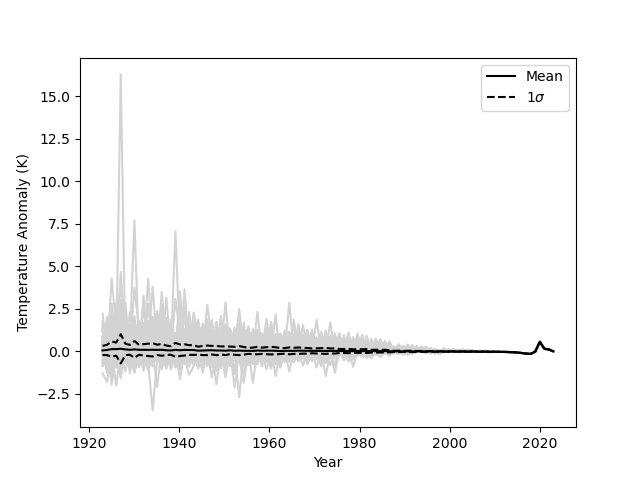

In [782]:
fig, ax= plt.subplots()
ax.plot(t,np.asarray(best_runs).T, c='lightgrey')
ax.plot(t,np.mean(np.asarray(best_runs).T, axis=1), c= 'black', label='Mean')
ax.plot(t,np.mean(np.asarray(best_runs).T, axis=1) + np.std(np.asarray(best_runs).T, axis=1), 
        c= 'black', 
        ls='--', 
        label='1$\sigma$')
ax.plot(t,np.mean(np.asarray(best_runs).T, axis=1) - np.std(np.asarray(best_runs).T, axis=1), 
        c= 'black', 
        ls='--', )
ax.legend()
ax.set_ylabel('Temperature Anomaly (K)')
ax.set_xlabel('Year')
plt.show()

<IPython.core.display.Javascript object>


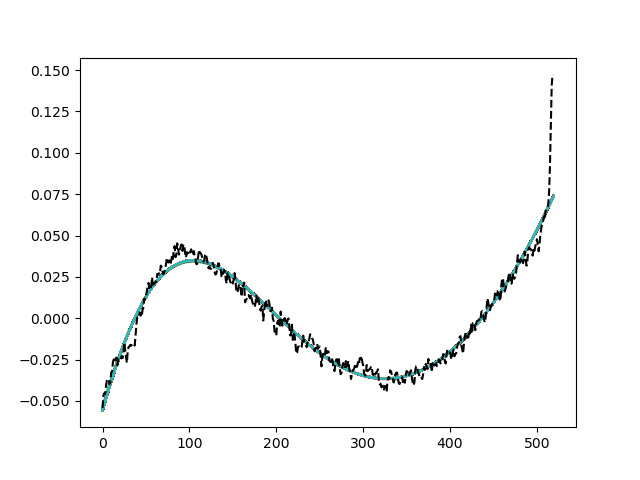

In [783]:
fig, ax= plt.subplots()
ax.plot(np.asarray(best_pred_data).T)
ax.plot(d_obs, ls='--', c='black')
plt.show()

# Can we forward model these to ge borehole temps instead of from the G matrix?

In [422]:
saved_profiles = []

for i in np.asarray(best_runs):
    import numpy as np

    #Parameters

    tmax = 2023
    tmin = 1923
    zmax = bottom_trend - top_trend#150
    dTdz = 0.02
    nz = len(mean_tot.sel(x=slice(top_trend,bottom_trend)))
    nt = 99
    alpha = 35
    accumulation = 0
    years=1000
    #heating = np.linspace(-1,1, int(years/dt)) #linear warming
    avg = 0
    std_dev = 20
    number_of_iterations = 1

    t_surf = 4 * np.eye(nt)

    A = np.zeros((nt+1,nz+1))

    for j in range(nt):
        this_t_surf = i
    #     if i == 20: this_t_surf = 10*this_t_surf
        U,t,z = heat(this_t_surf,
             tmax = tmax,
             tmin = tmin,
             zmax = zmax,
             dTdz = dTdz,
             nz = nz,
             nt = nt,
             alpha = alpha,
             accumulation = accumulation)
        now = U[:,-1]
        A[j,:] = now
    A = A.T
    saved_profiles.append(A)
    #     print(z.shape)
    #     heat_plot(t, t_surf, 0, 1000, z, U)
    print(np.asarray(i))

[-5.69417692e-05  1.65628610e-01 -6.35109745e-06 -6.99433145e-06
 -4.92168514e-01 -8.48283598e-06 -2.65345707e-01 -1.02881180e-05
 -1.13300903e-05 -1.24775927e-05  3.34270280e-01 -1.51330225e-05
 -1.66656828e-05 -1.83535698e-05 -2.02124047e-05  2.70393710e-01
 -2.45139254e-05 -2.69966761e-05 -2.97308779e-05 -5.33540527e-01
 -3.60580810e-05  5.93352243e-01 -4.37318133e-05 -4.81609366e-05
 -5.30386379e-05  2.85108502e-02 -6.43261027e-05 -7.08409992e-05
 -7.80157194e-05 -8.59170895e-05 -2.89181108e-01 -1.04201611e-04
 -1.14755068e-04 -1.26377370e-04 -1.39176770e-04 -1.53272482e-04
 -5.81037932e-01  5.11516859e-01 -2.04718226e-04 -2.25451925e-04
 -2.48285517e-04 -2.73431678e-04 -3.01124621e-04 -3.31622284e-04
 -3.65208726e-04 -3.47050214e-01 -4.42930947e-04 -4.87790642e-04
 -5.37193691e-04  8.24618738e-01 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04 -8.70198042e-04 -9.58331010e-04  4.27291043e-01
 -1.16227908e-03 -1.27999379e-03 -1.40963056e-03 -1.55239684e-03
 -1.70962239e-03 -1.88277

[-1.95025874e-01  2.01215367e-03 -6.35254776e-01 -6.99433145e-06
 -7.70271162e-06 -8.48283598e-06  7.67906441e-02 -4.04323415e-01
 -1.13300903e-05 -1.24775927e-05 -1.37413133e-05 -1.51330225e-05
  2.64626380e-02 -1.83535698e-05  1.42715623e-01  2.71940031e-01
 -2.45139254e-05  3.47000878e-01 -2.97308779e-05  1.17431057e-01
 -3.60580810e-05  5.05362603e-03 -4.37318133e-05 -4.81609366e-05
 -5.30386379e-05  1.18094183e-01  7.82888203e-01 -7.08409992e-05
 -7.80157194e-05  2.51835333e-01 -9.46187040e-05 -7.51516232e-01
 -1.14755068e-04 -1.26377370e-04  5.81946990e-01 -4.76969817e-01
 -1.68795798e-04  2.64568034e-01  6.95300163e-02 -2.25451925e-04
 -2.48285517e-04  7.96015779e-01 -3.01124621e-04 -3.31622284e-04
 -3.65208726e-04 -4.02196776e-04 -4.42930947e-04 -1.95992277e-01
 -5.37193691e-04 -5.91600242e-04 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04 -8.70198042e-04 -9.58331010e-04 -1.05539002e-03
 -1.16227908e-03 -1.27999379e-03 -1.40963056e-03 -1.55239684e-03
  3.75283313e-01 -1.88277

[-3.08681990e-01 -5.76701853e-06 -6.35109745e-06 -3.56198864e-01
  8.65227742e-02 -8.48283598e-06 -9.34197079e-06 -1.02881180e-05
 -1.13300903e-05 -1.24775927e-05 -1.37413133e-05 -1.51330225e-05
  1.11729342e-02 -1.83535698e-05 -2.02124047e-05 -2.22595009e-05
 -4.55071616e-02  2.78614310e-01 -2.97308779e-05 -3.27419975e-05
 -3.60580810e-05 -3.97100147e-05 -4.37318133e-05 -4.81609366e-05
 -5.30386379e-05 -5.84103490e-05 -4.82336557e-01 -7.08409992e-05
 -7.80157194e-05 -8.59170895e-05 -9.46187040e-05 -1.04201611e-04
 -1.14755068e-04 -1.26377370e-04 -1.39176770e-04 -3.93662635e-01
  1.87925051e-02 -1.85891302e-04 -2.04718226e-04 -2.25451925e-04
 -2.48285517e-04 -2.73431678e-04 -3.01124621e-04 -3.31622284e-04
 -2.63797185e-01 -4.02196776e-04 -4.42930947e-04 -4.87790642e-04
 -5.37193691e-04 -5.91600242e-04 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04 -8.70198042e-04 -9.58331010e-04 -1.05539002e-03
 -1.16227908e-03 -1.27999379e-03 -1.40963056e-03 -1.55239684e-03
 -1.70962239e-03 -1.88277

[-5.69417692e-05  2.28692176e-01 -6.35109745e-06 -6.99433145e-06
 -7.70271162e-06 -8.48283598e-06  3.08947217e-01  3.00205329e-01
 -1.13300903e-05 -1.24775927e-05 -1.37413133e-05 -1.51330225e-05
  1.59953182e+00 -1.83535698e-05  1.49675478e+00 -2.22595009e-05
 -2.45139254e-05  4.02316759e-01 -2.97308779e-05  2.37204559e-01
  4.32032870e-01 -3.97100147e-05 -4.37318133e-05 -4.81609366e-05
 -5.30386379e-05  5.88739821e-01 -6.43261027e-05  9.58592365e-02
 -7.80157194e-05  1.16217222e-01 -9.46187040e-05 -1.04201611e-04
 -1.14755068e-04 -1.26377370e-04 -1.39176770e-04 -1.53272482e-04
  4.52727457e-01 -1.85891302e-04  8.24266682e-01 -2.25451925e-04
 -2.48285517e-04 -2.73431678e-04 -3.01124621e-04 -3.31622284e-04
 -3.65208726e-04  2.61500542e-01 -4.42930947e-04 -4.87790642e-04
 -5.37193691e-04  1.86482938e-01  2.36706676e-01 -7.17502176e-04
  2.01958083e-01 -8.70198042e-04 -9.58331010e-04 -1.05539002e-03
 -1.16227908e-03 -1.27999379e-03 -1.40963056e-03 -1.55239684e-03
 -1.70962239e-03 -1.88277

[ 3.98123336e-01 -5.76701853e-06  6.05608550e-01  4.44399670e-01
 -7.70271162e-06 -8.48283598e-06  1.71879080e-01 -1.02881180e-05
 -1.13300903e-05 -1.24775927e-05 -1.37413133e-05 -1.51330225e-05
 -1.66656828e-05 -1.83535698e-05 -2.02124047e-05 -2.22595009e-05
  2.51840102e-01 -2.69966761e-05 -2.97308779e-05 -3.27419975e-05
  2.71951954e+00 -3.97100147e-05 -4.37318133e-05 -4.81609366e-05
 -5.30386379e-05 -5.84103490e-05 -6.43261027e-05  4.53943197e-01
  2.85393721e-02 -8.59170895e-05 -9.46187040e-05 -1.04201611e-04
 -1.14755068e-04 -1.26377370e-04 -1.39176770e-04 -1.53272482e-04
 -1.68795798e-04  1.41956360e-01 -2.04718226e-04 -2.25451925e-04
 -2.48285517e-04 -2.73431678e-04 -3.01124621e-04 -3.31622284e-04
 -3.65208726e-04  8.96386089e-03 -4.42930947e-04 -4.87790642e-04
  1.74653007e-01 -5.91600242e-04 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04 -8.70198042e-04 -9.58331010e-04 -1.05539002e-03
  7.07223265e-03 -1.27999379e-03  2.14241952e-01  1.11696434e-01
 -1.70962239e-03 -1.88277

[-5.69417692e-05  3.68402162e-01  7.33961062e-02 -6.99433145e-06
 -7.70271162e-06 -8.48283598e-06 -9.34197079e-06 -1.02881180e-05
  4.51322224e-01 -1.24775927e-05 -1.37413133e-05 -1.51330225e-05
 -1.66656828e-05 -1.83535698e-05 -2.02124047e-05 -2.22595009e-05
 -2.45139254e-05 -2.69966761e-05 -2.97308779e-05 -3.27419975e-05
 -3.60580810e-05 -3.97100147e-05 -4.37318133e-05 -4.81609366e-05
 -5.30386379e-05 -5.84103490e-05 -3.62973105e-01 -7.08409992e-05
 -5.95825890e-01 -8.59170895e-05 -9.46187040e-05 -1.04201611e-04
 -1.14755068e-04 -1.26377370e-04 -1.39176770e-04 -1.53272482e-04
 -1.68795798e-04 -1.85891302e-04 -2.04718226e-04 -2.25451925e-04
 -2.48285517e-04 -2.73431678e-04 -3.01124621e-04 -3.31622284e-04
 -3.65208726e-04 -4.02196776e-04 -4.42930947e-04 -4.87790642e-04
 -5.37193691e-04 -5.91600242e-04 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04 -8.70198042e-04 -9.58331010e-04 -1.05539002e-03
 -1.16227908e-03 -1.27999379e-03 -5.73386173e-04 -1.55239684e-03
 -1.70962239e-03 -1.88277

[-5.69417692e-05 -5.76701853e-06  2.40690322e-01 -6.99433145e-06
 -7.70271162e-06 -8.48283598e-06  1.06409257e+00 -1.02881180e-05
  4.08665941e-03 -1.24775927e-05 -1.37413133e-05 -1.51330225e-05
  2.12294881e-01 -1.83535698e-05 -4.32388045e-01 -2.22595009e-05
  4.19927983e-02  4.79037074e-01 -2.97308779e-05 -3.27419975e-05
  4.27054235e-01  3.32678068e-01 -4.37318133e-05 -4.81609366e-05
 -5.30386379e-05 -5.84103490e-05 -6.43261027e-05 -7.08409992e-05
 -7.80157194e-05 -8.59170895e-05 -9.46187040e-05 -1.04201611e-04
  1.35886470e-01 -1.26377370e-04 -1.39176770e-04 -1.53272482e-04
  1.07276395e+00 -1.85891302e-04 -2.04718226e-04 -2.25451925e-04
 -2.18856977e-01 -2.73431678e-04 -3.01124621e-04  3.63236480e-01
 -3.65208726e-04 -4.02196776e-04 -4.42930947e-04 -4.87790642e-04
 -5.37193691e-04 -5.91600242e-04 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04  1.98177564e-01 -9.58331010e-04  2.81726440e-01
 -1.16227908e-03 -1.27999379e-03 -1.40963056e-03 -1.55239684e-03
 -1.70962239e-03 -1.88277

[-5.69417692e-05  4.00928603e-02 -6.35109745e-06 -6.99433145e-06
 -7.70271162e-06 -1.13880003e+00 -9.34197079e-06 -1.02881180e-05
 -1.13300903e-05 -1.24775927e-05  1.08729131e-02  1.72967655e-01
 -1.66656828e-05 -1.83535698e-05 -2.02124047e-05 -2.22595009e-05
 -2.45139254e-05 -2.69966761e-05 -2.97308779e-05 -3.27419975e-05
  6.25654922e-02  6.84682924e-01 -4.37318133e-05  6.69204948e-01
 -5.30386379e-05 -5.53193416e-01 -6.43261027e-05 -7.08409992e-05
  6.31017670e-02 -8.59170895e-05 -9.46187040e-05 -1.04201611e-04
 -5.76771964e-01 -1.26377370e-04  5.05756482e-02 -2.10878083e-02
 -1.68795798e-04 -1.85891302e-04 -2.04718226e-04 -2.25451925e-04
 -2.48285517e-04 -2.13843862e-01  1.14591679e-02 -3.31622284e-04
 -3.65208726e-04 -4.02196776e-04 -4.42930947e-04 -4.87790642e-04
 -5.37193691e-04 -5.91600242e-04 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04 -8.70198042e-04 -9.58331010e-04 -1.05539002e-03
 -1.16227908e-03 -1.27999379e-03 -1.40963056e-03 -1.55239684e-03
 -1.70962239e-03 -1.88277

[-5.69417692e-05 -5.76701853e-06 -8.87495767e-01  6.79391221e-02
 -4.31006808e-01  6.28320248e-01  3.58948056e-02  5.42119825e-01
 -1.13300903e-05 -1.24775927e-05 -1.37413133e-05 -1.51330225e-05
 -1.66656828e-05 -1.83535698e-05  1.25473493e-01 -2.22595009e-05
 -2.45139254e-05  5.21380178e-01 -2.97308779e-05  1.07809884e+00
 -3.60580810e-05 -3.97100147e-05  1.44586995e-01 -4.81609366e-05
 -5.30386379e-05  6.91019263e-01  2.23006611e-01  1.02104197e-01
 -7.80157194e-05 -8.59170895e-05  2.33690019e-01 -1.04201611e-04
 -1.14755068e-04 -1.26377370e-04 -1.39176770e-04 -1.53272482e-04
 -1.68795798e-04 -1.85891302e-04 -2.04718226e-04 -2.25451925e-04
  4.46014709e-01 -2.73431678e-04 -3.01124621e-04 -3.31622284e-04
 -3.65208726e-04 -4.02196776e-04 -4.42930947e-04 -4.87790642e-04
  3.74206507e-01  1.60238608e-01 -6.51517046e-04 -7.17502176e-04
 -7.90170227e-04 -8.70198042e-04  4.78861250e-01 -1.05539002e-03
 -1.16227908e-03 -1.27999379e-03 -1.40963056e-03 -1.55239684e-03
 -1.70962239e-03 -1.88277

<IPython.core.display.Javascript object>


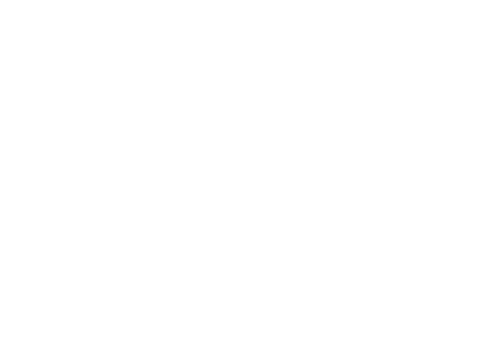

In [448]:
profiles = np.asarray(saved_profiles)[:,:,-2]
offset = -30.6
forward_profiles = profiles.T + offset

fig,ax = plt.subplots()
ax.plot(forward_profiles,z[::-1])
ax.plot(mean_tot.sel(x=slice(top_trend,bottom_trend)),z[::-1][:-1])

# Forward model to get borehole temps by perturbing the SVD

In [505]:
#Parameters

tmax = 2023
tmin = 1923
zmax = bottom_trend - top_trend#150
dTdz = 0.02
nz = len(mean_tot.sel(x=slice(top_trend,bottom_trend)))
nt = 99
alpha = 35
accumulation = 0

number_of_iterations = 100

In [506]:
#initial SVD to start the forward model
t_surf = np.eye(nt)

A = np.zeros((nt+1,nz+1))

for i in range(nt):
    this_t_surf = t_surf[i,:]
#     if i == 20: this_t_surf = 10*this_t_surf
    U,t,z = heat(this_t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)
    now = U[:,-1]
    A[i,:] = now
A = A.T
G_matrix = detrend(A,axis=0)
G_copy = G_matrix
#Singular value decomposition
u, s, v_T = np.linalg.svd(G_copy, full_matrices=True)

#Applying the thresholding
p = 4 
u_p = u[:,:p]
s_p = np.diag(s[:p])
vh_p = v_T.T[:,:p]

#Now finding the generalized G matrix

g_gen = u_p @ s_p @ vh_p.T

#And the inverse Gen G matrix

u_p_transpose = u_p.T
s_p_inv = np.linalg.inv(s_p)

g_inv = vh_p @ s_p_inv @ u_p_transpose


In [507]:
#Initialize model estimate
m_i = g_inv[:,:-1] @ anomaly.values

models = []
pred_data = []

<IPython.core.display.Javascript object>


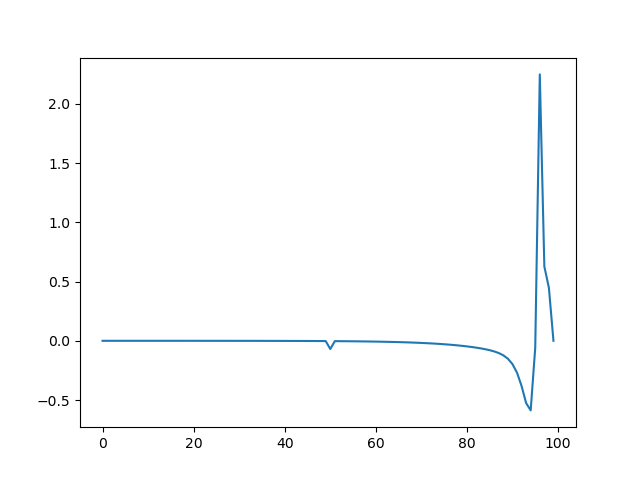

<IPython.core.display.Javascript object>


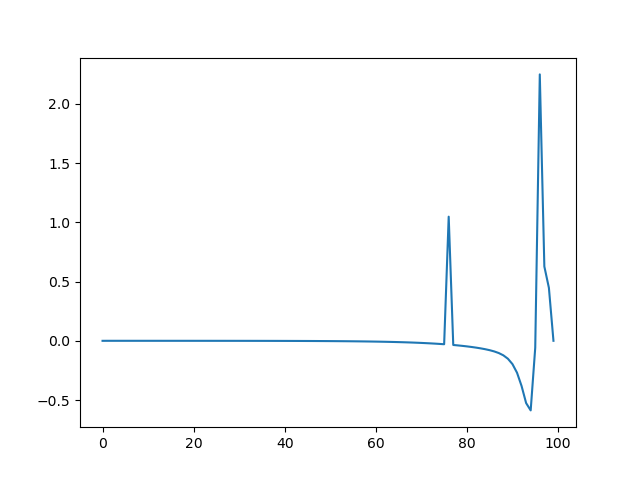

<IPython.core.display.Javascript object>


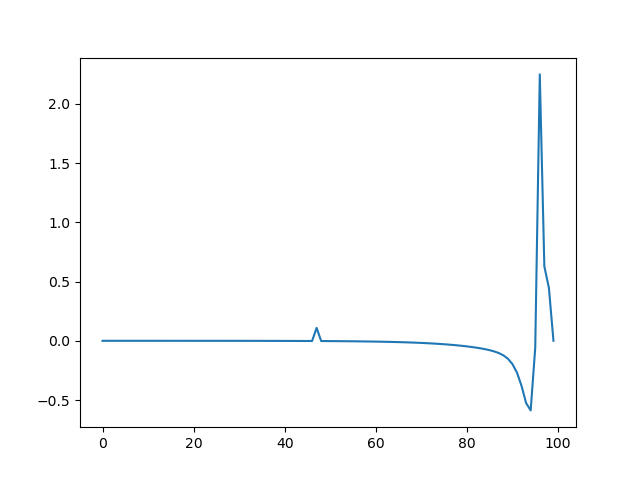

<IPython.core.display.Javascript object>


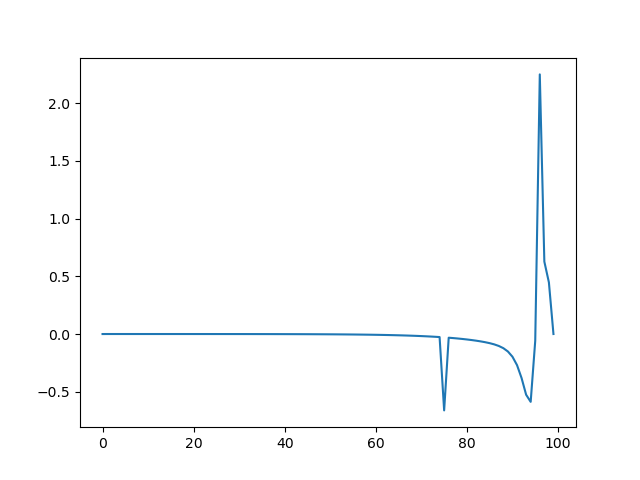

<IPython.core.display.Javascript object>


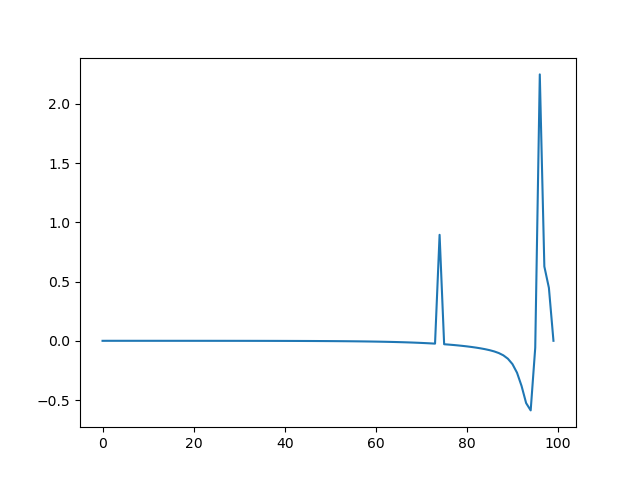

<IPython.core.display.Javascript object>


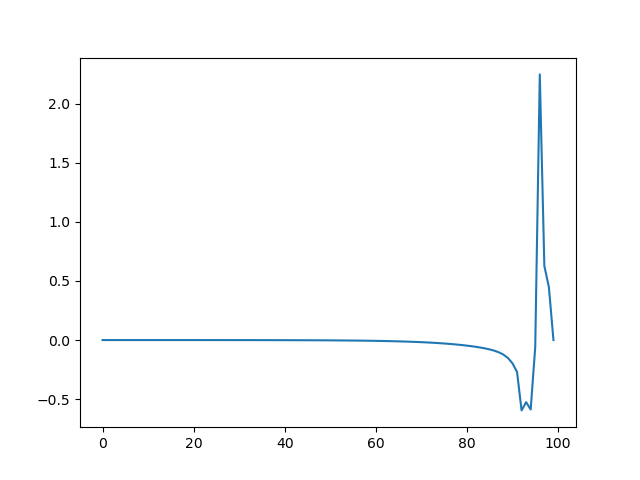

<IPython.core.display.Javascript object>


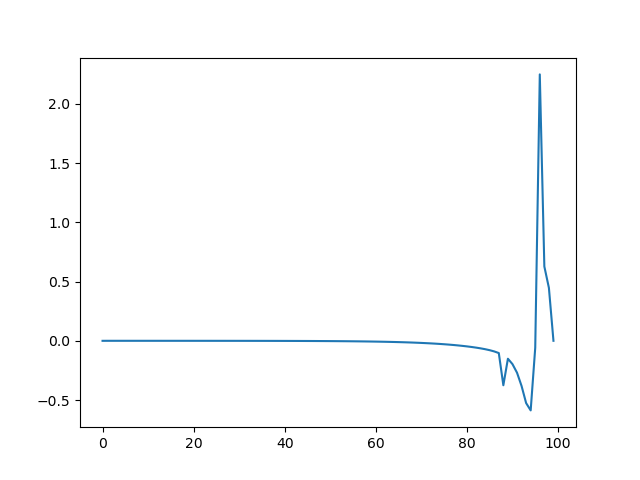

<IPython.core.display.Javascript object>


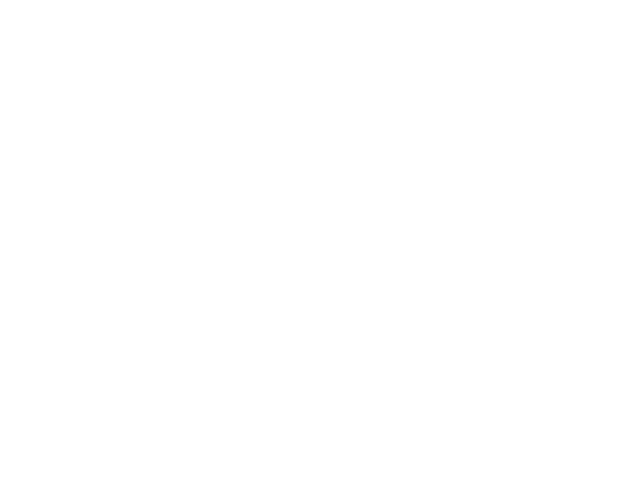

<IPython.core.display.Javascript object>


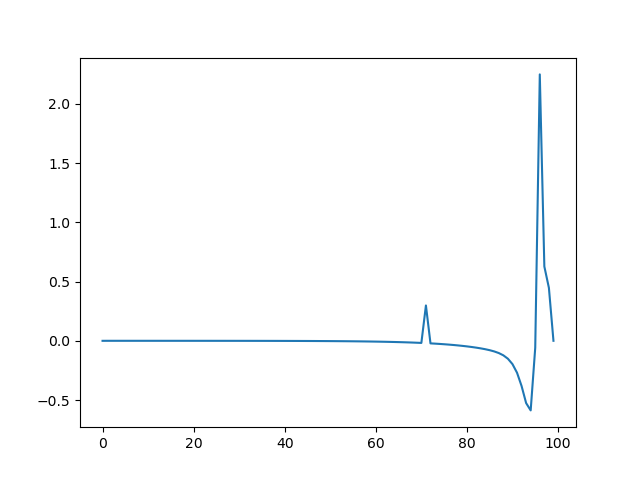

<IPython.core.display.Javascript object>


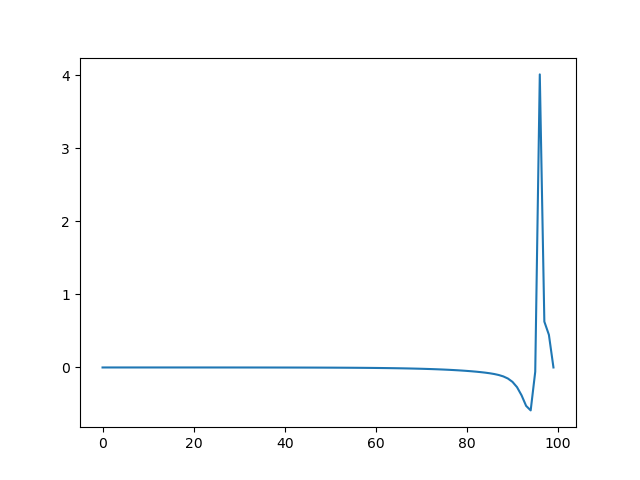

<IPython.core.display.Javascript object>


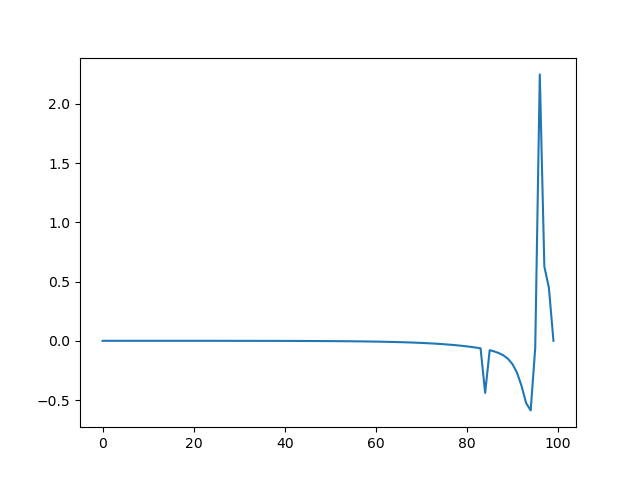

<IPython.core.display.Javascript object>


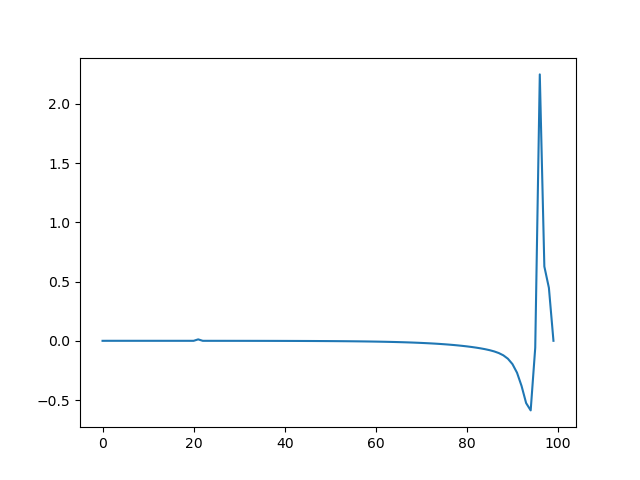

<IPython.core.display.Javascript object>


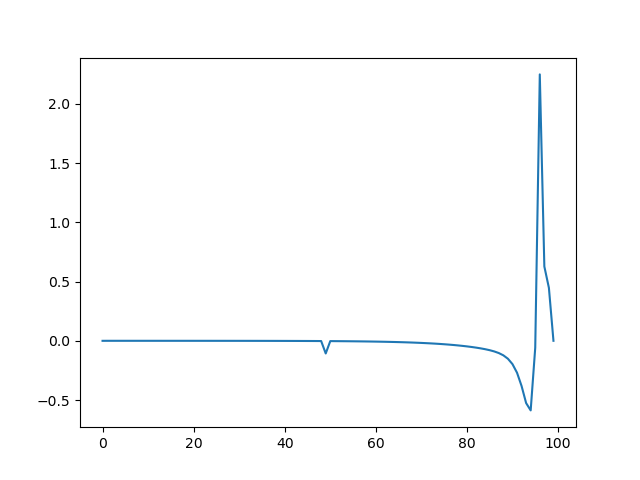

<IPython.core.display.Javascript object>


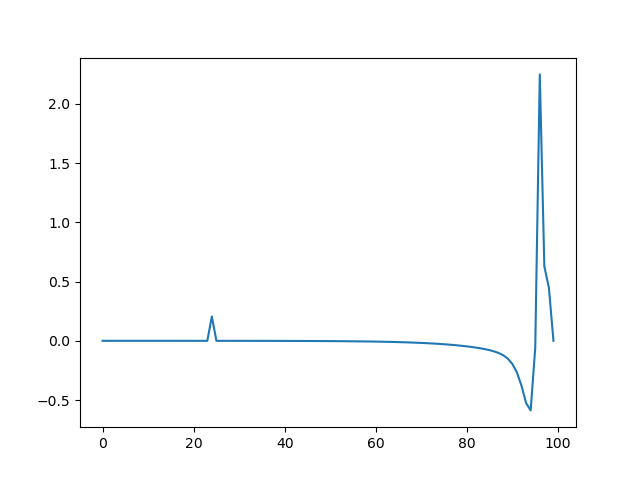

<IPython.core.display.Javascript object>


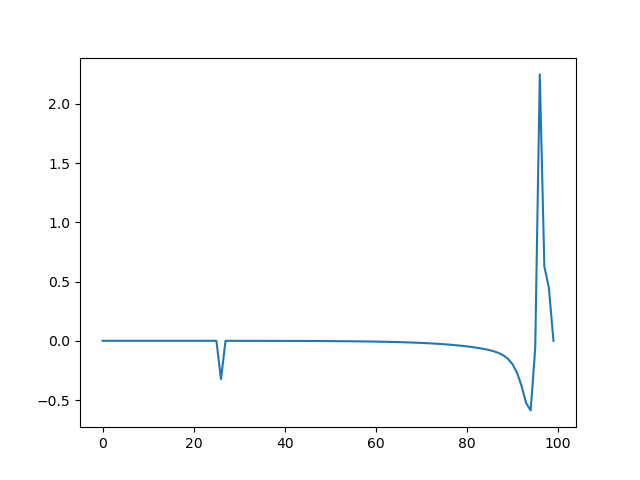

<IPython.core.display.Javascript object>


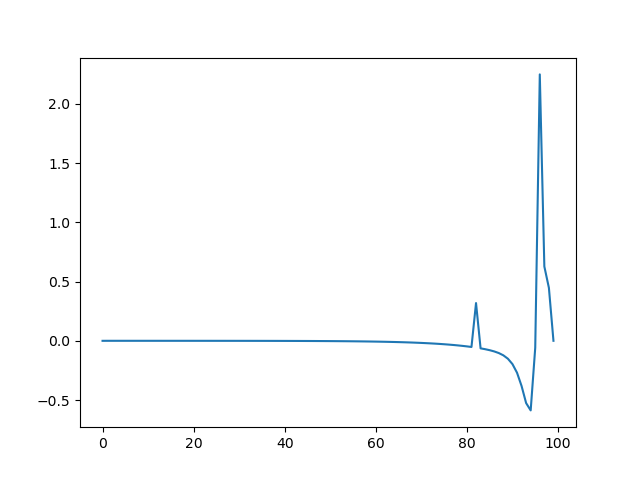

<IPython.core.display.Javascript object>


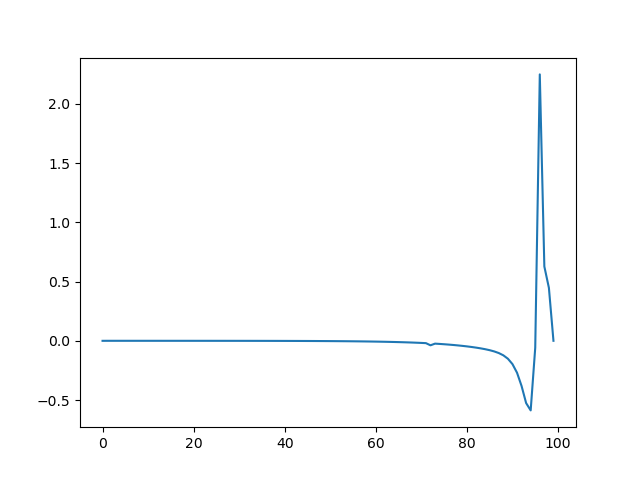

<IPython.core.display.Javascript object>


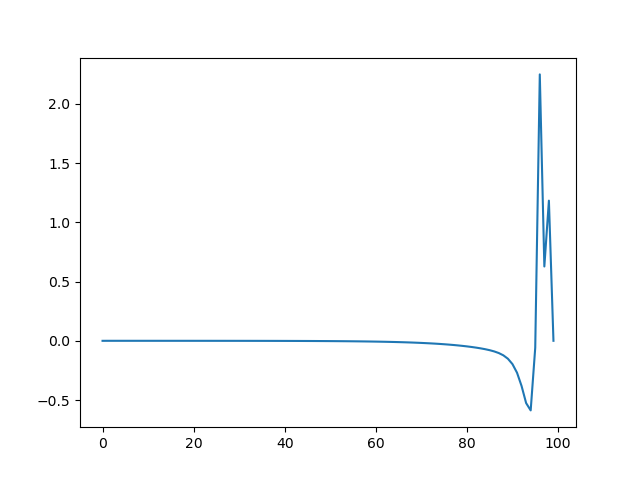

<IPython.core.display.Javascript object>


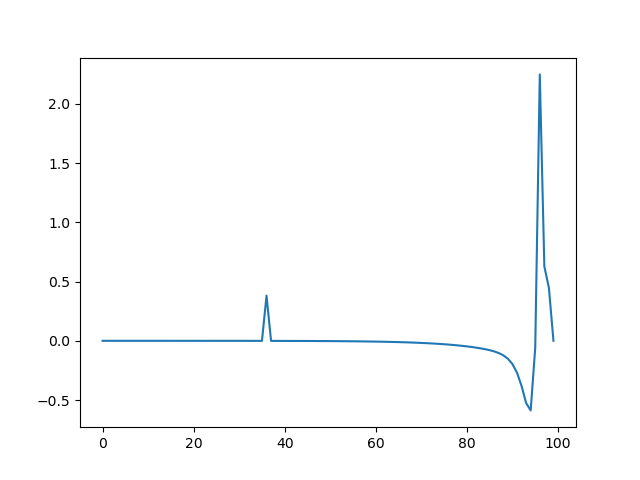

<IPython.core.display.Javascript object>


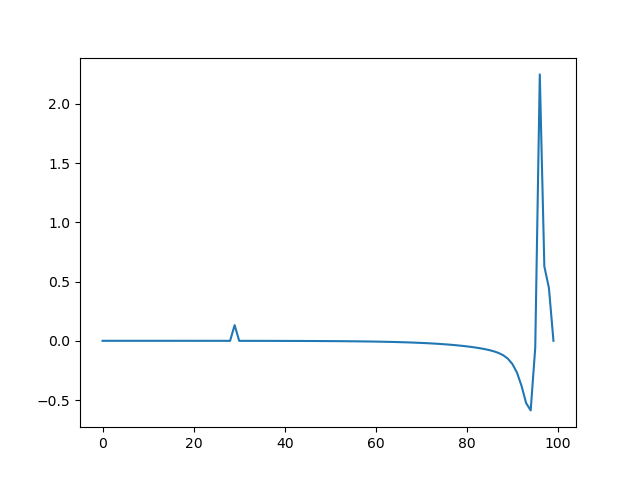

<IPython.core.display.Javascript object>


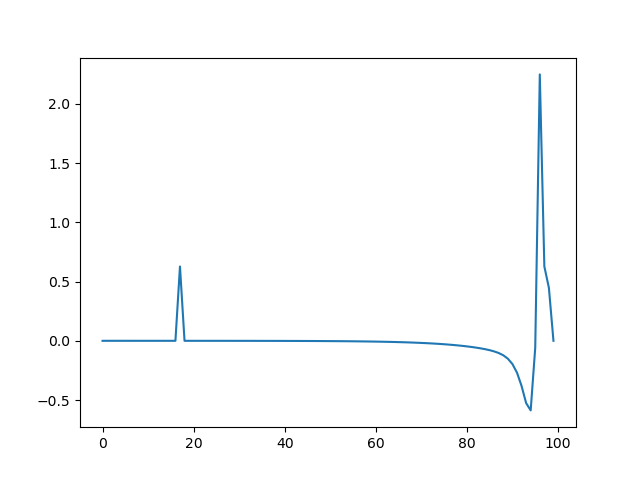

<IPython.core.display.Javascript object>


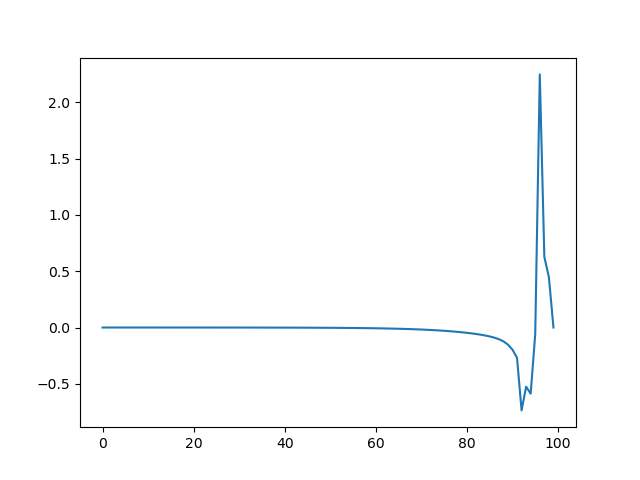

<IPython.core.display.Javascript object>


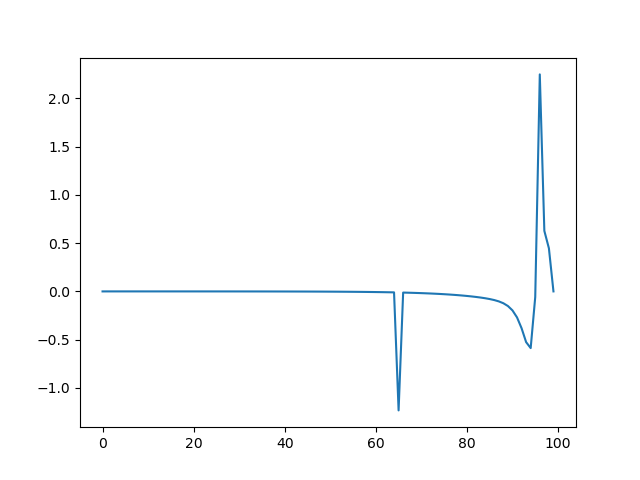

<IPython.core.display.Javascript object>


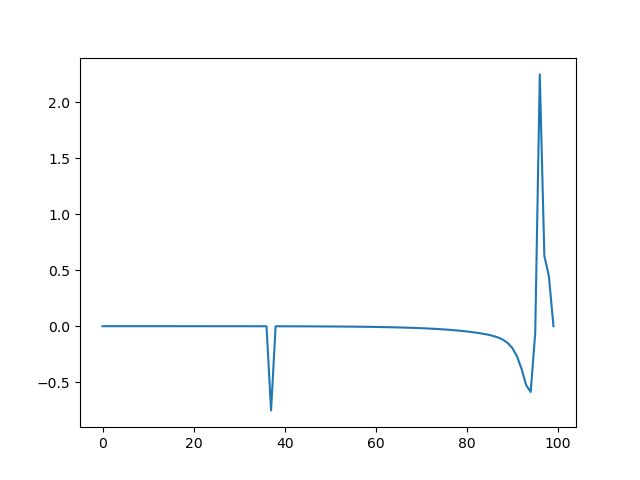

<IPython.core.display.Javascript object>


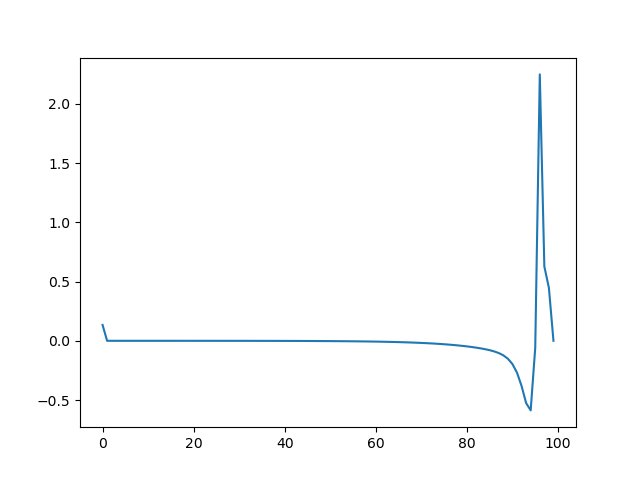

<IPython.core.display.Javascript object>


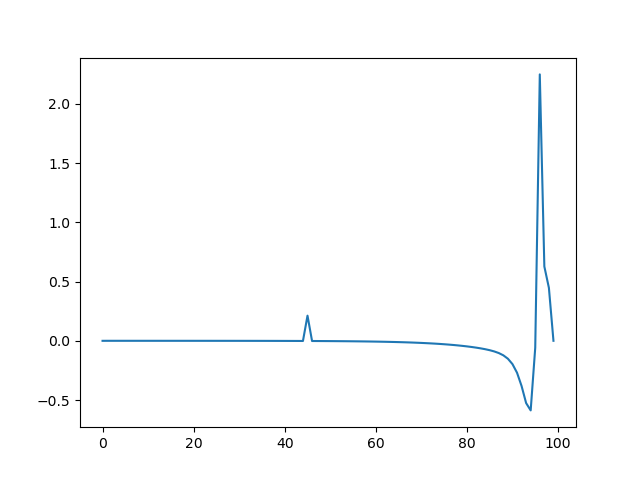

<IPython.core.display.Javascript object>


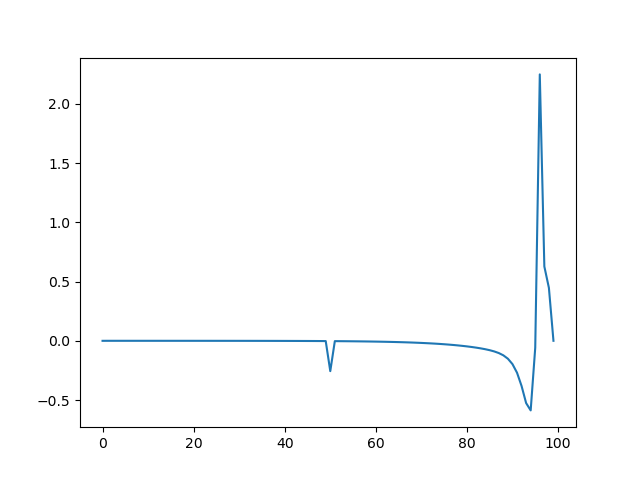

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


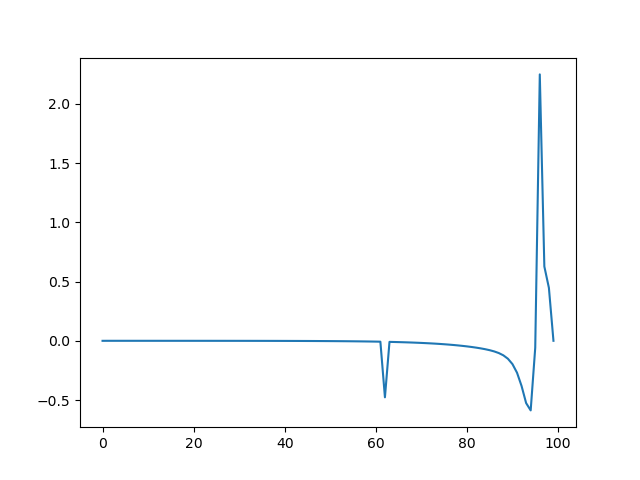

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


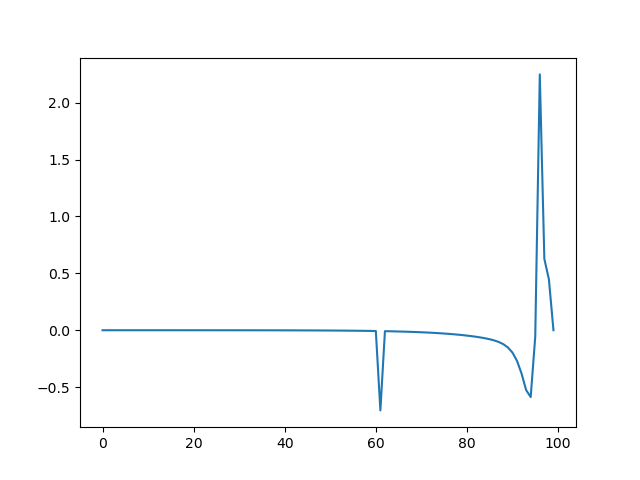

<IPython.core.display.Javascript object>


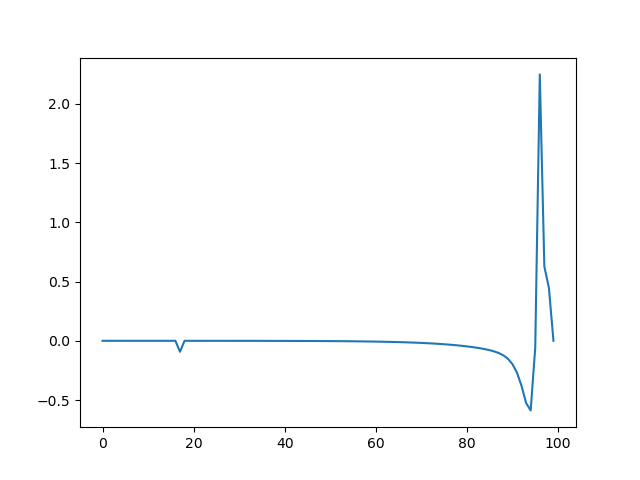

<IPython.core.display.Javascript object>


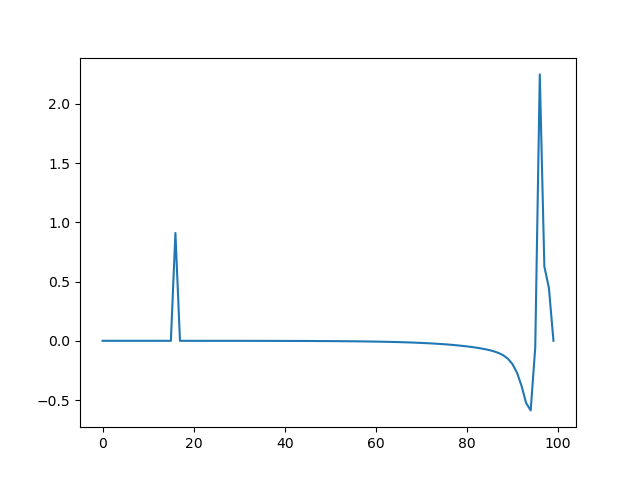

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


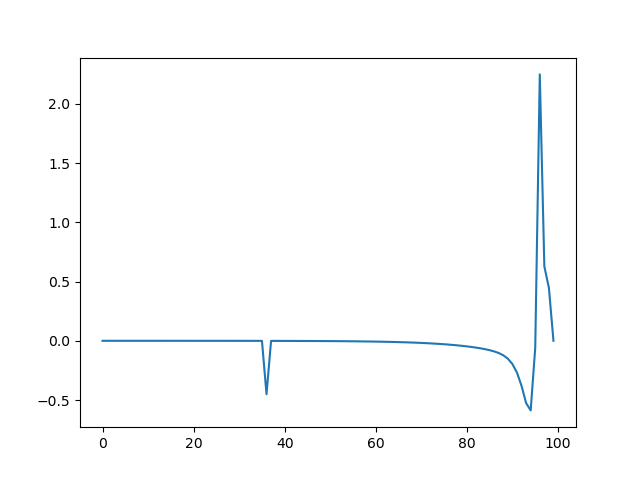

<IPython.core.display.Javascript object>


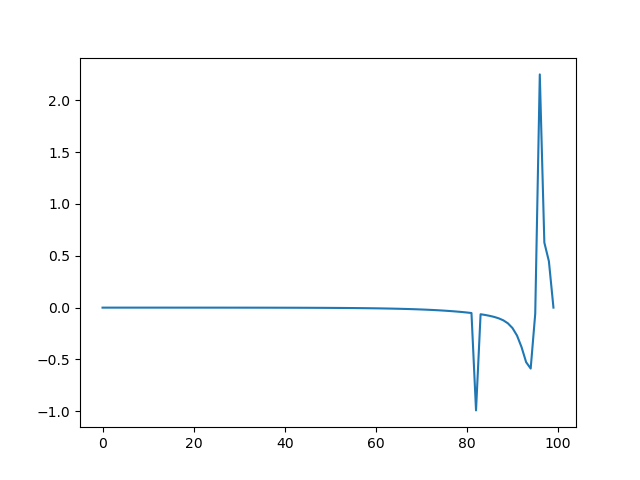

<IPython.core.display.Javascript object>


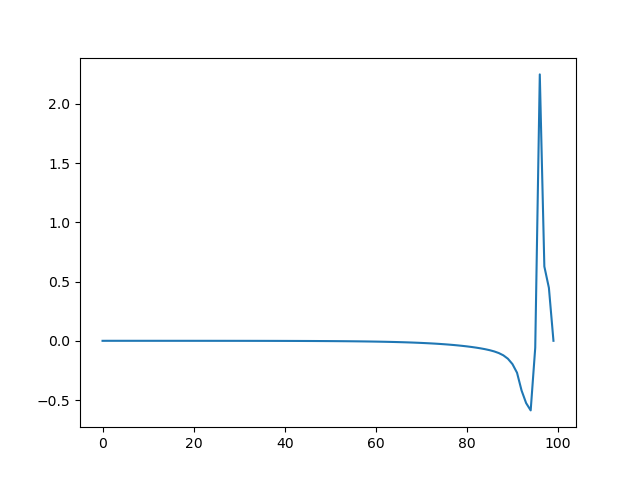

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


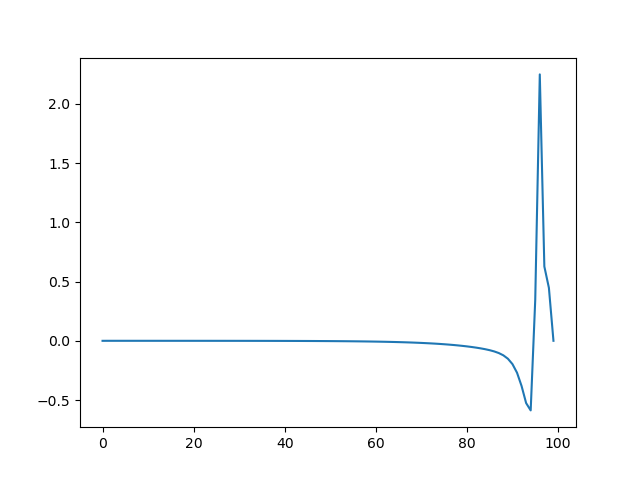

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


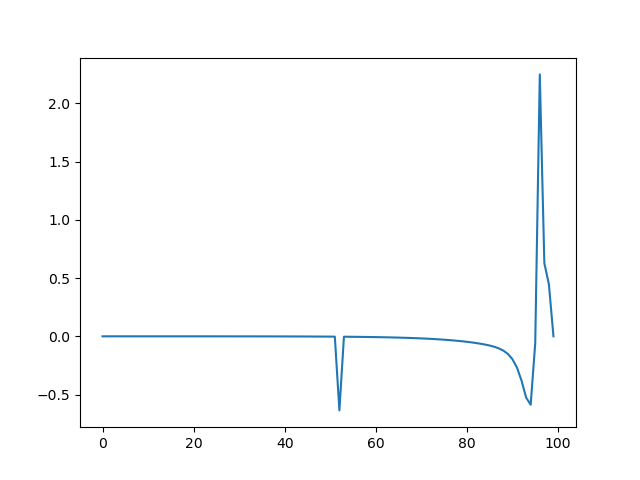

<IPython.core.display.Javascript object>


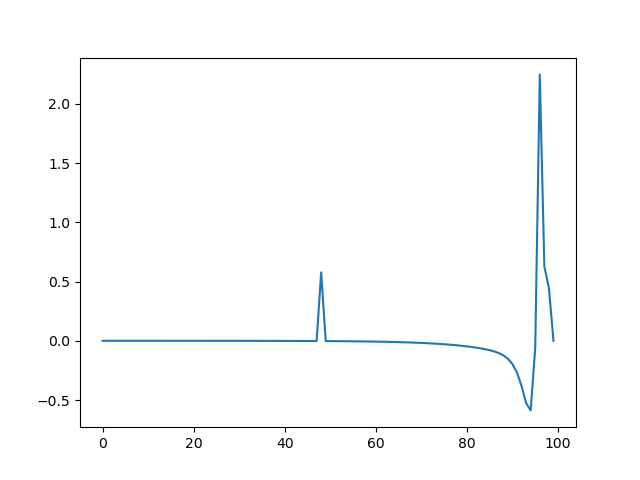

<IPython.core.display.Javascript object>


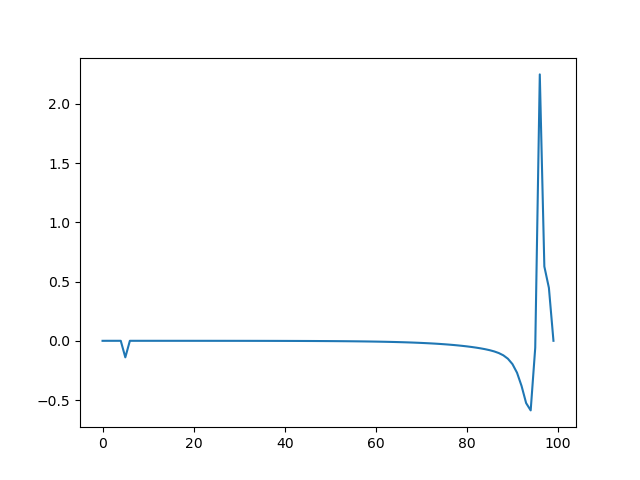

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


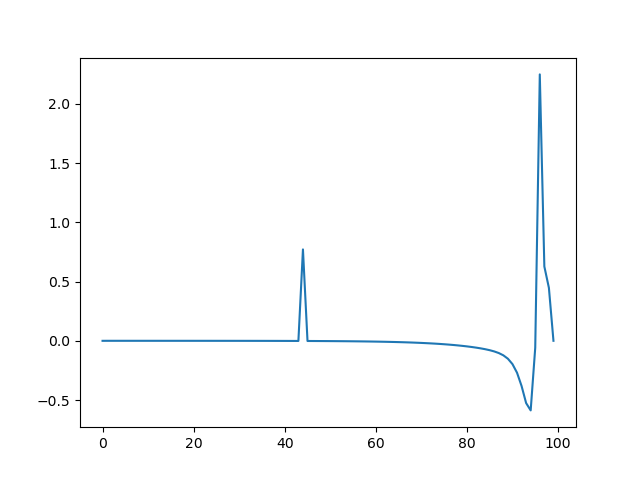

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


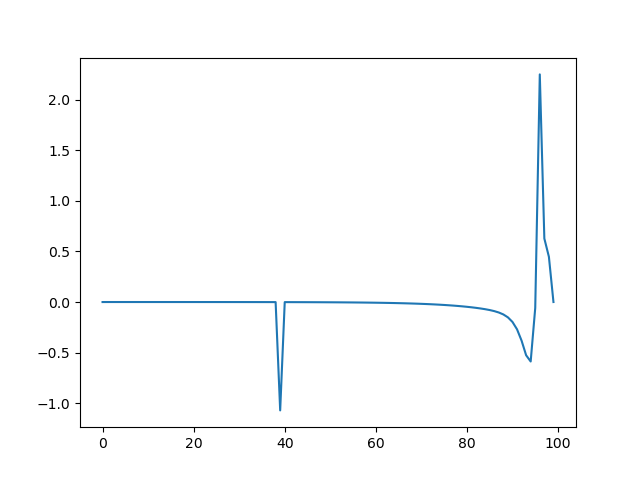

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


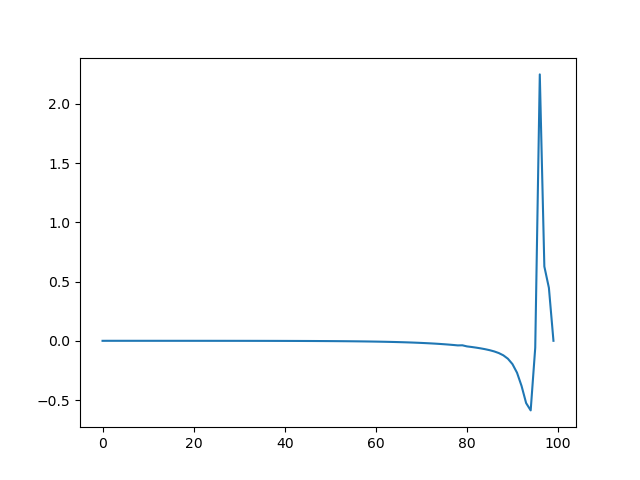

<IPython.core.display.Javascript object>


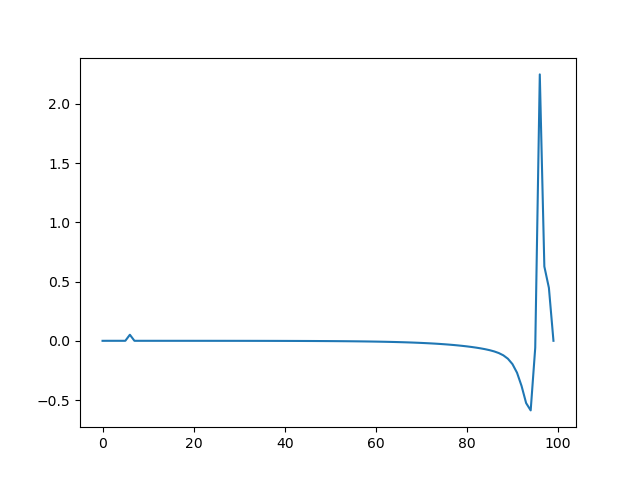

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


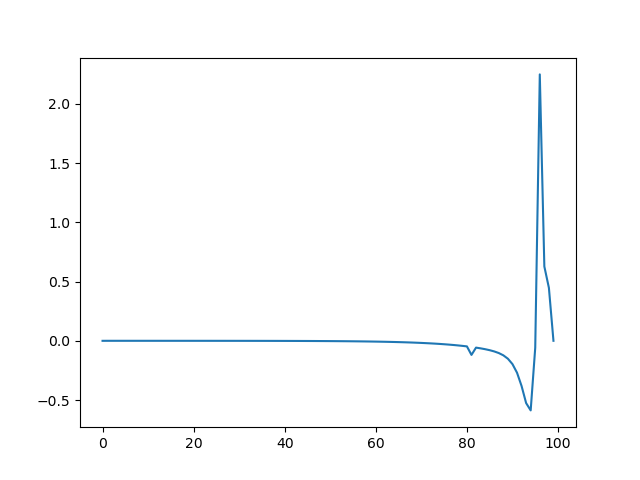

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


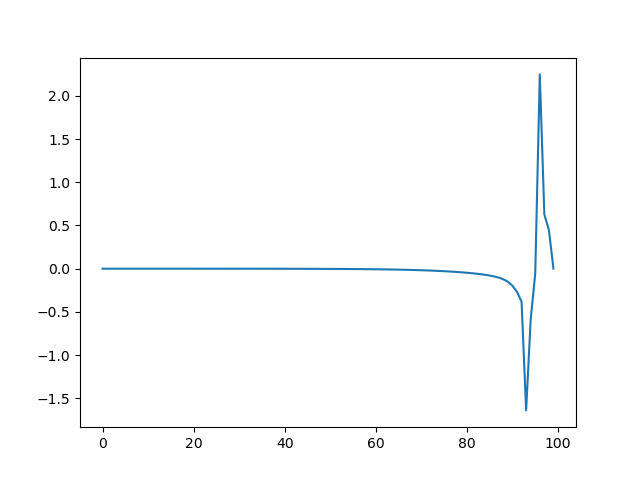

<IPython.core.display.Javascript object>


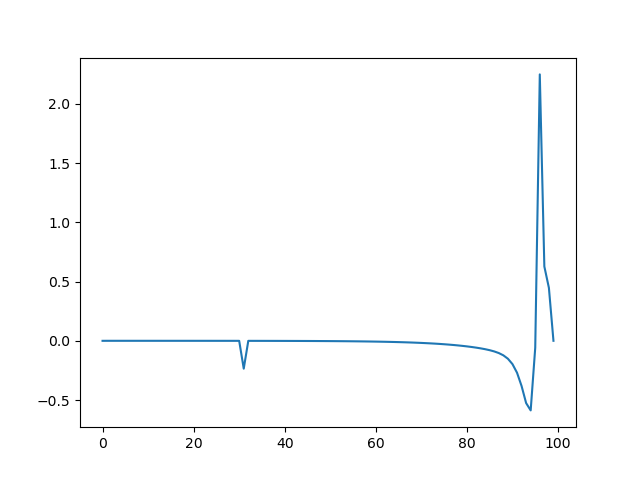

<IPython.core.display.Javascript object>


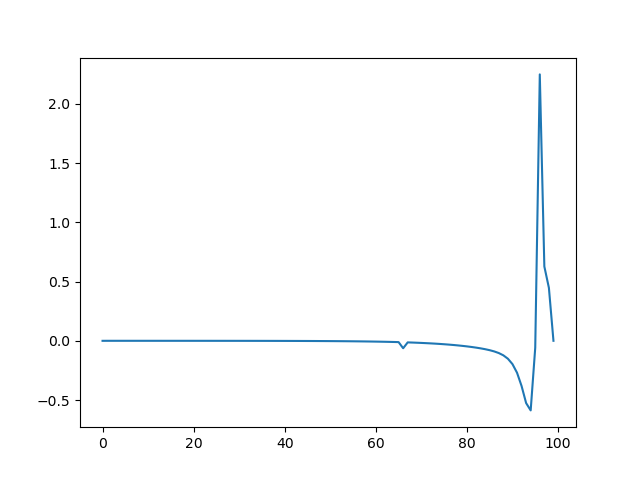

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


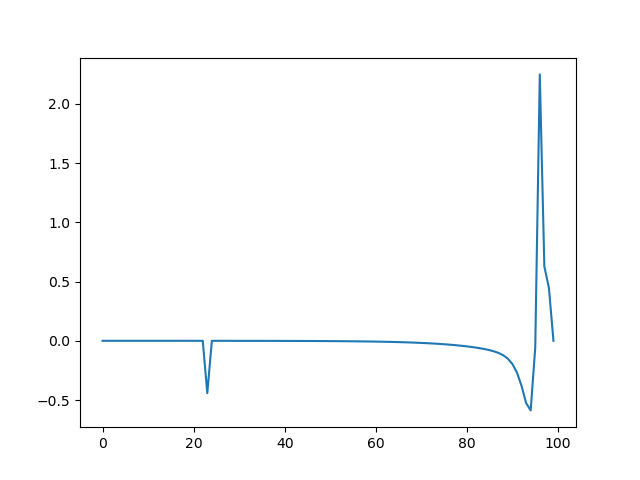

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


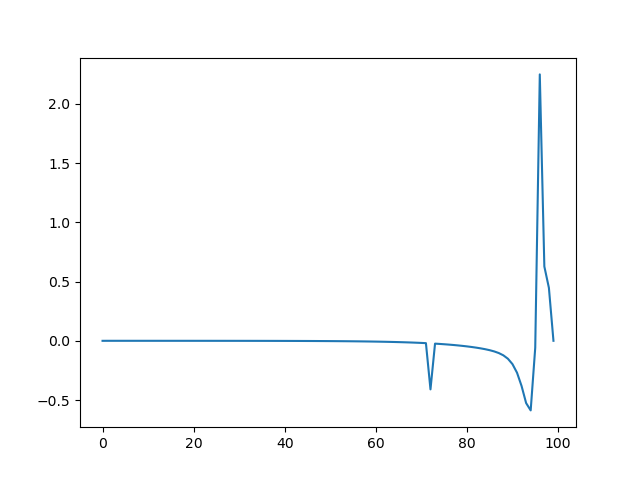

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


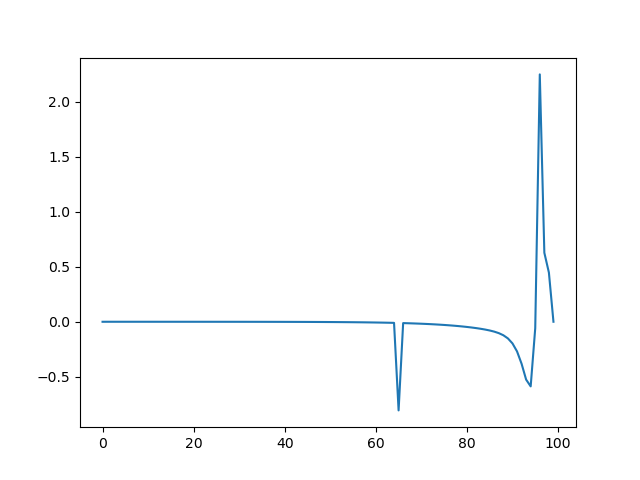

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


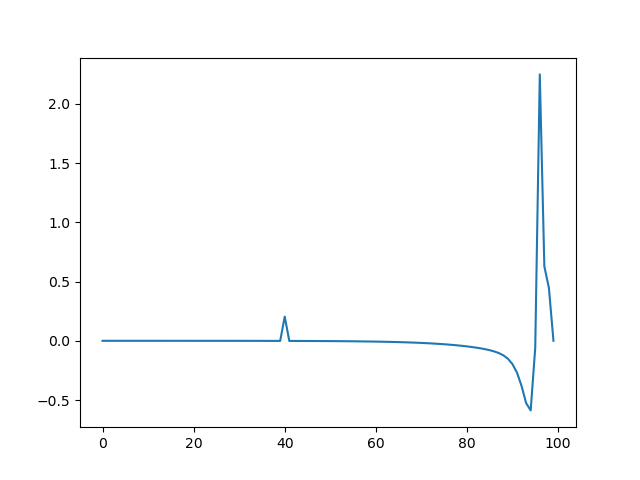

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


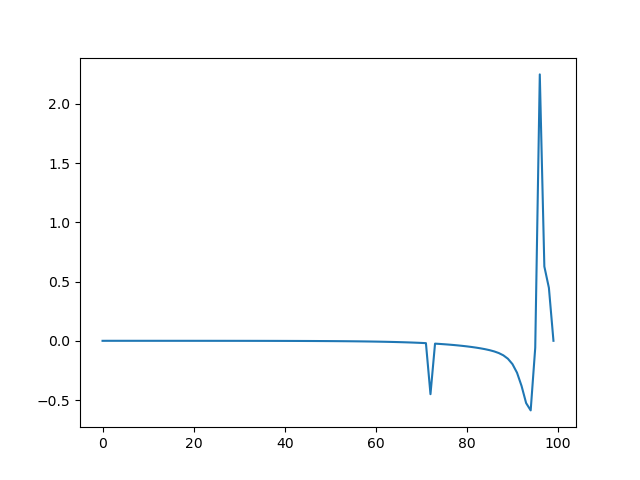

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


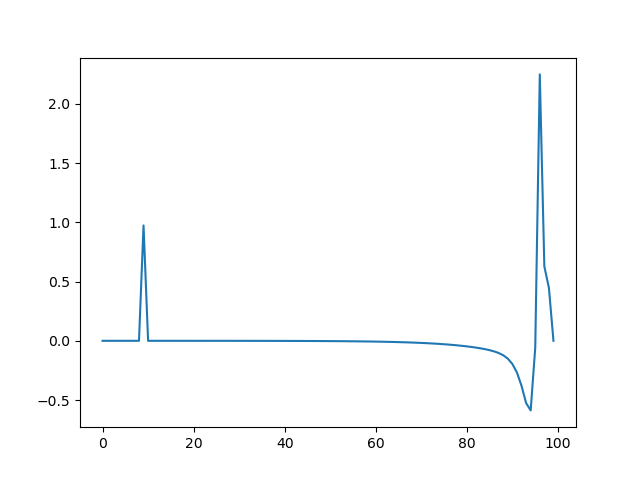

<IPython.core.display.Javascript object>


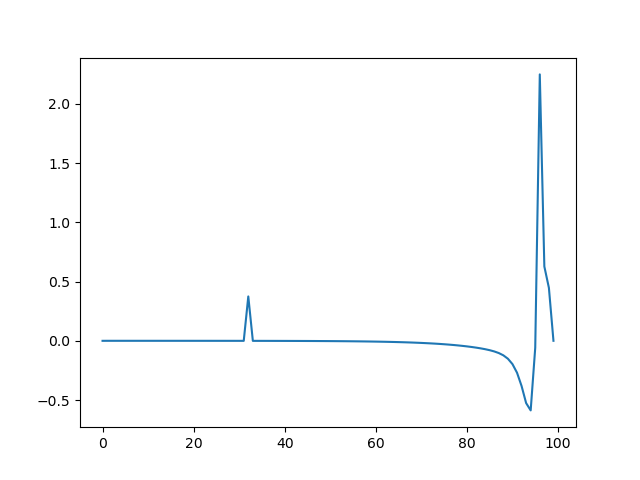

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


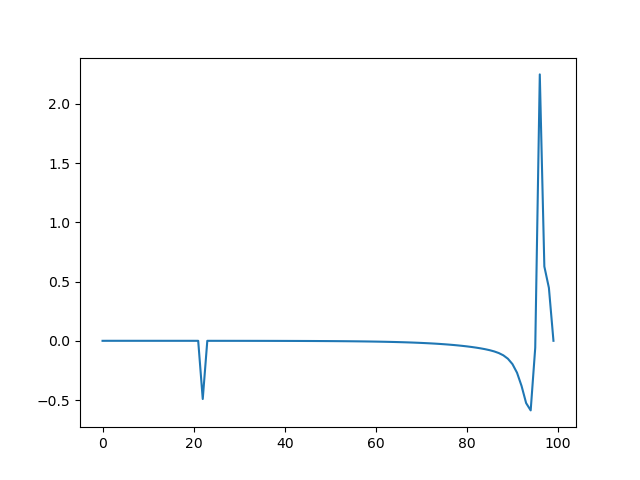

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


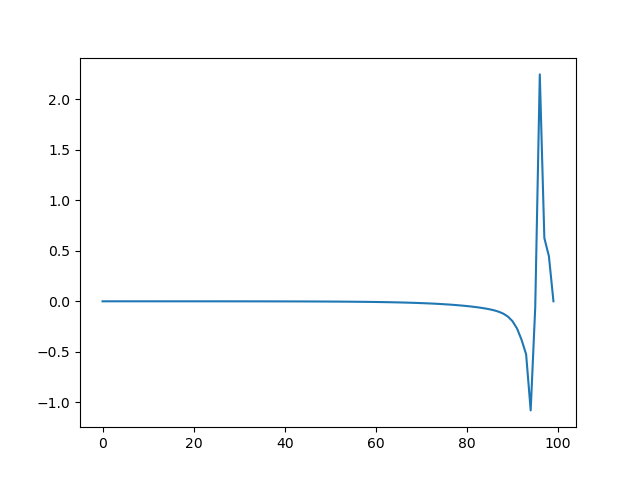

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


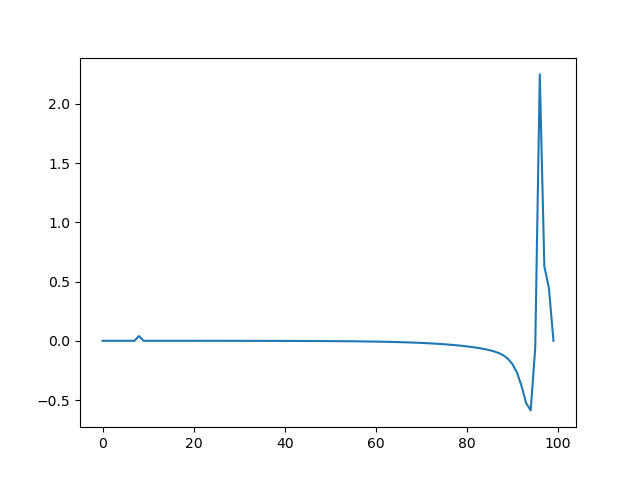

<IPython.core.display.Javascript object>

In [508]:
from heat import *

import numpy as np

for i in range(number_of_iterations):
    # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC

    year_change = np.random.randint(0,m_i.shape[0]) #randomly select a year to change


    m_next_copy = copy.deepcopy(m_i)
    change =  np.random.normal(loc=m_next_copy[year_change],scale=.5) #change that year's temperature according to a random gaussian walk 

    m_next_copy[year_change] = m_next_copy[year_change] + change
    t_surf = m_next_copy
    
    fig,ax = plt.subplots()
    ax.plot(t_surf)
    
    U,t,z = heat(t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)

    G_matrix = detrend(U,axis=0)
    
    #Singular value decomposition
    u, s, v_T = np.linalg.svd(G_matrix, full_matrices=True)
    
    p = 4 #Applying the thresholding
    u_p = u[:,:p]
    s_p = np.diag(s[:p])
    vh_p = v_T.T[:,:p]
    
    #Now finding the generalized G matrix

    g_gen = u_p @ s_p @ vh_p.T
    
    #And the inverse Gen G matrix

    u_p_transpose = u_p.T
    s_p_inv = np.linalg.inv(s_p)

    g_inv = vh_p @ s_p_inv @ u_p_transpose
    
    # new model estimates

    m_est = g_inv[:,:-1] @ anomaly.values
    d_pred = G_copy @ m_est
    
    models.append(m_est)
    pred_data.append(d_pred)


<IPython.core.display.Javascript object>


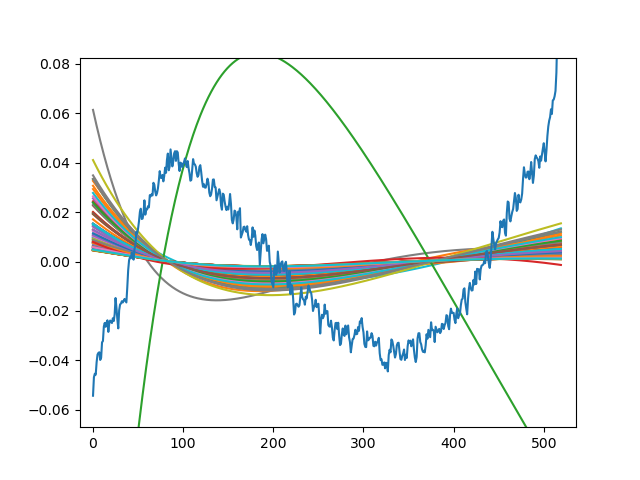

<IPython.core.display.Javascript object>


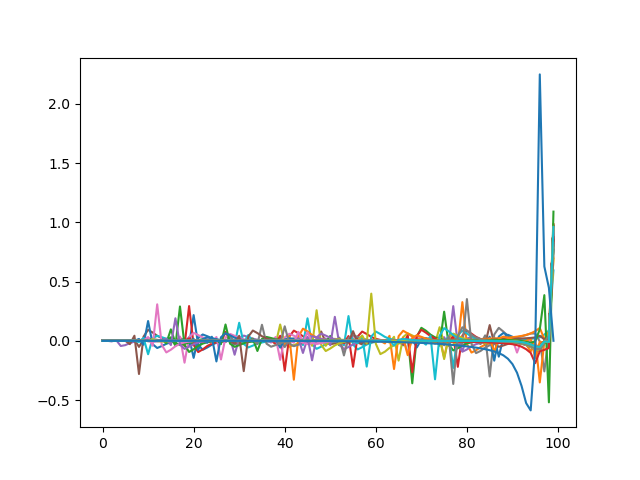

In [510]:
fig,ax = plt.subplots()

ax.plot(np.asarray(pred_data).T)
ax.plot(anomaly.values)
plt.show()

fig,ax = plt.subplots()
ax.plot(np.asarray(models).T)
ax.plot(m_i)

plt.show()

# Forward modeling without detrending

In [3]:
top_trend = 182 #optical distance (m)
bottom_trend = 314 #optical distance (m)
start_of_borehole = 162 #optical distance (m)

In [959]:
from heat import *

import numpy as np

#Parameters

tmax = 2023
tmin = 1923
zmax = bottom_trend - top_trend#150
dTdz = 0.02
nz = len(mean_tot.sel(x=slice(top_trend,bottom_trend)))
nt = 99
alpha = 46
accumulation = 0
years=1000
#heating = np.linspace(-1,1, int(years/dt)) #linear warming
avg = 0
std_dev = 20
number_of_iterations = 1

t_surf = np.eye(nt)

A = np.zeros((nt+1,nz+1))

for i in range(nt):
    this_t_surf = t_surf[i,:]
#     if i == 20: this_t_surf = 10*this_t_surf
    U,t,z = heat(this_t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)
    now = U[:,-1]
    A[i,:] = now
A = A.T
#     print(z.shape)
#     heat_plot(t, t_surf, 0, 1000, z, U)

<IPython.core.display.Javascript object>


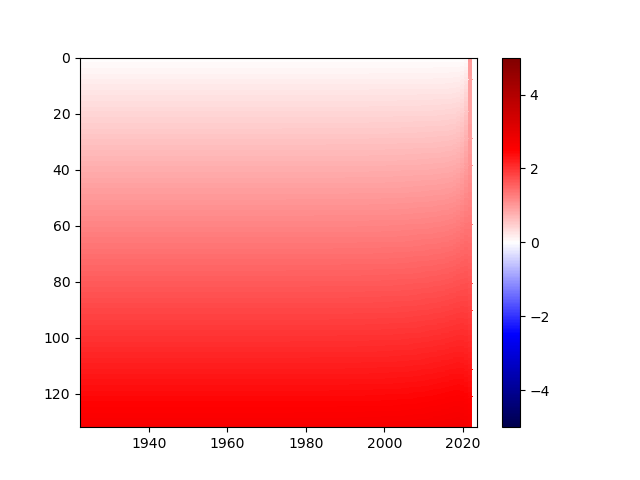

In [962]:
from scipy.signal import detrend
plt.subplots()
vm=5
c=plt.pcolor(t,z,A,vmin=-vm,vmax=vm,cmap='seismic')
# c=plt.pcolor(t,z,A,vmin=-vm,vmax=vm,cmap='seismic')
plt.colorbar(c)
plt.ylim([zmax,0])
plt.show()

(520, 100)


<IPython.core.display.Javascript object>


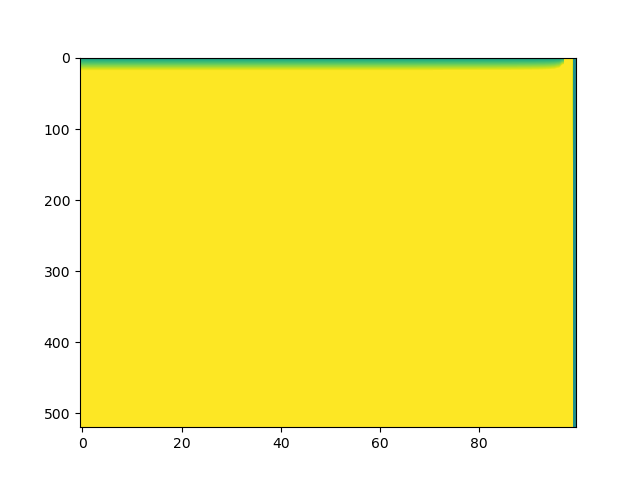

array([[0.00507694, 0.00507693, 0.00507693, ..., 0.00919404, 0.99683451,
        0.        ],
       [0.01015388, 0.01015385, 0.01015385, ..., 0.01832038, 0.993737  ,
        0.        ],
       [0.01523082, 0.01523078, 0.01523078, ..., 0.02737986, 0.99070692,
        0.        ],
       ...,
       [2.62985227, 2.62984697, 2.62984708, ..., 2.68792185, 2.65683593,
        0.        ],
       [2.63492919, 2.63492389, 2.634924  , ..., 2.69299557, 2.66191008,
        0.        ],
       [2.64000611, 2.64000081, 2.64000092, ..., 2.69807143, 2.66698608,
        0.        ]])

In [963]:
G_matrix = A
print(G_matrix.shape)

fig, ax = plt.subplots()
ax.imshow(G_matrix, aspect = 'auto', vmin=-.1, vmax=.1)
plt.show()

G_copy = G_matrix
G_copy

<IPython.core.display.Javascript object>


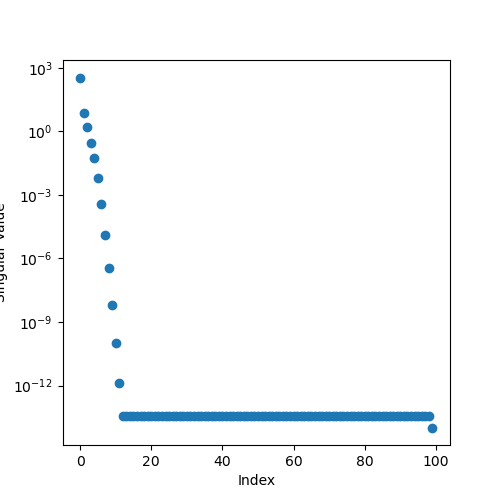

[3.48344326e+02 7.57827662e+00 1.62300408e+00 2.91055772e-01
 5.80095152e-02 6.42066012e-03 3.59723126e-04 1.30576306e-05
 3.39171717e-07 6.64189659e-09 1.01658191e-10 1.24850285e-12
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.46321836e-14 3.46321836e-14 3.46321836e-14
 3.46321836e-14 3.463218

In [964]:
#Singular value decomposition
u, s, v_T = np.linalg.svd(G_copy, full_matrices=True)


#Plotting the singular values
fig,ax = plt.subplots(figsize=[5,5])
ax.scatter(np.arange(0,len(s)),s)
ax.set_xlabel('Index')
ax.set_ylabel('Singular Value')
ax.set_yscale('log')
print(s)
#fig.savefig('singular_values.eps')
plt.show()

In [965]:
p = 6 #Applying the thresholding
u_p = u[:,:p]
s_p = np.diag(s[:p])
vh_p = v_T.T[:,:p]

print('U_p =\n', u_p)
print('S_p =\n',s_p)
print('V_p =\n',vh_p)

U_p =
 [[-0.00044908  0.12682787  0.13280702 -0.13411509 -0.1409293  -0.1707877 ]
 [-0.00059405  0.1258477   0.12952075 -0.12828446 -0.13210326 -0.15556366]
 [-0.00073901  0.12487443  0.12627657 -0.12257972 -0.12354961 -0.14101059]
 ...
 [-0.07540632 -0.01954717  0.05195207  0.08782397 -0.11126506  0.09882048]
 [-0.07555132 -0.01959519  0.05219575  0.0889167  -0.11389925  0.10239562]
 [-0.07569632 -0.0196429   0.05243828  0.09001266 -0.11655535  0.10601564]]
S_p =
 [[3.48344326e+02 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 7.57827662e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.62300408e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 2.91055772e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  5.80095152e-02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.000000

In [966]:
#Now finding the generalized G matrix

g_gen = u_p @ s_p @ vh_p.T
print('G = \n', g_gen)

#And the inverse Gen G matrix

u_p_transpose = u_p.T
s_p_inv = np.linalg.inv(s_p)

g_inv = vh_p @ s_p_inv @ u_p_transpose

print('G^-g = \n', g_inv)

G = 
 [[0.00507596 0.00507594 0.00507595 ... 0.00919461 0.9968345  0.        ]
 [0.01015303 0.01015299 0.01015299 ... 0.01832088 0.993737   0.        ]
 [0.01523008 0.01523003 0.01523003 ... 0.02738029 0.99070692 0.        ]
 ...
 [2.62985176 2.62984646 2.62984657 ... 2.68792212 2.65683593 0.        ]
 [2.63492866 2.63492336 2.63492347 ... 2.69299586 2.66191008 0.        ]
 [2.64000556 2.64000026 2.64000036 ... 2.69807173 2.66698608 0.        ]]
G^-g = 
 [[-0.43124751 -0.39140779 -0.35337246 ...  0.3543607   0.3661895
   0.37815969]
 [-0.43184461 -0.39195026 -0.35386274 ...  0.35479719  0.36664101
   0.37862639]
 [-0.4318324  -0.39193917 -0.35385272 ...  0.35478827  0.36663178
   0.37861685]
 ...
 [-2.59882143 -2.39672828 -2.20279758 ...  0.69066043  0.71836343
   0.74644245]
 [ 0.106107    0.1005511   0.09518559 ... -0.00946133 -0.00985958
  -0.0102635 ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]]


In [967]:
borehole_temp = np.insert(mean_tot.sel(x=slice(top_trend,bottom_trend)).values, 0,46)
borehole_temp

array([ 46.        , -30.42519377, -30.41330058, -30.40744435,
       -30.4033709 , -30.3938861 , -30.38636509, -30.38125979,
       -30.37658631, -30.37523615, -30.36989355, -30.35925921,
       -30.35427601, -30.34398399, -30.33809078, -30.33522758,
       -30.32910467, -30.3237251 , -30.32397046, -30.31600426,
       -30.31050475, -30.30674199, -30.30262881, -30.29626674,
       -30.29296775, -30.28582348, -30.27478659, -30.27435954,
       -30.27451564, -30.27373276, -30.2619823 , -30.25522341,
       -30.25037832, -30.24502822, -30.24107887, -30.23599404,
       -30.23079111, -30.22702249, -30.22334011, -30.21284574,
       -30.2014371 , -30.1929411 , -30.18725321, -30.18330326,
       -30.17658893, -30.1740986 , -30.17054322, -30.16184656,
       -30.15596436, -30.14602013, -30.14225156, -30.13573115,
       -30.12837644, -30.12020552, -30.11444606, -30.11416631,
       -30.10956889, -30.10306675, -30.09333557, -30.09465722,
       -30.0878728 , -30.08373942, -30.07793845, -30.07

<IPython.core.display.Javascript object>


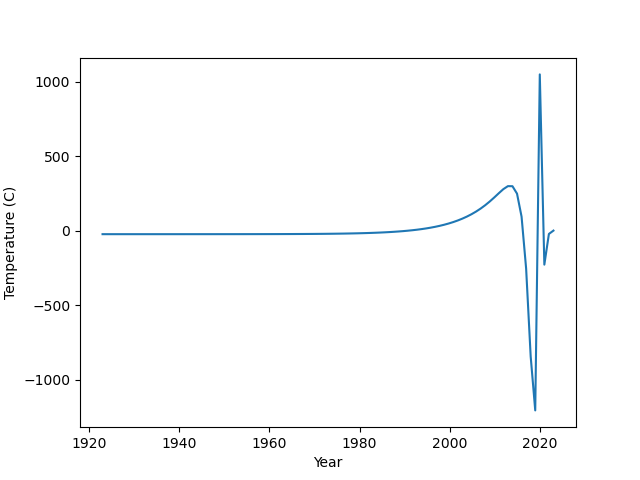

Text(0.5, 0, 'Year')

In [968]:
#model estimates

m_est = g_inv[:,:] @ borehole_temp

fig,ax = plt.subplots()
ax.plot(t,m_est)
ax.set_ylabel('Temperature (C)')
ax.set_xlabel('Year')

<IPython.core.display.Javascript object>


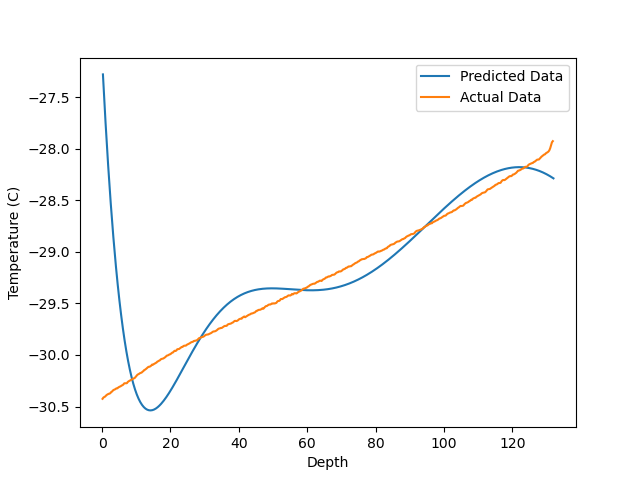

In [949]:
#Predicted data
d_predicted = G_copy @ m_est

fig,ax = plt.subplots()
ax.plot(z,d_predicted, label='Predicted Data')
ax.plot(mean_tot.sel(x=slice(top_trend,bottom_trend)).x - top_trend, mean_tot.sel(x=slice(top_trend,bottom_trend)).values, label='Actual Data')
ax.set_ylabel('Temperature (C)')
ax.set_xlabel('Depth')
plt.legend()

In [156]:
#Monte Carlo

# 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
# 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01
# 3) If r < alpha:
    # append m_i to m_accepted
    # choose m_i+1 = M_i +
        




# 1) Use forward model to calculate the misfit to the data (temperature profile)
# 2) Calculate the log likelihood function. We could use the L2 norm or sum of the absolute of the residuals.
# 3) 

# Monte Carlo of the data

In [511]:
"""
Here,  we will randomly perturb the data and then redo the m = G @ d
"""

'\nHere,  we will randomly perturb the data and then redo the m = G @ d\n'

In [522]:
#Parameters

tmax = 2023
tmin = 1923
zmax = bottom_trend - top_trend#150
dTdz = 0.02
nz = len(mean_tot.sel(x=slice(top_trend,bottom_trend)))
nt = 99
alpha = 35
accumulation = 0

number_of_iterations = 1000

In [513]:
#initial SVD to start the forward model
t_surf = np.eye(nt)

A = np.zeros((nt+1,nz+1))

for i in range(nt):
    this_t_surf = t_surf[i,:]
#     if i == 20: this_t_surf = 10*this_t_surf
    U,t,z = heat(this_t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)
    now = U[:,-1]
    A[i,:] = now
A = A.T
G_matrix = detrend(A,axis=0)
G_copy = G_matrix
#Singular value decomposition
u, s, v_T = np.linalg.svd(G_copy, full_matrices=True)

#Applying the thresholding
p = 4 
u_p = u[:,:p]
s_p = np.diag(s[:p])
vh_p = v_T.T[:,:p]

#Now finding the generalized G matrix

g_gen = u_p @ s_p @ vh_p.T

#And the inverse Gen G matrix

u_p_transpose = u_p.T
s_p_inv = np.linalg.inv(s_p)

g_inv = vh_p @ s_p_inv @ u_p_transpose


In [560]:
m_i = g_inv[:,:-1] @ anomaly.values
model_estimates = [m_i]
input_data = [anomaly.values]
for i in range(number_of_iterations):
    new_data = anomaly.values
    depth_change = np.random.randint(0,anomaly.values.shape[0]) #randomly select a depth to change
    change =  np.random.normal(new_data[depth_change], .05) #change that depth's temperature according to a random gaussian walk 
    print('Original value = ' + str(new_data[depth_change])),
    print('Depth to change = ' + str(depth_change)),
    print('Amount to change = ' + str(change)),
    new_data[depth_change] = new_data[depth_change] + change
    print('New value = ' + str(new_data[depth_change]))
    
    m_new = g_inv[:,:-1] @ new_data
    model_estimates.append(m_new)
    input_data.append(new_data)
    

Original value = -0.021336145673068074
Depth to change = 415
Amount to change = -0.029118136675139187
New value = -0.05045428234820726
Original value = 0.020137485490771212
Depth to change = 161
Amount to change = -0.07178939983238636
New value = -0.051651914341615146
Original value = 0.0007433073388440903
Depth to change = 45
Amount to change = -0.04518645417979853
New value = -0.04444314684095444
Original value = 0.015404906391509599
Depth to change = 155
Amount to change = -0.07916814411242518
New value = -0.06376323772091558
Original value = 0.028337485593201706
Depth to change = 69
Amount to change = 0.014792507853757894
New value = 0.0431299934469596
Original value = -0.009085988951216706
Depth to change = 425
Amount to change = -0.06085845316393379
New value = -0.0699444421151505
Original value = 0.019695201991172695
Depth to change = 459
Amount to change = -0.07512520694542241
New value = -0.05543000495424971
Original value = -0.010747162979715341
Depth to change = 240
Amount t

Original value = 0.0127779931868659
Depth to change = 169
Amount to change = 0.0344112988199983
New value = 0.0471892920068642
Original value = 0.027151797040254166
Depth to change = 131
Amount to change = 0.07889058591429807
New value = 0.10604238295455223
Original value = -0.033259645531792614
Depth to change = 275
Amount to change = 0.03126364219428622
New value = -0.001996003337506394
Original value = 0.14106107453385164
Depth to change = 517
Amount to change = 0.11134892484224262
New value = 0.25240999937609426
Original value = 0.03957308804552184
Depth to change = 98
Amount to change = 0.05699977926650411
New value = 0.09657286731202595
Original value = 0.012000507017614126
Depth to change = 443
Amount to change = -0.02563857780909034
New value = -0.013638070791476213
Original value = -0.03668229215222141
Depth to change = 7
Amount to change = -0.009761185188229105
New value = -0.04644347734045051
Original value = 0.03568150408575832
Depth to change = 107
Amount to change = 0.020

Original value = 0.0340159215784368
Depth to change = 481
Amount to change = 0.07876906845692458
New value = 0.11278499003536138
Original value = -0.03425819185526535
Depth to change = 353
Amount to change = -0.056832915878572
New value = -0.09109110773383736
Original value = 0.02426189065732487
Depth to change = 146
Amount to change = 0.08231609132844166
New value = 0.10657798198576653
Original value = -0.018439999291402387
Depth to change = 248
Amount to change = 0.0230900066227811
New value = 0.004650007331378714
Original value = -0.030856998127234192
Depth to change = 317
Amount to change = -0.05910690000083458
New value = -0.08996389812806876
Original value = 0.03265929494521558
Depth to change = 108
Amount to change = 0.0655564210141209
New value = 0.09821571595933648
Original value = -0.03257105112367853
Depth to change = 354
Amount to change = -0.019371575708949394
New value = -0.051942626832627924
Original value = 0.03810083472889403
Depth to change = 99
Amount to change = -0.

Original value = 0.00813721753418406
Depth to change = 448
Amount to change = 0.04213376426291545
New value = 0.05027098179709951
Original value = -0.028256949743962423
Depth to change = 304
Amount to change = 0.04026848802931732
New value = 0.012011538285354895
Original value = 0.02426145330099061
Depth to change = 473
Amount to change = -0.10056858449856959
New value = -0.07630713119757898
Original value = 0.016544566547462836
Depth to change = 455
Amount to change = 0.053337344546692894
New value = 0.06988191109415573
Original value = 0.0278134049327754
Depth to change = 129
Amount to change = 0.005173146514945985
New value = 0.032986551447721384
Original value = -0.03855273938879478
Depth to change = 359
Amount to change = 0.0013118272760824154
New value = -0.03724091211271236
Original value = 0.03308929749914569
Depth to change = 133
Amount to change = -0.028434662681014244
New value = 0.004654634818131442
Original value = 0.0127779931868659
Depth to change = 169
Amount to change 

Original value = -0.033259645531792614
Depth to change = 275
Amount to change = -0.07370843698304473
New value = -0.10696808251483735
Original value = 0.03790787528862083
Depth to change = 80
Amount to change = -0.041160633817211634
New value = -0.0032527585285908045
Original value = -0.03565571387812483
Depth to change = 329
Amount to change = -0.06168860357948715
New value = -0.09734431745761198
Original value = -0.027277614984104304
Depth to change = 389
Amount to change = 0.05512652818883822
New value = 0.027848913204733913
Original value = 0.024712516697196207
Depth to change = 57
Amount to change = 0.04443322354739351
New value = 0.06914574024458972
Original value = -0.0031917479080583178
Depth to change = 430
Amount to change = -0.04113102923685387
New value = -0.04432277714491219
Original value = 0.06151000460259226
Depth to change = 508
Amount to change = -0.011834939386985474
New value = 0.04967506521560679
Original value = -0.036070045340569123
Depth to change = 367
Amount t

Original value = 0.044303386521914234
Depth to change = 501
Amount to change = 0.07509273651715492
New value = 0.11939612303906916
Original value = -0.021116918705615717
Depth to change = 258
Amount to change = -0.03693310975326912
New value = -0.058050028458884836
Original value = -0.023534449763587872
Depth to change = 253
Amount to change = -0.11263057007844325
New value = -0.1361650198420311
Original value = 0.037873481432729506
Depth to change = 495
Amount to change = 0.015403355768320252
New value = 0.053276837201049754
Original value = -0.014935602288165484
Depth to change = 237
Amount to change = 0.035976197049339464
New value = 0.02104059476117398
Original value = 0.04136259198229553
Depth to change = 111
Amount to change = -0.016119908764037454
New value = 0.025242683218258073
Original value = -0.01420074542346228
Depth to change = 236
Amount to change = -0.07161510814024222
New value = -0.0858158535637045
Original value = -0.01898963162495093
Depth to change = 404
Amount to 

Original value = -0.02193473036277993
Depth to change = 393
Amount to change = -0.03286572171770041
New value = -0.05480045208048034
Original value = -0.04677733754116886
Depth to change = 1
Amount to change = -0.06483612721577649
New value = -0.11161346475694535
Original value = -0.031990530878122314
Depth to change = 352
Amount to change = -0.015984219967244834
New value = -0.04797475084536715
Original value = 3.9101096753313414e-05
Depth to change = 210
Amount to change = -0.022252952314078395
New value = -0.02221385121732508
Original value = 0.018939786841556838
Depth to change = 58
Amount to change = 0.06653068780521887
New value = 0.08547047464677571
Original value = -0.02843762692357643
Depth to change = 17
Amount to change = -0.04434935086058241
New value = -0.07278697778415884
Original value = -0.02178820501063683
Depth to change = 406
Amount to change = -0.012455071394502176
New value = -0.03424327640513901
Original value = 0.04057858759681565
Depth to change = 105
Amount to 

Original value = 0.03316998140546801
Depth to change = 134
Amount to change = -0.07957691674160379
New value = -0.04640693533613578
Original value = 0.0005310259301687381
Depth to change = 40
Amount to change = 0.09440275163245891
New value = 0.09493377756262765
Original value = -0.040777314057347525
Depth to change = 323
Amount to change = -0.0027544428528793047
New value = -0.04353175691022683
Original value = -0.024071587436683473
Depth to change = 23
Amount to change = -0.033654466221785626
New value = -0.0577260536584691
Original value = -0.034212087548628034
Depth to change = 349
Amount to change = -0.0037489347591275306
New value = -0.03796102230775557
Original value = 0.033399703750284004
Depth to change = 477
Amount to change = 0.003466454867012591
New value = 0.0368661586172966
Original value = -0.010747162979715341
Depth to change = 240
Amount to change = -0.03580049653317756
New value = -0.0465476595128929
Original value = -0.014757688984687434
Depth to change = 25
Amount t

Original value = 0.044303386521914234
Depth to change = 501
Amount to change = 0.041954166078434135
New value = 0.08625755260034837
Original value = -0.029047812383041105
Depth to change = 373
Amount to change = -0.05719569087209765
New value = -0.08624350325513876
Original value = -0.028256949743962423
Depth to change = 304
Amount to change = -0.014264639151677416
New value = -0.04252158889563984
Original value = -0.03887423876892271
Depth to change = 9
Amount to change = 0.03320637721961665
New value = -0.005667861549306055
Original value = 0.03635228518313838
Depth to change = 483
Amount to change = 0.0421522780538068
New value = 0.07850456323694519
Original value = -0.022927550487064963
Depth to change = 405
Amount to change = -0.076306335557464
New value = -0.09923388604452896
Original value = 0.014079384879163825
Depth to change = 168
Amount to change = 0.058210238226045596
New value = 0.07228962310520942
Original value = 0.009525177394355211
Depth to change = 450
Amount to chang

Original value = 0.02001092534754889
Depth to change = 465
Amount to change = -0.0040472804926455705
New value = 0.01596364485490332
Original value = 0.04329332370571137
Depth to change = 498
Amount to change = 0.014490492663615614
New value = 0.05778381636932699
Original value = -0.01696864091250916
Depth to change = 31
Amount to change = -0.06316475523770568
New value = -0.08013339615021484
Original value = -0.028006173066120965
Depth to change = 295
Amount to change = -0.09862172305204456
New value = -0.12662789611816552
Original value = 0.03835614055276082
Depth to change = 114
Amount to change = 0.07431174708136384
New value = 0.11266788763412466
Original value = -0.037053886730156194
Depth to change = 318
Amount to change = -0.010387114682501784
New value = -0.047441001412657974
Original value = 0.026704828132334768
Depth to change = 70
Amount to change = 0.06480901351378815
New value = 0.09151384164612292
Original value = 0.006672775803192366
Depth to change = 175
Amount to chan

Original value = 0.023902407276889193
Depth to change = 461
Amount to change = 0.0897436341531541
New value = 0.1136460414300433
Original value = -0.03551254491869571
Depth to change = 365
Amount to change = -0.021407051062081774
New value = -0.05691959598077748
Original value = 0.00813721753418406
Depth to change = 448
Amount to change = -0.00874395634746129
New value = -0.0006067388132772293
Original value = 0.11797678036256087
Depth to change = 516
Amount to change = 0.16815491654820927
New value = 0.2861316969107701
Original value = -0.039423530029292664
Depth to change = 341
Amount to change = -0.007712535170360149
New value = -0.04713606519965281
Original value = -0.014368153399573202
Depth to change = 232
Amount to change = -0.04855602159288596
New value = -0.06292417499245917
Original value = -0.02492250882155389
Depth to change = 18
Amount to change = -0.12069861727009784
New value = -0.14562112609165173
Original value = -0.03855273938879478
Depth to change = 359
Amount to cha

Original value = -0.02193473036277993
Depth to change = 393
Amount to change = -0.176657153949007
New value = -0.19859188431178693
Original value = -0.05423690409016402
Depth to change = 0
Amount to change = 0.013651636804342948
New value = -0.04058526728582107
Original value = -0.020746026713954535
Depth to change = 400
Amount to change = 0.063380337739538
New value = 0.04263431102558346
Original value = -0.010789852261677169
Depth to change = 419
Amount to change = -0.05691387427398399
New value = -0.06770372653566116
Original value = -0.04441237841026435
Depth to change = 327
Amount to change = -0.059415689514636966
New value = -0.10382806792490132
Original value = 0.03554816280231776
Depth to change = 485
Amount to change = 0.019075075342718514
New value = 0.05462323814503628
Original value = -0.0031128987295403476
Depth to change = 428
Amount to change = -0.004538221642048632
New value = -0.00765112037158898
Original value = -0.036501941990479736
Depth to change = 366
Amount to ch

Original value = 0.04023896086021139
Depth to change = 101
Amount to change = 0.054274166668664935
New value = 0.09451312752887633
Original value = -0.04535473094375675
Depth to change = 2
Amount to change = -0.009846209133730396
New value = -0.055200940077487146
Original value = -0.027601107364670696
Depth to change = 377
Amount to change = -0.07177646937157688
New value = -0.09937757673624757
Original value = -0.03327224526476158
Depth to change = 301
Amount to change = 0.05409251038774454
New value = 0.02082026512298296
Original value = 0.003564856472380029
Depth to change = 43
Amount to change = 0.07446231295714612
New value = 0.07802716942952614
Original value = -0.0398332501650458
Depth to change = 319
Amount to change = -0.06410292454225959
New value = -0.10393617470730539
Original value = -0.002583063626033777
Depth to change = 440
Amount to change = 0.025989695379197715
New value = 0.023406631753163938
Original value = -0.02744324903751405
Depth to change = 381
Amount to chang

Original value = -0.024527496524861192
Depth to change = 20
Amount to change = -0.041181808638297526
New value = -0.06570930516315872
Original value = -0.003531346541961966
Depth to change = 39
Amount to change = -0.0036136484774733964
New value = -0.0071449950194353625
Original value = -0.020202782119458362
Depth to change = 259
Amount to change = -0.03937673991868129
New value = -0.059579522038139654
Original value = -0.0028396924154243663
Depth to change = 201
Amount to change = 0.02138696261548738
New value = 0.018547270200063012
Original value = 0.020137485490771212
Depth to change = 161
Amount to change = 0.052955784026091156
New value = 0.07309326951686237
Original value = 0.03181593420660889
Depth to change = 128
Amount to change = -0.01091770965287521
New value = 0.020898224553733677
Original value = 0.03326095939558016
Depth to change = 484
Amount to change = 0.09980521503860156
New value = 0.13306617443418173
Original value = 0.004634720700956052
Depth to change = 182
Amount

Original value = -0.027966220293262012
Depth to change = 378
Amount to change = 0.0684461727911897
New value = 0.040479952497927685
Original value = -0.03383239808959715
Depth to change = 369
Amount to change = 0.009910676351150983
New value = -0.023921721738446165
Original value = -0.014368153399573202
Depth to change = 232
Amount to change = -0.049885647059148726
New value = -0.06425380045872192
Original value = -0.03154431295248017
Depth to change = 306
Amount to change = 0.012370546687111246
New value = -0.019173766265368923
Original value = 0.14106107453385164
Depth to change = 517
Amount to change = 0.17151090349347403
New value = 0.31257197802732567
Original value = 0.03611564928366562
Depth to change = 487
Amount to change = -0.004260984518450202
New value = 0.03185466476521542
Original value = 0.0209358315544641
Depth to change = 143
Amount to change = 0.14894997977847632
New value = 0.16988581133294042
Original value = 0.00426309701255434
Depth to change = 437
Amount to chang

Original value = 0.006226997483221197
Depth to change = 181
Amount to change = -0.042773664746790355
New value = -0.03654666726356916
Original value = 0.029839932795972857
Depth to change = 125
Amount to change = 0.09281858146625148
New value = 0.12265851426222434
Original value = -0.027966220293262012
Depth to change = 378
Amount to change = -0.0873540207917188
New value = -0.11532024108498082
Original value = 0.044303386521914234
Depth to change = 501
Amount to change = 0.015346196117766844
New value = 0.05964958263968108
Original value = -0.015133396035366786
Depth to change = 35
Amount to change = 0.010100656096802187
New value = -0.005032739938564599
Original value = 0.009984543490919151
Depth to change = 178
Amount to change = -0.0037673204887368143
New value = 0.006217223002182337
Original value = 0.011605144241030985
Depth to change = 457
Amount to change = 0.042258716743438486
New value = 0.05386386098446947
Original value = 0.04020168656396805
Depth to change = 486
Amount to 

<IPython.core.display.Javascript object>


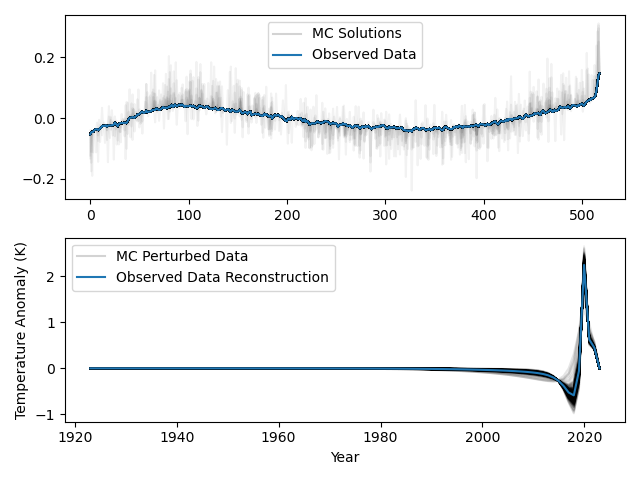

In [607]:
from scipy.stats import gaussian_kde



fig, (ax2, ax1) = plt.subplots(2,1)

ax1.plot(t, np.asarray(model_estimates).T[:,-1], color = 'lightgrey', label = 'MC Perturbed Data')
ax1.plot(t, np.asarray(model_estimates).T, color = 'black', alpha=0.05)
ax1.plot(t, m_i, label = 'Observed Data Reconstruction')
ax1.set_ylabel('Temperature Anomaly (K)')
ax1.set_xlabel('Year')
ax1.legend()

ax2.plot(np.asarray(input_data).T[:,-1], color = 'lightgrey', label = 'MC Solutions', )
ax2.plot(np.asarray(input_data).T, color = 'black',  alpha=0.05)
ax2.plot(anomaly.values, label = 'Observed Data')
ax2.legend()


plt.tight_layout()
plt.show()

In [583]:
xy.shape

(100, 1001)

In [566]:
np.asarray(model_estimates).T.shape

(100, 1001)

# Can we initialize forward model now by perturbing with a wave function instead of a delta function?


### We can change the wave frequency, phase, and amplitude.

In [655]:
#Parameters

tmax = 2023
tmin = 1923
zmax = bottom_trend - top_trend#150
dTdz = 0.02
nz = len(mean_tot.sel(x=slice(top_trend,bottom_trend)))
nt = 99
alpha = 35
accumulation = 0

number_of_iterations = 100

In [656]:
#initial SVD to start the forward model
t_surf = np.eye(nt)

A = np.zeros((nt+1,nz+1))

for i in range(nt):
    this_t_surf = t_surf[i,:]
#     if i == 20: this_t_surf = 10*this_t_surf
    U,t,z = heat(this_t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)
    now = U[:,-1]
    A[i,:] = now
A = A.T
G_matrix = detrend(A,axis=0)
G_copy = G_matrix
#Singular value decomposition
u, s, v_T = np.linalg.svd(G_copy, full_matrices=True)

#Applying the thresholding
p = 4 
u_p = u[:,:p]
s_p = np.diag(s[:p])
vh_p = v_T.T[:,:p]

#Now finding the generalized G matrix

g_gen = u_p @ s_p @ vh_p.T

#And the inverse Gen G matrix

u_p_transpose = u_p.T
s_p_inv = np.linalg.inv(s_p)

g_inv = vh_p @ s_p_inv @ u_p_transpose


In [657]:
#Initialize model estimate
m_i = g_inv[:,:-1] @ anomaly.values

models = []
pred_data = []

In [712]:
import copy

# 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
m_est = g_inv[:,:-1] @ anomaly.values

d_pred_i = G_copy @ m_est
d_obs = anomaly.values
#r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
m_accepted = [m_est]
m_not_accepted = []
predicted_data = []
r_values = [r_i]
sigma = 0.01 #st dev of temperature measurement
alpha = 100 #some number threshold
all_amps = []
all_phase = []
all_freq = []
for i in range(5000):

    # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
    m_est = g_inv[:,:-1] @ anomaly.values
#     m_i = m_est
#     m_accepted = [m_i]
#     d_pred_i = G_copy @ m_i
#     d_obs = anomaly.values
    #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
#     r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
    amplitude = np.random.uniform(0,2) #randomly choose an amplitude for the temperature signal
    all_amps.append(amplitude)
    phase = np.random.uniform(-2*np.pi, 2*np.pi)
    all_phase.append(phase)
    freq = np.random.uniform(0.0001, .01)
    all_freq.append(freq)
    clim_sig_add = amplitude * np.sin(freq*t + phase)
#     m_next = m_accepted[-1] #set the temp history as the most recent one to be accepted
    
    m_next_copy = copy.deepcopy(m_accepted[-1])
    
    m_next_copy = m_next_copy + clim_sig_add
    #Predicted data
    d_pred = G_copy @ m_next_copy

    # 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01
    
    r = sum(np.abs(d_pred[:-1] - d_obs))
    #r = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred[:-1])**2))**2 / 2*(sigma**2))
    #print('r = ' + str(r)+ ', and r_0 = ' + str(r_i))

    ### Do this to always improve ###
    
    if r < r_values[-1]:
        r_values.append(r)
        m_accepted.append(m_next_copy)
        predicted_data.append(d_pred)
        print('r = ' + str(r))
    if r > r_values[-1]:
        m_not_accepted.append(m_next_copy)
        #print(r)
        
#     ### Do this to always to always keep performers that beat the SVD ###
    
#     if r < r_i:
#         r_values.append(r)
#         m_accepted.append(m_next_copy)
#         predicted_data.append(d_pred)
#         print('r = ' + str(r))
#     if r > r_i:
#         m_not_accepted.append(m_next_copy)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_accepted).T)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_not_accepted).T)

r = 2.1193905661527235
r = 2.1191570551977947
r = 2.118970663308754
r = 2.118862792100048
r = 2.1179455692593847
r = 2.117932069605328
r = 2.11786475535751
r = 2.1144885438114565
r = 2.113338763045425
r = 2.1117972480506135
r = 2.109160382373143
r = 2.1090271252458437
r = 2.1089746266545464
r = 2.1089726156946313
r = 2.108959158201215
r = 2.108921053481492
r = 2.1089203701275565
r = 2.108329557929175
r = 2.1083234489046396
r = 2.1083199733633204
r = 2.108253699386054
r = 2.1053519617396876
r = 2.105303587474188
r = 2.105269144143532
r = 2.105257661795526
r = 2.1052518268588045
r = 2.1052301675180853
r = 2.105222306022951
r = 2.1052199352099206
r = 2.1052184149716626
r = 2.10511441526205
r = 2.1051097346061916
r = 2.105105404151086
r = 2.105105009378441
r = 2.10509366745963
r = 2.1050839997819737
r = 2.1050671973776125
r = 2.1050662491008785
r = 2.1050620423628064
r = 2.1050564005916255


<IPython.core.display.Javascript object>


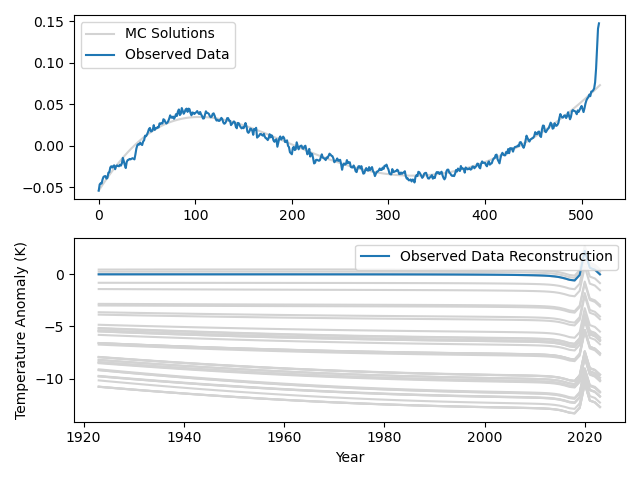

In [714]:
from scipy.stats import gaussian_kde



fig, (ax2, ax1) = plt.subplots(2,1)

ax1.plot(t, np.asarray(m_accepted).T, color = 'lightgrey')
ax1.plot(t, m_i, label = 'Observed Data Reconstruction')
ax1.set_ylabel('Temperature Anomaly (K)')
ax1.set_xlabel('Year')
ax1.legend()

ax2.plot(np.asarray(predicted_data).T[:,-1], color = 'lightgrey', label = 'MC Solutions', )
ax2.plot(np.asarray(d_obs).T, color = 'black',  alpha=0.05)
ax2.plot(anomaly.values, label = 'Observed Data')
ax2.legend()


plt.tight_layout()
plt.show()

# Reset every time

In [700]:
#Parameters

tmax = 2023
tmin = 1923
zmax = bottom_trend - top_trend#150
dTdz = 0.02
nz = len(mean_tot.sel(x=slice(top_trend,bottom_trend)))
nt = 99
alpha = 35
accumulation = 0

number_of_iterations = 100

In [701]:
#initial SVD to start the forward model
t_surf = np.eye(nt)

A = np.zeros((nt+1,nz+1))

for i in range(nt):
    this_t_surf = t_surf[i,:]
#     if i == 20: this_t_surf = 10*this_t_surf
    U,t,z = heat(this_t_surf,
         tmax = tmax,
         tmin = tmin,
         zmax = zmax,
         dTdz = dTdz,
         nz = nz,
         nt = nt,
         alpha = alpha,
         accumulation = accumulation)
    now = U[:,-1]
    A[i,:] = now
A = A.T
G_matrix = detrend(A,axis=0)
G_copy = G_matrix
#Singular value decomposition
u, s, v_T = np.linalg.svd(G_copy, full_matrices=True)

#Applying the thresholding
p = 4 
u_p = u[:,:p]
s_p = np.diag(s[:p])
vh_p = v_T.T[:,:p]

#Now finding the generalized G matrix

g_gen = u_p @ s_p @ vh_p.T

#And the inverse Gen G matrix

u_p_transpose = u_p.T
s_p_inv = np.linalg.inv(s_p)

g_inv = vh_p @ s_p_inv @ u_p_transpose

In [709]:
import copy

# 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
m_est = g_inv[:,:-1] @ anomaly.values

d_pred_i = G_copy @ m_est
d_obs = anomaly.values
#r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
m_accepted = [m_est]
m_not_accepted = []
predicted_data = []
r_values = [r_i]
sigma = 0.01 #st dev of temperature measurement
alpha = 100 #some number threshold
all_amps = []
all_phase = []
all_freq = []
for i in range(5000):

    # 1) guess m_i (we have a good guess right now, the first m_est we calculated). This will be the first iteration of the MC
    m_est = g_inv[:,:-1] @ anomaly.values
#     m_i = m_est
#     m_accepted = [m_i]
#     d_pred_i = G_copy @ m_i
#     d_obs = anomaly.values
    #r_i = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred_i[:-1])**2))**2 / 2*(sigma**2))
#     r_i = sum(np.abs(d_pred_i[:-1] - d_obs))
    amplitude = np.random.uniform(-2,2) #randomly choose an amplitude for the temperature signal
    all_amps.append(amplitude)
    phase = np.random.uniform(-2*np.pi, 2*np.pi)
    all_phase.append(phase)
    freq = np.random.uniform(0.0001, .01)
    all_freq.append(freq)
    clim_sig_add = amplitude * np.sin(freq*t + phase)
#     m_next = m_accepted[-1] #set the temp history as the most recent one to be accepted
    
    m_next_copy = copy.deepcopy(m_est)
    
    m_next_copy = m_next_copy + clim_sig_add
    #Predicted data
    d_pred = G_copy @ m_next_copy

    # 2) r = (1 / (sqrt(2*pi) * sigma)) * exp(-(sum((d_obs - d_pred)**2))**2 / 2*(sigma**2) sigma = 0.01
    
    r = sum(np.abs(d_pred[:-1] - d_obs))
    #r = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(sum((d_obs - d_pred[:-1])**2))**2 / 2*(sigma**2))
    #print('r = ' + str(r)+ ', and r_0 = ' + str(r_i))

    ### Do this to always improve ###
    
    if r < r_i:
        r_values.append(r)
        m_accepted.append(m_next_copy)
        predicted_data.append(d_pred)
        print('r = ' + str(r))
    if r > r_i:
        m_not_accepted.append(m_next_copy)
        #print(r)
        
#     ### Do this to always to always keep performers that beat the SVD ###
    
#     if r < r_i:
#         r_values.append(r)
#         m_accepted.append(m_next_copy)
#         predicted_data.append(d_pred)
#         print('r = ' + str(r))
#     if r > r_i:
#         m_not_accepted.append(m_next_copy)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_accepted).T)

# fig, ax= plt.subplots()
# ax.plot(m_est)
# ax.plot(np.asarray(m_not_accepted).T)

r = 2.1193097066002866
r = 2.118899630236251
r = 2.120905441039043
r = 2.1204437028130076
r = 2.120113847119616
r = 2.1192660232029534
r = 2.118897861521918
r = 2.118917694428295
r = 2.1191270422633295
r = 2.1193164363296133
r = 2.119052025228123
r = 2.1189151743094645
r = 2.1204750603639484
r = 2.118939085089463
r = 2.1202181826690514
r = 2.1194909512568265
r = 2.1198094074132374
r = 2.119453677547356
r = 2.1191171297127904
r = 2.119923938482614
r = 2.1188951127076083
r = 2.120829875207402
r = 2.1202981921642925
r = 2.119069195647647
r = 2.1200921562044948
r = 2.1204157574088414
r = 2.119577360227826
r = 2.118902972600467
r = 2.1193531874855864
r = 2.119274019499258
r = 2.1135006812140853
r = 2.118993297876074
r = 2.119472192901623
r = 2.1202561073927955
r = 2.1195560538741716
r = 2.1189719362244124
r = 2.118900362134815
r = 2.1164231149272195
r = 2.1194324416009276
r = 2.120608129301618
r = 2.1195874555992886
r = 2.1199707230940326
r = 2.119670623077221
r = 2.1203863296773973
r = 2.1

r = 2.1189556123212565
r = 2.1167217227920294
r = 2.118704701002617
r = 2.1198141298272075
r = 2.1190683840502453
r = 2.119615570078754
r = 2.1180548545632605
r = 2.118912262769429
r = 2.1209793893705178
r = 2.1205103017564455
r = 2.1201234732925953
r = 2.119072119362671
r = 2.1205435113231204
r = 2.1193496926163564
r = 2.1192672171143867
r = 2.119029568913624
r = 2.1189481342185155
r = 2.1196255632223324
r = 2.1203826943701563
r = 2.1147773178037137
r = 2.119224771367136
r = 2.120576686434714
r = 2.1202436787445658
r = 2.1188778524195846
r = 2.1192653633218366
r = 2.1185286862142596
r = 2.1208856462054353
r = 2.1194416981401845
r = 2.1187686049716716
r = 2.1194959649777445
r = 2.1189312303306815
r = 2.1166038362777173
r = 2.120057076951402
r = 2.1180069075819516
r = 2.1209734835108924
r = 2.118766892716453
r = 2.1198042295702795
r = 2.118901909878768
r = 2.1199562686412796
r = 2.1193061438940473
r = 2.1189095752869695
r = 2.1202282002588437
r = 2.119754342814046
r = 2.1189097920364723

<IPython.core.display.Javascript object>


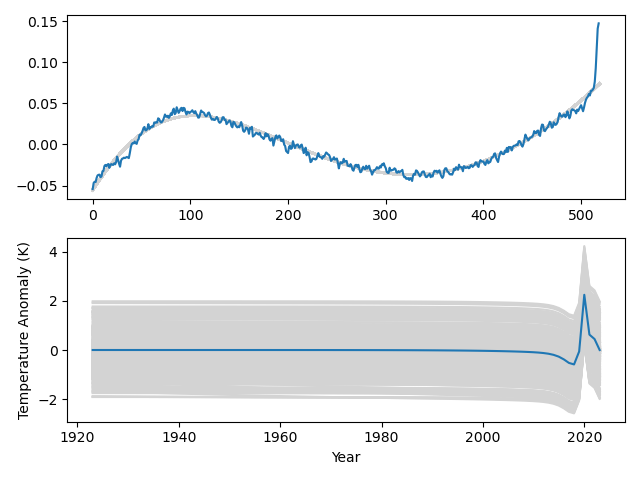

In [711]:
fig, (ax2, ax1) = plt.subplots(2,1)

ax1.plot(t, np.asarray(m_accepted).T, color = 'lightgrey')
ax1.plot(t, m_i, label = 'Observed Data Reconstruction')
ax1.set_ylabel('Temperature Anomaly (K)')
ax1.set_xlabel('Year')
#ax1.legend()

ax2.plot(np.asarray(predicted_data).T, color = 'lightgrey', label = 'MC Solutions', )
ax2.plot(np.asarray(d_obs).T, color = 'black',  alpha=0.05)
ax2.plot(anomaly.values, label = 'Observed Data')
#ax2.legend()


plt.tight_layout()
plt.show()